<a href="https://colab.research.google.com/github/ALRIER/MultilayerNetworks_InsectsPUB/blob/main/Insectos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Paquetes

In [1]:
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import Counter
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import networkx as nx
from collections import ChainMap
from sklearn.preprocessing import FunctionTransformer
import spacy
import os
import itertools
import community
from community import community_louvain
from networkx.algorithms import community as nx_community
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.patches as mpatches
from sklearn.cluster import AgglomerativeClustering
from community.community_louvain import best_partition
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
nltk.download('wordnet')
from sklearn.feature_extraction.text import CountVectorizer
import string
import operator
import math
import pickle
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from collections import defaultdict
from networkx.algorithms import centrality
import random

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
folder ='/content/drive/MyDrive/Projects/Insects'
os.chdir(folder) # Cambia el directorio de trabajo

In [ ]:
file_list = os.listdir() # Obtén la lista de archivos en la carpeta
data_frames = {} # Crea un diccionario para almacenar los DataFrames
for file in file_list:
    if file.endswith('.xlsx') or file.endswith('.csv'):  # Verifica si el archivo es XLSX o CSV
        if file.endswith('.xlsx'):
            data_frames[file] = pd.read_excel(file)
        elif file.endswith('.csv'):
            data_frames[file] = pd.read_csv(file)
# Imprime los nombres de los DataFrames y su información básica
for file, df in data_frames.items():
    print(f"Archivo: {file}")

Archivo: datos.csv
Archivo: df_respuestas.csv
Archivo: Copy of MATRIZ 1-NO CONSUMIDORES.xlsx
Archivo: Copy of MATRIZ 2-CONSUMIDORES.xlsx
Archivo: MATRIZ 1-NO CONSUMIDORES.xlsx
Archivo: MATRIZ 2-CONSUMIDORES.xlsx
Archivo: NOCOMPARED_MATRIX.xlsx
Archivo: cleaned_text.csv
Archivo: texto_completo.csv
Archivo: noncons.csv
Archivo: cons.csv
Archivo: COMPARED_MATRIX.xlsx
Archivo: Characteristics2DF.csv
Archivo: CulturalBeleifsDF.csv
Archivo: KnowledgeDF.csv
Archivo: ChildhoodDF.csv
Archivo: RecentExperiencesDF.csv
Archivo: corrected_network1DF.csv
Archivo: network1DF.csv


In [ ]:
data_names = {key: value for key, value in data_frames.items()}
for key, value in data_names.items():
    print("DataFrame:", key)

DataFrame: datos.csv
DataFrame: df_respuestas.csv
DataFrame: Copy of MATRIZ 1-NO CONSUMIDORES.xlsx
DataFrame: Copy of MATRIZ 2-CONSUMIDORES.xlsx
DataFrame: MATRIZ 1-NO CONSUMIDORES.xlsx
DataFrame: MATRIZ 2-CONSUMIDORES.xlsx
DataFrame: NOCOMPARED_MATRIX.xlsx
DataFrame: cleaned_text.csv
DataFrame: texto_completo.csv
DataFrame: noncons.csv
DataFrame: cons.csv
DataFrame: COMPARED_MATRIX.xlsx
DataFrame: Characteristics2DF.csv
DataFrame: CulturalBeleifsDF.csv
DataFrame: KnowledgeDF.csv
DataFrame: ChildhoodDF.csv
DataFrame: RecentExperiencesDF.csv
DataFrame: corrected_network1DF.csv
DataFrame: network1DF.csv


In [ ]:
compared = pd.read_excel('COMPARED_MATRIX.xlsx')
compared.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 35 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   P1-EATING PATTERN-CONS                                          1 non-null      object 
 1   P1-EATING PATTERN-NONCONS                                       1 non-null      object 
 2   P2-CHARACTERISTICS AND PREFERENCES-CONS                         1 non-null      object 
 3   P2-CHARACTERISTICS AND PREFERENCES-NONCONS                      1 non-null      object 
 4   P3- CHARACTERISTICS OF NON-PREFERRED FOODS-CONS                 1 non-null      object 
 5   P3- CHARACTERISTICS OF NON-PREFERRED FOODS-NONCONS              1 non-null      object 
 6   P40- CHILDHOOD EXPERIENCES WITH PREFERRED FOODS-CONS            1 non-null      object 
 7   P40- CHILDHOOD EXPERIENCES WITH PREFERRED FOODS-NONCONS  

In [ ]:
# Concatenar las filas de 'Totalconsum' y 'Totalnonconsum' en un solo string
"""fullcon = ' '.join(compared['Totalconsum'].dropna().astype(str))
fullnon = ' '.join(compared['Totalnonconsum'].dropna().astype(str))
redcons = pd.Series(fullcon)
rednon = pd.Series(fullnon)"""

"fullcon = ' '.join(compared['Totalconsum'].dropna().astype(str))\nfullnon = ' '.join(compared['Totalnonconsum'].dropna().astype(str))\nredcons = pd.Series(fullcon)\nrednon = pd.Series(fullnon)"

#todo

#Coocurrences Matrix


#P1-EATING PATTERN

In [ ]:
p1cons= compared['P1-EATING PATTERN-CONS'].astype(str)
p1noncons= compared['P1-EATING PATTERN-NONCONS'].astype(str)

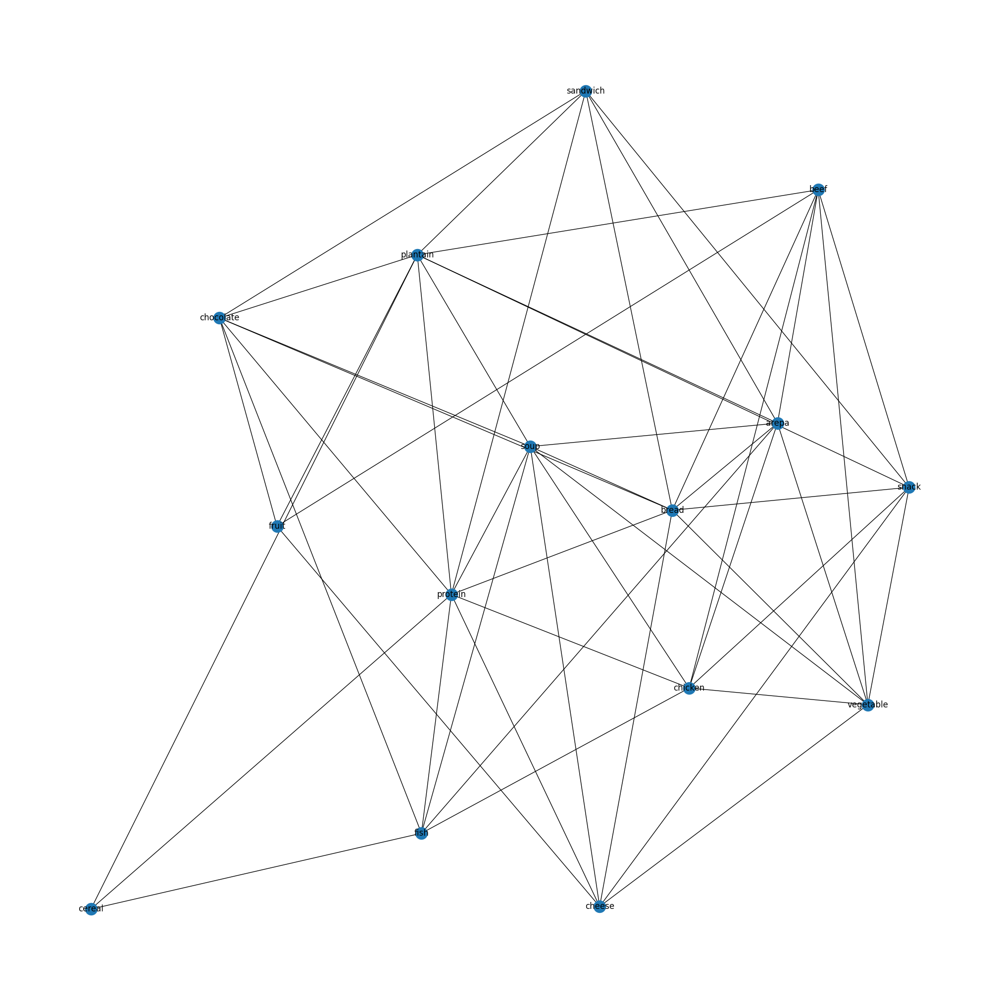

In [ ]:
def clean_text(text):
    additional_stopwords = ['ve', 'we', 'overall', 'she', 'it', 'he', 'avoid',
                            'called', 'audition', 'adhere', 'after', 'brownie',
                            'apple', 'arepuelas']
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
all_network_labels = {}
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.5:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['water','addition', 'afternoon', 'almost', 'alone', 'along', 'also', 'although', 'always', 'amount', 'another', 'anything', 'appetite', 'approximately', 'arepas', 'around', 'available', 'baby', 'back', 'balanced', 'based', 'basic', 'beverage', 'breakfast', 'breast', 'breastfeeding', 'carbohydrate', 'carnivorous', 'change', 'chickpea','choice', 'cola', 'cold', 'come', 'common', 'compared', 'complement', 'completely', 'consistent', 'consisting', 'consists', 'constant', 'consume', 'cooked', 'cookie', 'cooking', 'cooky', 'corn', 'could', 'course', 'crackling', 'cu', 'cucumber', 'cupcake', 'currently', 'cut', 'daily', 'dairy', 'decrease', 'depending', 'detrimental', 'diet', 'dinner', 'dish', 'dont', 'drink', 'eating', 'effort', 'either', 'eliminated', 'eliminating', 'else', 'empanada', 'emphasize', 'enjoy', 'especially', 'even', 'evening', 'every', 'everything', 'except', 'exclusively', 'fall', 'fast', 'favorite', 'feel', 'find', 'focus', 'focusing', 'follow', 'following', 'food', 'form', 'frequently', 'generally', 'going', 'good', 'grain', 'gram', 'grape', 'green', 'guava', 'habit', 'hardly', 'health', 'healthier', 'healthily', 'herbal', 'home', 'hour', 'house', 'hungry', 'hurry', 'improving', 'include', 'includes', 'including', 'increased', 'indulge', 'instance', 'intake', 'interestingly', 'item', 'juice', 'kind', 'known', 'lack', 'later', 'le', 'leftover', 'legume', 'level', 'light', 'lighter', 'like', 'liquid', 'little', 'lunch', 'lunchtime', 'made', 'main', 'mainly', 'maintain', 'make', 'many', 'mashed', 'maybe', 'meal', 'mean', 'meat', 'menu', 'method', 'midday', 'midmorning', 'might', 'missing', 'moderate', 'mogolla', 'morning', 'mostly', 'moving', 'much', 'night', 'normal', 'nowadays', 'oat', 'occasion', 'occasionally', 'often', 'option', 'packaged', 'pancake', 'pand', 'part', 'particular', 'passion', 'paste', 'peach', 'pear', 'penchant', 'pevery', 'piece', 'pineapple', 'plate', 'plenty', 'pof', 'possible', 'prepare', 'prepared', 'primarily', 'quick', 'quite', 'rarely', 'really', 'reason', 'reduced', 'refined', 'regular', 'regularly', 'rely', 'restaurant', 'restricting',  'scrambled', 'serving', 'significant', 'similar', 'since', 'situation', 'small', 'snacking', 'soda', 'solid', 'something', 'sometimes', 'sou' 'source', 'squash', 'start', 'started', 'steamed', 'stick', 'still', 'strict', 'strictly', 'substantial', 'sweet', 'taste', 'tend', 'though', 'three', 'throughout', 'time', 'toast', 'today', 'topped', 'towards', 'turn', 'type', 'typical', 'typically', 'unhealthy', 'urge', 'used', 'usual', 'usually', 'variation', 'variety', 'various', 'vary', 'way', 'week', 'well', 'white', 'without', 'work', 'would', 'year']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
p1c = p1cons.apply(clean_text)
network1 = create_red(p1c, 'network1')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network1)
dfx

,Node,Total Co-occurrence Frequency
10,protein,3234
5,chicken,2200
2,bread,2147
14,vegetable,1653
0,arepa,1300
12,snack,1001
13,soup,987
4,cheese,981
7,fish,979
9,plantain,896


In [ ]:
# Texto proporcionado
texto = """
15	lemon	176
19	omelet	176
7	carrot	176
5	blackberry	176
30	watermelon	176
27	strawberry	352
2	banana	352
3	bean	352
21	pizza	352
20	papaya	352
28	tuna	352
18	milk	352
17	lettuce	352
1	avocado	352
14	empanadas	352
12	chorizo	352
16	lentil	352
"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'lemon','omelet','carrot','blackberry','watermelon','strawberry','banana','bean','pizza','papaya','tuna','milk','lettuce','avocado','empanadas','chorizo','lentil'


#1N

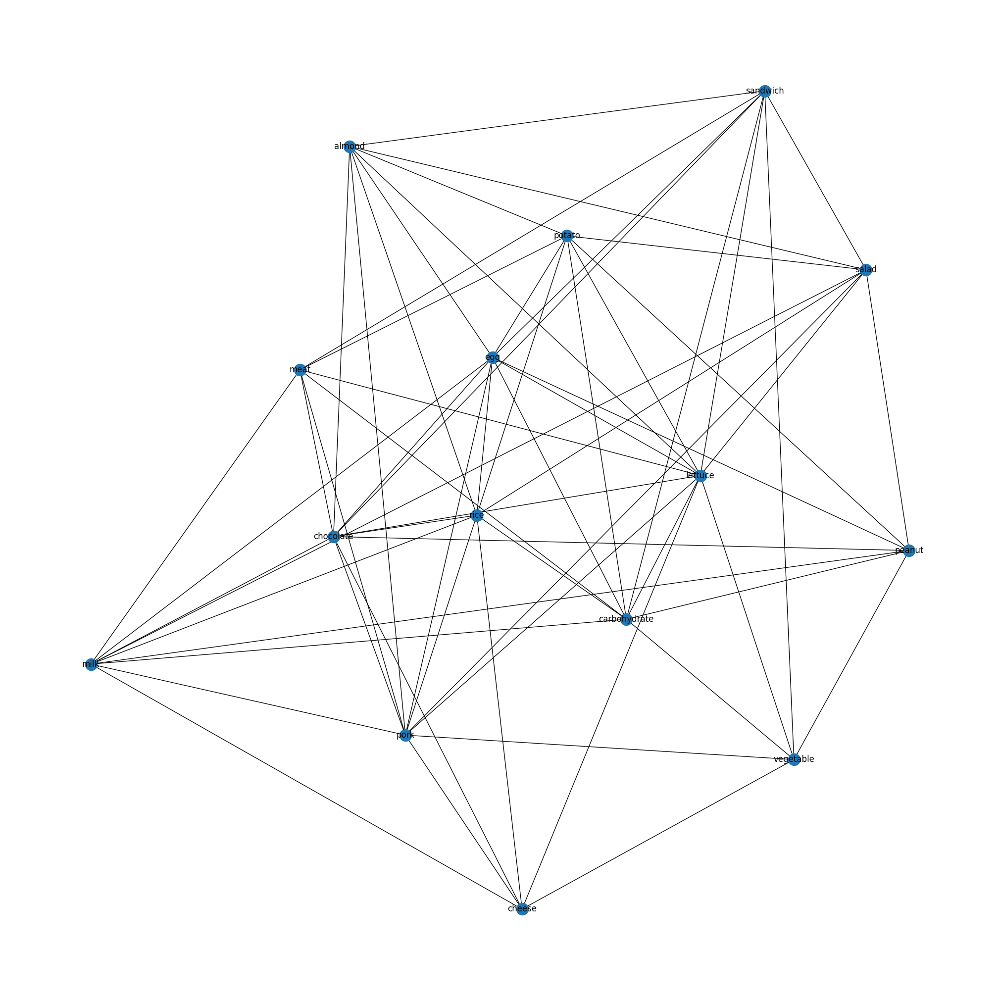

In [ ]:
def clean_text(text):
    additional_stopwords = ['ve', 'we', 'overall', 'she', 'it', 'he', 'avoid',
                            'called', 'audition', 'adhere', 'after', 'brownie',
                            'apple', 'arepuelas']
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.5:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = [
'academic', 'accompanied','accompany', 'additionally', 'afternoon', 'along', 'also', 'although', 'always', 'animal', 'another', 'around', 'available', 'bar', 'based', 'basic', 'breakfast', 'broth', 'chickpea', 'class', 'consist', 'consisting', 'consists', 'consume', 'consumed', 'contain', 'cooky', 'corn', 'course', 'daily', 'dairy', 'delight', 'depending', 'depends', 'different', 'dinner', 'dish', 'diverse', 'dont', 'drink', 'early', 'eating', 'either', 'enjoy', 'evening', 'find', 'focus', 'followed', 'food', 'form', 'four', 'full', 'grain', 'granadilla', 'granola', 'green', 'home', 'hour', 'hunger', 'include', 'includes', 'including', 'incorporate', 'juice', 'kind', 'later', 'left', 'leftover', 'light', 'lighter', 'like', 'local', 'lunch', 'main', 'mandarin', 'meal', 'menu', 'midmorning', 'might', 'milkbased', 'morning', 'mostly', 'night', 'noon', 'nut', 'occasionally', 'often', 'option', 'otherwise', 'packaged', 'part', 'pea', 'piece', 'plain', 'plenty', 'portion', 'product', 'protein', 'pwith', 'raisin', 'rarely', 'regular', 'repeat', 'repeated', 'rest', 'right', 'room', 'routine', 'santafereño', 'scrambled', 'serving', 'side', 'similar', 'slice', 'small', 'smaller', 'snack', 'soda', 'something', 'sometimes', 'sou', 'soup', 'source', 'starch', 'start', 'studying', 'sweet', 'switch', 'though', 'three', 'throughout', 'time', 'toast', 'treat', 'turnover', 'type', 'typical', 'typically', 'university', 'usual', 'usually', 'varied', 'varies', 'variety', 'various', 'vary', 'well', 'whatever', 'wheat', 'whether', 'whole']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
p1n = p1noncons.apply(clean_text)
network1n = create_red(p1n, 'network1n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network1n)
dfx

,Node,Total Co-occurrence Frequency
11,rice,1406
4,egg,1134
3,chocolate,1131
10,potato,913
6,meat,833
1,carbohydrate,792
14,vegetable,700
5,lettuce,666
9,pork,560
0,almond,539


In [ ]:
# Texto proporcionado
texto = """
15	melon	992
1	bean	992
8	cucumber	992
2	beef	992
"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'melon','bean','cucumber','beef'


#P2-CHARACTERISTICS AND PREFERENCES

In [ ]:
p2cons= compared['P2-CHARACTERISTICS AND PREFERENCES-CONS'].astype(str)
p2noncons= compared['P2-CHARACTERISTICS AND PREFERENCES-NONCONS'].astype(str)

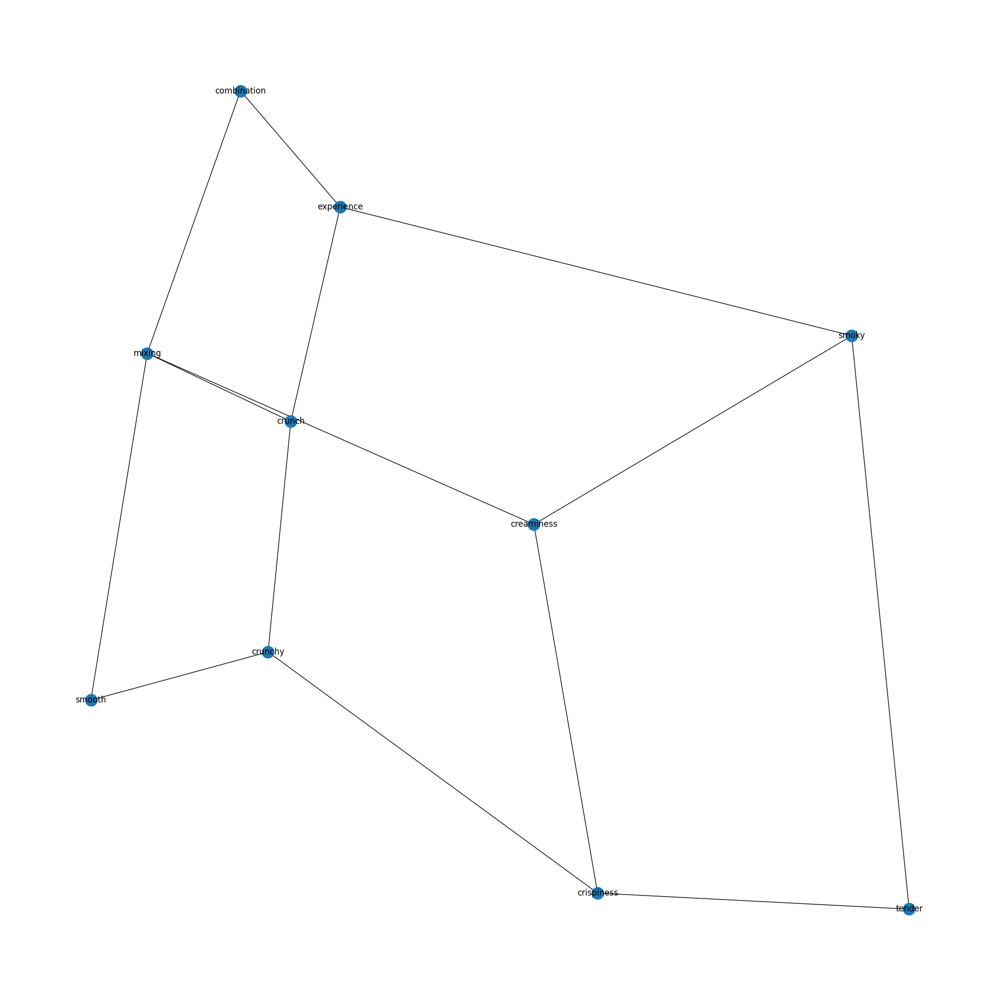

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.22:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['equilibrium','escape','everevolving','everexpanding','excites','enrich','expand','expectation','expedition','experiencing','experiment','explored','enriches','enhances','greasy','edible','dynamic','eager','eagerly','easy','ecstasy','edge','effect','enhance','egg','elevate','elevates','encountered','end','enduring','explorer','explosion','exquisite','gain','fork','fortunate','fracture','french','fry','full','gateway','extra','glide','global','go','goldenhued','graced','grease','fondness','foam','flood','flesh','finding','fillet','fiery','fettuccine','fattening','fascination','fascinating','farmer','familiar','fails','exudes','extremely','extraaged','zucchini','flavor','flaky','tactile','tahini','creative','wanted','universal','wall','voyage','vitality','vital','vendor','vast','vary','varies','varied','used','upon','unveil','universe','teeth','tasted','tangible','seasoned','side','shrimp','shredded','shred','sheer','shatters','share','served','sensorial','sense','seemingly','seem','seeing','seared','simply','scrambled','satisfy','sampling','sample','samosa','salty','salt','said','rough','rolled','roll','role','roasted','simple','single','taken','steak','sure','supple','sunsoaked','summary','succulence','substantial','sublime','strength','strand','story','stimulating','stew','step','state','slip','starting','stall','stage','spring','spread','spark','southeast','soup','snap','matter','small','slowly','maybe','ability','match','coating','city','clear','cling','clinging','coated','cold','chicharrón','colombi','companion','complexity','condiment','connecting','chickpea','chewy','consider','cause','cacophony','captivated','caramel','carbonara','carrot','case','celebration','chewiness','challenge','champion','change','char','cheddar','chef','connection','constant','dissolve','delectable','culminates','curious','dairy','deconstructed','deeply','defies','deliver','depends','derive','described','design','designed','desire','crystalline','crumbles','constantly','course','consumption','continue','continuing','control','cooling','corner','couscous','croissant','cracker','crackle','crackling','cradle','craftsm','creation','butterscotch','butter','bustling','appreciate','alone','although','amalgamation','angel','animalbased','approach','almond','approached','arepa','aroma','around','artisanal','artistry','almost','allure','bursting','addition','absorbing','accompanied','accompany','acidic','adapts','added','additional','allows','admit','adore','adorned','alive','all','allow','asia','assortment','avenue','brewery','blueberry','body','bold','bound','boundary','bowl','bridge','await','bright','brilliance','brings','brown','build','burger','black','beyond','beverage','best','beneath','beloved','believe','begin','become','beckon','beautifully','bar','banana','balanced','baguette','away','awakens','digestible','dog','master','innovation','impression','indulge','indulgence','infinity','infused','initial','innovative','imagine','insatiable','inspiration','instead','integrity','intense','international','important','iconic','intertwines','harm','guess','guilty','gustatory','hair','hand','happening','harmonizes','hummus','healthy','hedonistic','heirloom','hibiscus','home','honey','absolutely','intrigue','dream','local','light','lightness','liking','lingers','linguine','little','loses','leaving','lover','luxurious','maintaining','malaysi','mango','marbling','legume','le','intriguingly','joy','introduce','introduces','invite','itself','jam','japanese','juice','latin','kill','kind','kore','laksa','landscape','lasting','ground','green','greatest','excite','enthusiasm','entices','choice','immense','surprise','chip','practically','tangy','tantalizes','technique','spoonful','indi','preparation','coulis','steamed','ignites','surprising','coconut','combining','reveal','coming','complement','surrounded','homemade','strong','consume','street','strawberry','cookie','core','could','perfect','intertwine','spectacular','prepared','reason','embark','embodiment','first','filling','regarding','satisfaction','enthusiast','feast','ethereal','even','release','exciting','exotic','falafel','resistance','robust','experimentation','extraordinary','right','expression','ready','raspberry','quickly','prime','curiosity','custard','daring','tempura','pressure','snack','delivers','delve','dente','profile','earthy','profound','slight','dimension','discovering','discovery','diversity','divine','silkiness','drizzle','decadence','cocktail','revel','middle','amaze','beckons','noodle','beef','beer','uncharted','irresistible','inviting','twist','invigorating','moist','truly','blend','nourishment','lime','versatility','triple','bechamel','beauty','america','multisensory','mood','vinaigrette','vinegar','various','another','molten','animal','awaken','need','junk','back','unfolds','balsamic','challenging','bean','molecular','mind','boasting','vibrant','territory','think','melt','within','toasted','indulgent','wine','touch','additionally','marinated','catch','white','wonder','melting','cease','aged','breast','term','boundless','ajiaco','tenderness','market','intricate','captivates','quest','ramen','push','meaty','retaining','punctuated','region','rarely','related','miso','meringue','mixology','moderate','regional','modern','recipe','resonates','merge','remain','remains','remind','melted','reduce','reminder','pastry','protagonist','open','oasis','picturesque','obtained','picture','personally','occasional','perhaps','offering','olive','perceive','opened','mondongo','ordinary','oregano','paella','palatability','pancetta','paradise','penne','particular','pear','patty','pizza','place','playfulness','nuance','moroccaninspired','promise','morsel','mosaic','product','probably','mostly','mouthful','must','presented','presence','next','north','prepare','nostalgia','preference','poorly','pomegranate','point','novel','pleased','myriad','smell','revelation','river','undertake','understand','uncovered','unadulterated','ultimately','turning','turn','truck','trove','trip','trigger','tribute','treat','traveler','trattorias','transformed','tradition','totally','tossed','tooth','titillate','tingling','time','thrill','though','thick','thai','tend','tempting','undisputed','unfolding','unforgettable','weekend','yielding','would','wonderful','without','wide','whisk','whirlwind','whipped','wellseasoned','wellprepared','wellcrafted','welfare','weight','like','food','taste','bite','every','culinary','chicken','pasta','really','meat','sauce','also','fruit','dish','journey','world','cheese','offer','adventure','delight','come','chocolate','symphony','cuisine','palate','enjoy','contrast','fresh','testament','favorite','fusion','different','realm','endless','sens','salad','sensory','delightful','dont','mouth','exterior','interplay','satisfying','embrace','unique','protein','create','velvety','something','canvas','exploring','add','love','richness','ingredient','marriage','meal','hamburger','feel','never','refreshing','milk','natural','magic','possibility','perfectly','bud','layer','soft','rice','interior','together','color','savory','fish','find','exploration','balance','crisp','creating','thing','captivating','itali','take','delicate','playground','mushroom','many','make','lie','savor','harmonious','buttery','slightly','excitement','example','diverse','dessert','fast','essence','yield','becomes','well','matching','appeal','curry','spaghetti','adding','dance','vegetable','spice','especially','pleasure','lettuce','tomato','burst','masterpiece','combined','relish','prefer','juxtaposition','know','culture','opportunity','plate','blue','creates','cake','unexpected','cream','meet','gastronomy','much','pure','explore','crust','taco','delicious','making','mashed','marvel','releasing','sushi','bliss','variety','depth','dense','tart','whether','unknown','tantalizing','life','tapestry','crouton','trying','keep','array','baked','general','gelatinous','garlic','way','shell','found','ginger','avocado','form','attention','skin','flavorful','baking','sometimes','anticipation','always','result','dressing','succulent','ripe','sancocho','anything','give','seafood','apple','everything','bandeja','golden','source','rich','firm','provide','parmes','trout','paisa','pairing','textural','center','nut','presentation','connects','thrilling','treasure','comforting','nature','chew','transport','brittle','potato','umami','nothing','pleasant','nutty','tongue','contrasting','brie','cooking','mediterrane','tasty','work','true','craft','medley','truffle','caress','cooked','grainy','play','appreciation','accompanying','waiting','grape','platter','achieved','freshness','seeking','seed','gooey','peach','hard','nuttiness','savoring','harmony','health','flakiness','heart','gouda','silky','good','zing','freshly','fuel','paramount','zest','sharpness','short','showcase','part','gentle','paired','passion','pair','forget','gift','overall','plantain','zesty','weakness','orchestra','watermelon','hearty','salsa','satisfyingly','range','lava','moment']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
p2c = p2cons.apply(clean_text)
network2 = create_red(p2c, 'network2')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network2)
dfx

,Node,Total Co-occurrence Frequency
3,crunch,646
5,experience,624
4,crunchy,462
0,combination,380
6,mixing,228
8,smooth,198
2,crispiness,105
1,creaminess,64
9,tender,52
7,smoky,37


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:
#print("Nodos en red3:", network2.nodes())

#2N

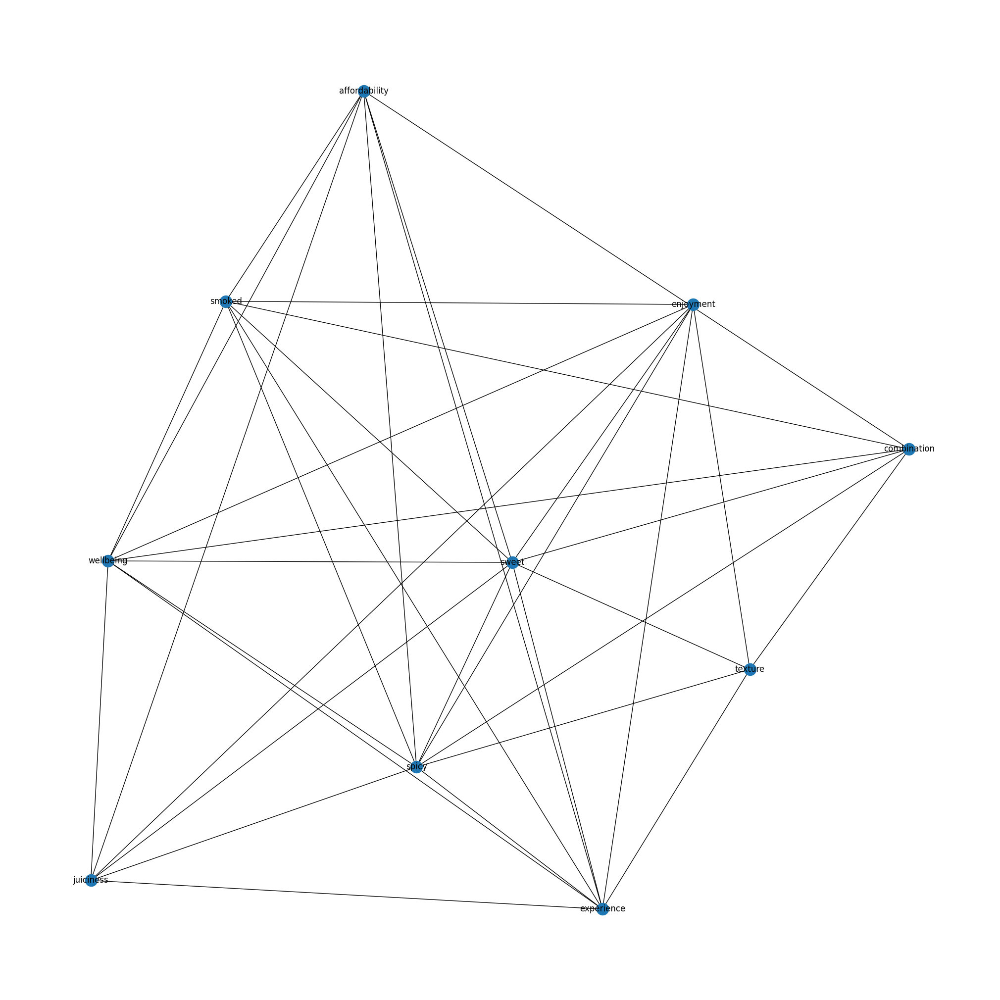

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.85:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['lead','includes','inconvenience','increasing','incredible','indispensable','influence','lieu','infusing','ingenuity','ingestion','lesser','lane','integrate','investing','invigorate','involves','hydrated','leaf','leading','key','kitchen','illness','however','hungry','happiness','fond','fortifying','foster','fully','furnish','gastronomic','giving','goto','grand','guidance','guided','harbor','hungerinduced','heavenly','heavy','heightened','heritage','high','higher','hint','list','hue','hued','lingering','magical','loving','loyalty','primarily','process','proclivity','profusion','promoting','prompting','provides','pursuit','pwith','quite','rather','receive','saucy','skeletal','sumptuousness','supersedes','supporting','susceptible','sustain','thereby','thread','threequarters','preclude','precedence','power','mitigation','favor','mainly','malady','manifest','memory','mentioned','meticulous','midst','mindfulness','mine','mitigate','moisture','nutritional','mom','mouthwatering','mucilaginous','multiplicity','muscle','natto','navigate','nearterm','negative','neurological','notice','comfort','broad','buying','caloric','cardiovascular','category','catering','celebrated','celebrating','chameleonlike','charting','chilly','common','fare','companionship','compared','complemented','component','concoction','confection','conjures','consistently','constituent','constitutes','contain','contribute','bring','boost','boon','block','achieving','acid','adequate','advantage','adverse','affording','affords','agree','akin','allowing','alltime','along','amidst','amount','amplification','animosity','anticipate','appetite','area','artistic','augment','avert','aware','bear','better','conversely','cornerstone','efficient','effortlessly','elevated','elevating','embracing','emerge','emerges','enables','encapsulates','encompass','endeavor','enhanced','enough','ensure','ensures','ensuring','entail','escapade','everyday','evident','excellent','exceptional','excessive','exerts','expect','accentuated','efficiently','efficiency','echo','dancing','debate','decision','definitely','deleterious','derived','detrimental','developing','difference','diminish','disagree','dislike','distinct','distinctive','dividend','drastically','drawing','drawn','drinking','drop','earn','easytoeat','facet','diet','fat','essential','risk','grain','bone','carbohydrate','function','quality','energy','dietary','nutrient','juicy','eating','disease','help','salmon','consuming','vitamin','mojarra','mineral','nutritious','one','fatty','lentil','pea','towards','system','broccoli','daily','proper','whole','chronic','saturated','sugar','brain','diabetes','water','often','mental','intake','enjoyable','benefit','portion','fiber','improve','stand','size','inclination','worth','impact','hydration','day','processed','pumpkin','cook','crucial','furthermore','fried','repair','pivotal','functioning','avoiding','among','seasoning','melon','unwanted','solid','mandarin','maintain','squash','arroz','avoid','level','digestion','lasagna','bodily','element','pollo','inherent','pork','calorie','significant','extends','refined','formation','foremost','equal','firstly','resist','excess','remember','importance','fundamental','physical','lifestyle','linchpin','liquid','longterm','manifold','organ','might','option','opting','moderation','moreover','mother','necessary','neurodegenerative','oat','notwithstanding','nourishing','people','issue','great','informed','growth','habit','promote','probiotic','hold','prevent','immune','imperative','implication','preferred','including','incorporate','increase','incredibly','individual','indulging','effort','nutrition','created','amazing','underestimate','undesirable','unhealthy','controlling','summation','corn','counterpart','coupled','crafted','crave','craving','structure','unprocessed','antioxidant','dehydration','beneficial','constipation','consists','chewing','tissue','throughout','busy','building','broth','cherished','coffee','blood','cognitive','text','tender','bounty','type','talk','viscous','trans','sourced','active','warmth','speaking','advance','digestive','softer','adaptability','disorder','sodium','slippery','despite','slimy','adopting','effectively','adopt','offered','personal','pesky','unappealing','unbeatable','pillar','occupy','planning','tug','trust','offputting','occasion','plethora','wholesome','obviate','plus','wield','winwin','transformative','transform','posed','penchant','vivid','undeniable','okra','vibrantly','want','outcome','outlet','versatile','overconsumption','unwelcome','optimal','overly','operation','warms','overstated','unpleasant','overwhelming','position','onthego','packed','paradigm','onset','partaking','unparalleled','wellrounded','particularly','omega','patacones','underestimated','paying','tends','traditional','resorting','resolve','residue','requisite','require','stabilization','replete','repast','stable','staying','render','steadfast','steaming','steer','regimen','resort','spectrum','potential','special','situation','significance','sidestep','shortterm','shame','serve','sensation','select','seek','soothing','sou','soul','sound','routine','rival','steering','strike','reducing','substance','prevalent','preserving','preservation','present','preparing','tandem','prepackaged','teeming'
,'equilibrium','escape','everevolving','everexpanding','excites','enrich','expand','expectation','expedition','experiencing','experiment','explored','enriches','enhances','greasy','edible','dynamic','eager','eagerly','easy','ecstasy','edge','effect','enhance','egg','elevate','elevates','encountered','end','enduring','explorer','explosion','exquisite','gain','fork','fortunate','fracture','french','fry','full','gateway','extra','glide','global','go','goldenhued','graced','grease','fondness','foam','flood','flesh','finding','fillet','fiery','fettuccine','fattening','fascination','fascinating','farmer','familiar','fails','exudes','extremely','extraaged','zucchini','flavor','flaky','tactile','tahini','creative','wanted','universal','wall','voyage','vitality','vital','vendor','vast','vary','varies','varied','used','upon','unveil','universe','teeth','tasted','tangible','seasoned','side','shrimp','shredded','shred','sheer','shatters','share','served','sensorial','sense','seemingly','seem','seeing','seared','simply','scrambled','satisfy','sampling','sample','samosa','salty','salt','said','rough','rolled','roll','role','roasted','simple','single','taken','steak','sure','supple','sunsoaked','summary','succulence','substantial','sublime','strength','strand','story','stimulating','stew','step','state','slip','starting','stall','stage','spring','spread','spark','southeast','soup','snap','matter','small','slowly','maybe','ability','match','coating','city','clear','cling','clinging','coated','cold','chicharrón','colombi','companion','complexity','condiment','connecting','chickpea','chewy','consider','cause','cacophony','captivated','caramel','carbonara','carrot','case','celebration','chewiness','challenge','champion','change','char','cheddar','chef','connection','constant','dissolve','delectable','culminates','curious','dairy','deconstructed','deeply','defies','deliver','depends','derive','described','design','designed','desire','crystalline','crumbles','constantly','course','consumption','continue','continuing','control','cooling','corner','couscous','croissant','cracker','crackle','crackling','cradle','craftsm','creation','butterscotch','butter','bustling','appreciate','alone','although','amalgamation','angel','animalbased','approach','almond','approached','arepa','aroma','around','artisanal','artistry','almost','allure','bursting','addition','absorbing','accompanied','accompany','acidic','adapts','added','additional','allows','admit','adore','adorned','alive','all','allow','asia','assortment','avenue','brewery','blueberry','body','bold','bound','boundary','bowl','bridge','await','bright','brilliance','brings','brown','build','burger','black','beyond','beverage','best','beneath','beloved','believe','begin','become','beckon','beautifully','bar','banana','balanced','baguette','away','awakens','digestible','dog','master','innovation','impression','indulge','indulgence','infinity','infused','initial','innovative','imagine','insatiable','inspiration','instead','integrity','intense','international','important','iconic','intertwines','harm','guess','guilty','gustatory','hair','hand','happening','harmonizes','hummus','healthy','hedonistic','heirloom','hibiscus','home','honey','absolutely','intrigue','dream','local','light','lightness','liking','lingers','linguine','little','loses','leaving','lover','luxurious','maintaining','malaysi','mango','marbling','legume','le','intriguingly','joy','introduce','introduces','invite','itself','jam','japanese','juice','latin','kill','kind','kore','laksa','landscape','lasting','ground','green','greatest','excite','enthusiasm','entices','choice','immense','surprise','chip','practically','tangy','tantalizes','technique','spoonful','indi','preparation','coulis','steamed','ignites','surprising','coconut','combining','reveal','coming','complement','surrounded','homemade','strong','consume','street','strawberry','cookie','core','could','perfect','intertwine','spectacular','prepared','reason','embark','embodiment','first','filling','regarding','satisfaction','enthusiast','feast','ethereal','even','release','exciting','exotic','falafel','resistance','robust','experimentation','extraordinary','right','expression','ready','raspberry','quickly','prime','curiosity','custard','daring','tempura','pressure','snack','delivers','delve','dente','profile','earthy','profound','slight','dimension','discovering','discovery','diversity','divine','silkiness','drizzle','decadence','cocktail','revel','middle','amaze','beckons','noodle','beef','beer','uncharted','irresistible','inviting','twist','invigorating','moist','truly','blend','nourishment','lime','versatility','triple','bechamel','beauty','america','multisensory','mood','vinaigrette','vinegar','various','another','molten','animal','awaken','need','junk','back','unfolds','balsamic','challenging','bean','molecular','mind','boasting','vibrant','territory','think','melt','within','toasted','indulgent','wine','touch','additionally','marinated','catch','white','wonder','melting','cease','aged','breast','term','boundless','ajiaco','tenderness','market','intricate','captivates','quest','ramen','push','meaty','retaining','punctuated','region','rarely','related','miso','meringue','mixology','moderate','regional','modern','recipe','resonates','merge','remain','remains','remind','melted','reduce','reminder','pastry','protagonist','open','oasis','picturesque','obtained','picture','personally','occasional','perhaps','offering','olive','perceive','opened','mondongo','ordinary','oregano','paella','palatability','pancetta','paradise','penne','particular','pear','patty','pizza','place','playfulness','nuance','moroccaninspired','promise','morsel','mosaic','product','probably','mostly','mouthful','must','presented','presence','next','north','prepare','nostalgia','preference','poorly','pomegranate','point','novel','pleased','myriad','smell','revelation','river','undertake','understand','uncovered','unadulterated','ultimately','turning','turn','truck','trove','trip','trigger','tribute','treat','traveler','trattorias','transformed','tradition','totally','tossed','tooth','titillate','tingling','time','thrill','though','thick','thai','tend','tempting','undisputed','unfolding','unforgettable','weekend','yielding','would','wonderful','without','wide','whisk','whirlwind','whipped','wellseasoned','wellprepared','wellcrafted','welfare','weight','like','food','taste','bite','every','culinary','chicken','pasta','really','meat','sauce','also','fruit','dish','journey','world','cheese','offer','adventure','delight','come','chocolate','symphony','cuisine','palate','enjoy','contrast','fresh','testament','favorite','fusion','different','realm','endless','sens','salad','sensory','delightful','dont','mouth','exterior','interplay','satisfying','embrace','unique','protein','create','velvety','something','canvas','exploring','add','love','richness','ingredient','marriage','meal','hamburger','feel','never','refreshing','milk','natural','magic','possibility','perfectly','bud','layer','soft','rice','interior','together','color','savory','fish','find','exploration','balance','crisp','creating','thing','captivating','itali','take','delicate','playground','mushroom','many','make','lie','savor','harmonious','buttery','slightly','excitement','example','diverse','dessert','fast','essence','yield','becomes','well','matching','appeal','curry','spaghetti','adding','dance','vegetable','spice','especially','pleasure','lettuce','tomato','burst','masterpiece','combined','relish','prefer','juxtaposition','know','culture','opportunity','plate','blue','creates','cake','unexpected','cream','meet','gastronomy','much','pure','explore','crust','taco','delicious','making','mashed','marvel','releasing','sushi','bliss','variety','depth','dense','tart','whether','unknown','tantalizing','life','tapestry','crouton','trying','keep','array','baked','general','gelatinous','garlic','way','shell','found','ginger','avocado','form','attention','skin','flavorful','baking','sometimes','anticipation','always','result','dressing','succulent','ripe','sancocho','anything','give','seafood','apple','everything','bandeja','golden','source','rich','firm','provide','parmes','trout','paisa','pairing','textural','center','nut','presentation','connects','thrilling','treasure','comforting','nature','chew','transport','brittle','potato','umami','nothing','pleasant','nutty','tongue','contrasting','brie','cooking','mediterrane','tasty','work','true','craft','medley','truffle','caress','cooked','grainy','play','appreciation','accompanying','waiting','grape','platter','achieved','freshness','seeking','seed','gooey','peach','hard','nuttiness','savoring','harmony','health','flakiness','heart','gouda','silky','good','zing','freshly','fuel','paramount','zest','sharpness','short','showcase','part','gentle','paired','passion','pair','forget','gift','overall','plantain','zesty','weakness','orchestra','watermelon','hearty','salsa','satisfyingly','range','lava','moment']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
p2n = p2noncons.apply(clean_text)
network2n = create_red(p2n, 'network2n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network2n)
dfx

,Node,Total Co-occurrence Frequency
8,texture,380
7,sweet,336
6,spicy,141
3,experience,132
1,combination,117
2,enjoyment,86
9,wellbeing,81
5,smoked,72
4,juiciness,63
0,affordability,52


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:

#print("Nodos en red4:", network2n.nodes())


#P3- CHARACTERISTICS OF NON-PREFERRED FOODS-CONS'

In [ ]:
p3cons= compared['P3- CHARACTERISTICS OF NON-PREFERRED FOODS-CONS'].astype(str)
p3noncons= compared['P3- CHARACTERISTICS OF NON-PREFERRED FOODS-NONCONS'].astype(str)

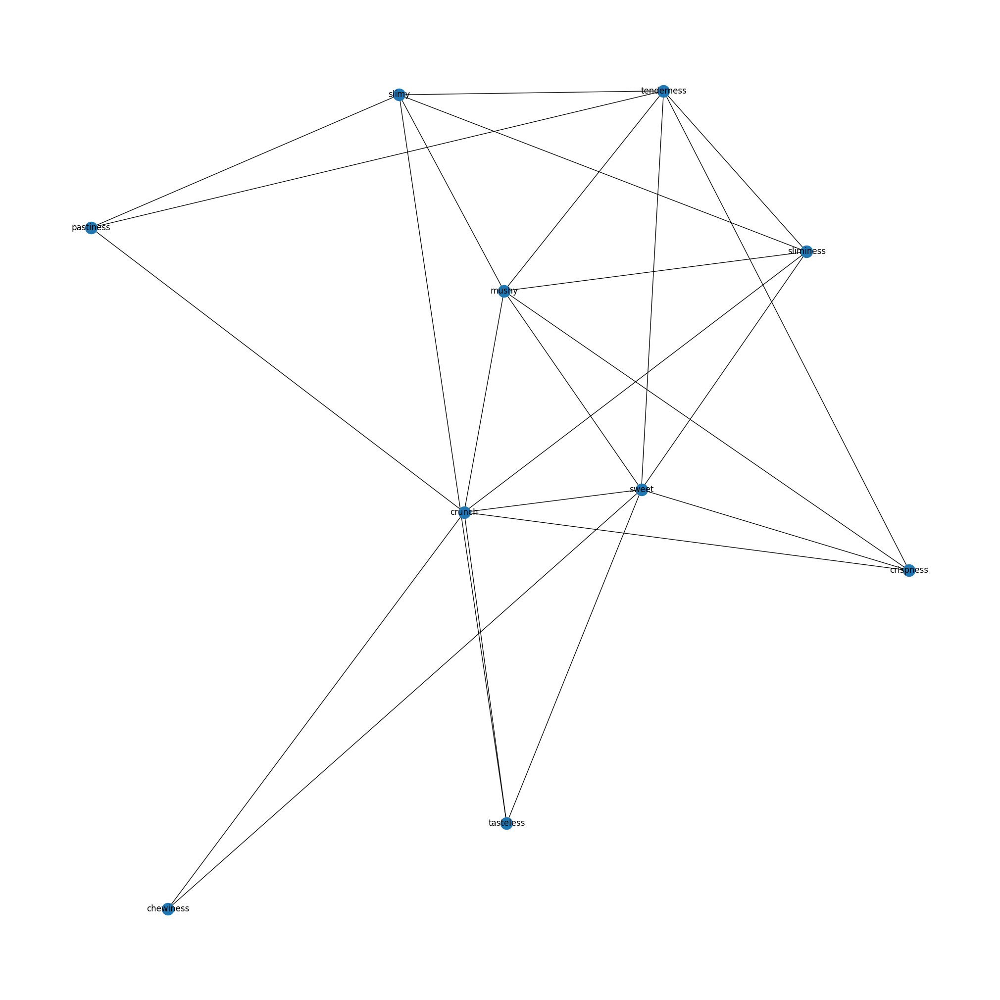

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.7:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['familiarity','crisp','crispy','insect','sensation','smell','taste','flavor','texture','heightens','hesitate','hidden','hint','however','luster','cream','create','creating','cringe','culprit','dancing','daring','deeper','defies','distinct','distinction','diverge','engaging','enjoyment','enrich','entered','enthusiasm','enthusiast','enthusiastic','entice','enticing','entity','entomophagous','entranced','escapade','eschew','essential','etching','everevolving','evident','enigma','enduring','dog','endure','dominion','doubleedged','each','eager','echo','echoing','edge','egg','elaborate','elicits','else','embarked','encapsulated','encountered','encountering','ended','conspire','conjure','planet','back','ardent','arm','ascended','asserting','attention','attuned','audacious','awaken','backdrop','concoction','ball','barrier','base','basically','becomes','beetroot','behind','being','approach','appetizer','appearance','apart','abrasive','accept','accompanied','adventurous','adversary','adversity','aficionado','aftertaste','alien','align','ally','alone','already','always','anew','another','anymore','belies','best','beyond','celebrated','chance','chapter','character','cherished','chicken','chorus','cloud','colombi','combined','comforting','companion','completely','complexity','compose','composing','composition','celebration','celebrate','biggest','cautious','biting','blend','bling','boast','bocadillo','bordering','brick','bringing','broaden','burst','cabbage','captivated','capture','caress','carousel','cat','cauldron','evokes','evolved','evolving','minuscule','meaning','medley','memory','mention','mere','meticulously','mind','minimal','mirror','exchange','mojojoy','morph','morphed','morsel','mosaic','mouse','move','mayonnaise','maximum','match','masquerade','intrigued','intriguing','introduced','introduces','invoke','journeyed','kicker','lacking','later','lend','lettuce','lie','light','longing','abound','marked','marvel','munch','name','narrator','overly','parasite','participant','particular','path','patron','pattern','pausing','pave','peating','pedestal','people','perception','pfor','pineapple','pioneer','pizza','plain','paradox','natural','organ','neither','nonconsumers','nostalgia','note','nutritional','obligation','obviously','occasionally','odor','offputting','okay','one','onion','openmindedness','opportunity','or','orb','intrigue','intricate','intertwined','flit','follow','follows','foray','forced','forever','fragment','fragmentation','fruit','gastronomy','give','glassy','glide','good','goodness','grand','grappling','folk','fleeting','great','finger','excited','excitement','exciting','exist','expected','explain','extends','exudes','eye','familiar','fascination','fault','favorite','fear','feeling','figure','grayish','grew','interaction','illuminated','immediately','imparting','incredible','individual','indulgence','influence','infuse','ingredient','inherent','initial','initially','insectfood','instance','instead','insurmountable','intention','imagine','idea','grou','ibias','guess','guest','guinea','gusto','hand','handle','happen','happened','hard','headfirst','headscratcher','heavy','unite','canvas','beet','carrot','carry','cartilage','overbearing','problem','tolerate','together','dismiss','yeah','curiosity','distinctive','diving','redefined','drawn','refusing','ecoconscious','yielded','embraced','embracing','adorned','yielding','relinquish','endless','meltinthemouth','melon','melodious','enigmatic','enjoy','subtle','distaste','moment','dish','mouth','tiny','delicacy','anything','myriad','thought','range','deter','persistence','upon','aligns','tenaciously','mostly','intestinal','rhythm','poorly','plea','precursor','potent','predisposes','preferred','pleasant','rib','pof','preparation','prefer','rich','rice','revel','revelation','posse','resounding','reluctance','resonates','rabbit','reminiscent','rather','reminding','ready','real','reason','recoil','remembered','regular','relationship','remains','release','remaining','relinquished','relish','rapid','quite','resonate','quickly','pretty','prickly','resists','proceed','product','resilience','proteinpacked','prove','provided','provides','pungent','put','residue','quail','quick','proving','splendor','ripe','triumphant','transition','traversing','treat','tree','tricky','tried','trip','trust','transcends','tugging','ultimately','unabating','uncanny','unconventional','uncovered','uncovers','transient','trade','undertaken','thrill','tension','tentative','term','territory','thigh','though','threshold','thrive','tough','throatscratchers','throne','told','tomato','tongue','took','torment','understand','unease','tenacity','willingness','warm','went','whatever','whenever','whiff','wholeheartedly','wild','wind','waiting','worm','worry','woven','yang','yearning','yogurt','young','want','vivid','unexplored','unspoken','unfamiliar','unfurls','union','unites','unless','unrest','unseen','unwilling','vibrant','usually','varied','variety','velvety','venturing','verge','vibrancy','tender','tempting','robustness','signal','seriously','served','shake','shatters','shiver','shudder','shun','skepticism','sensory','slickness','slide','slip','slipperiness','slurper','snake','softness','serf','sends','solidity','savior','role','sail','sardine','satiate','satisfaction','satisfy','saving','scare','sell','screw','seafood','secret','seeking','seem','seemed','seems','solid','someone','temperament','symbol','surface','surrender','sushi','sustainability','sustainable','swallow','sword','takeaway','subtlety','taken','tantalizes','tasted','teeter','tell','telling','superhero','struggle','sonata','spinning','sou','soul','sound','source','specifically','spell','spine','plate','strike','started','steadfast','step','still','stimulate','stimulates','stopped','play','ability','plantbased','difficult','depending','derivative','despite','deterrent','detest','developed','devotee','dichotomy','digestion','conjures','dimension','disappointment','disciple','discordant','discovered','disdain','dissolve','distant','depend','demeanor','delightful','defy','consumed','contemplation','contradiction','converge','conviction','could','countless','crab','like','dont','food','culinary','journey','world','palate','bite','also','might','find','mashua','tapestry','tuber','thing','salad','experience','preference','something','aversion','every','tactile','sometimes','snack','diverse','realm','vegetable','embrace','symphony','entomophagy','adventure','offer','cuisine','strong','soup','aroma','challenge','tamarillo','cucumber','beckon','gelatinous','pasty','landscape','nature','even','certain','perspective','exploration','testament','color','think','lentil','chocolate','carnival','childhood','delight','feel','really','dislike','bud','narrative','unique','packaged','combination','often','either','international','meat','story','cooked','consume','possibility','pepper','whole','appreciate','dance','savory','table','banana','become','bell','milk','resistance','reminder','eating','juice','delicate','glossy','contrast','little','fig','chewy','challenging','come','friend','throat','time','make','take','pressure','satisfying','within','well','alternative','almost','beauty','kind','staple','sens','allure','animal','many','spectrum','akin','ride','discomfort','explore','sense','potato','exotic','maybe','exoskeleton','especially','lingers','reluctant','essence','creature','much','encounter','diversity','digest','thrilling','mainly','soft','redefine','finding','tale','evolution','different','stew','everything','emerges','navigate','substantial','others','unknown','hold','leaving','shiny','shimmering','unfolds','arracacha','wellprepared','scratchy','leave','identity','called','shape','learned','gustatory','peculiar','away','seek','serve','bring','unpleasant','harmonious','blood','unsung','harmony','kaleidoscope','bitter','part','presence','savor','hero','iridescent','clinging','line','robust','yield','consistency','insectbased','nutrition','fragrance','puree','pork','sipper','gastronomic','would','chew','cling','inviting','anticipation','open','appeal','level','gentle','strange','home','interplay','horizon','remain','issue','innovation','iridescence','humble','scratching','stir','linger','maestro','know','example','lingering','forget','form','formidable','fine','found','fret','slightest','life','structure','fervor','gateway','general','liver','long','simmering','grace','longer','look','grip','made','shimmer','exploring','slurpers','leaf','lead','stand','lack','yucca','discovery','right','critter','balance','unassuming','waltz','wanting','comfort','subcutaneous','provoke','obscure','weave','traverse','welcome','transit','novelty','transformation','nothing','traditional','convention','traded','armor','quest','country','prepared','quirk','uncharted','protein','promise','brittle','passion','present','bland','unveil','papaya','bowl','boyac','past','paint','brings','brittleness','pate','broccoli']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p3c = p3cons.apply(clean_text)
network3 = create_red(p3c, 'network3')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network3)
dfx

,Node,Total Co-occurrence Frequency
2,crunch,220
7,sweet,207
3,mushy,102
6,slimy,77
9,tenderness,75
5,sliminess,66
1,crispness,52
4,pastiness,42
8,tasteless,27
0,chewiness,20


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

#3N

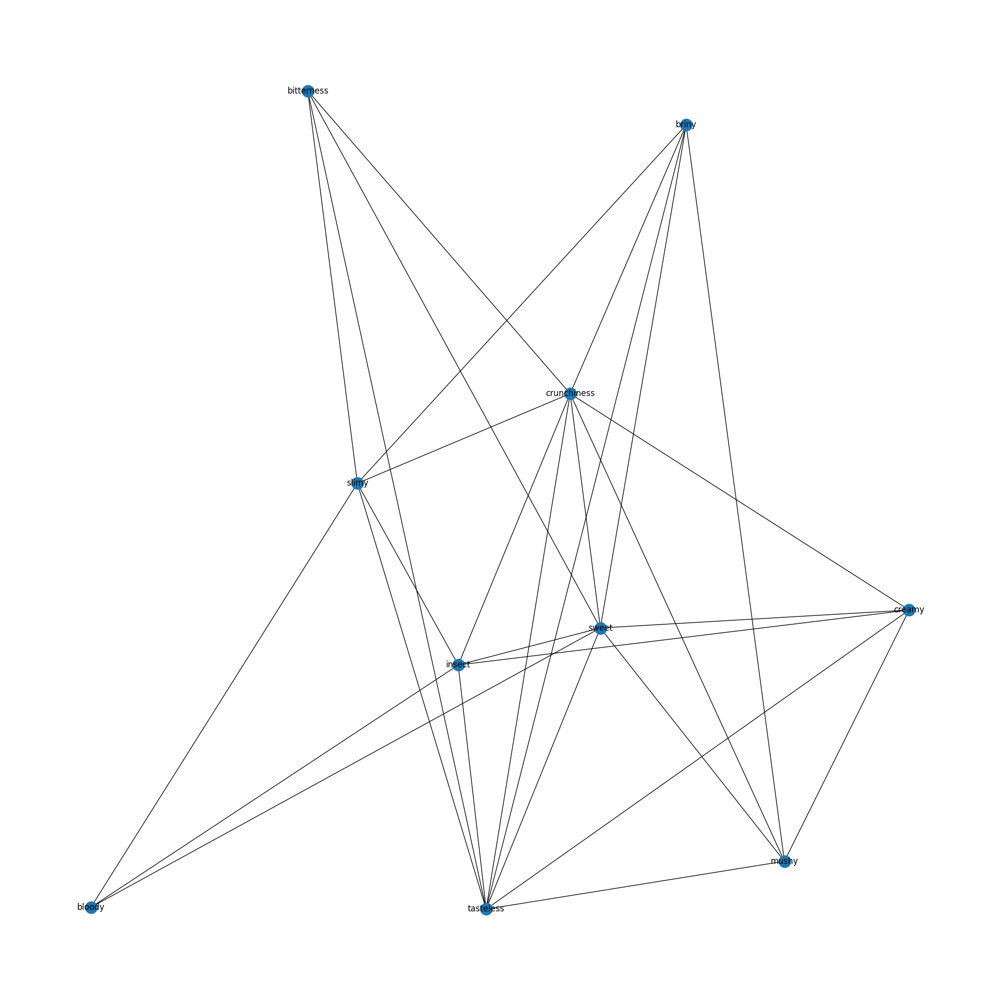

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.76:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['familiarity','crisp','crispy','sensation','smell','taste','flavor','texture','consuming','avoid','chinese','fish','list','liking','trying','pumpkin','tend','shrimp','thanks','option','particularly','matter','pas','coffee','unappetizing','type','lechona','veggie','intestine','interest','personal','rat','combo','coconut','left','turnip','earthy','suit','nope','fond','clear','nogo','garlic','fried','uncomfortable','tibia','crunchy','health','stick','used','cauliflower','steer','catastrophe','draw','sweetness','involve','le','whether','perhaps','along','rubbery','making','japanese','yolk','spinach','pause','tends','party','deliver','enhance','enemy','sausage','throw','dining','processed','salty','runny','risk','scene','tied','tolimense','tendency','overpowering','technique','fuss','it','spreading','high','stuff','solve','ground','lose','goto','menu','mixed','mystery','sign','tamal','tarantula','short','opting','involved','deal','zone','consider','unsettling','boyacense','actually','ant','cocido','available','board','without','aware','wondering','chanfaina','clash','cunchito','wellcooked','bigbottom','choose','chunchullo','characteristic','item','willing','say','parade','aspect','willingly','stay','wrap','steak','history','perfectly','steal','cheese','charm','spoonful','impact','perceive','help','stellar','groove','bread','measure','nose','nightmare','befriend','need','show','better','offender','okra','milder','metabolism','mess','bit','mentioned','simply','keep','seedy','voice','visual','letdown','slurp','oriental','viscera','least','vibe','kitchen','kinda','sugar','gritty','shrim','pet','touch','rsvping','tenfoot','acquire','wrong','profile','them','enjoyable','rain','they','grainy','those','eats','fall','turned','count','earlier','duty','quality','dressing','drenched','unappealing','total','topic','toosweet','cross','trifecta','confused','flour','gooey','phase','remember','go','super','chunky','decided','plenty','plus','decline','unpredictable','pole','anyone','closer','flavorful','component','adventurer','finale','condiment','wheelhouse','remotely','response','resisted','reputation','shortlist','shine','seasoning','shedding','wide','worldwide','sauce','sandpaper','winning','rub','savoring','scent','shaped','rough','seduce','rooted','younger','revolt','revisit','selective','triple','spirit','wellbeing','upset','sum','supremely','sure','swallowing','regard','taking','talk','unnervingly','unleash','temptation','universe','test','unimpressed','underlying','thoroughly','threat','undercooked','uncooked','ticket','tickle','toward','towards','town','tread','trigger','tummy','trinity','unwillingness','succulent','sight','succulence','weather','way','significant','signify','similarly','single','wasabi','situation','slightly','warming','slippery','soon','spice','versatility','venture','heightens','hesitate','hidden','hint','however','luster','cream','create','creating','cringe','culprit','dancing','daring','deeper','defies','distinct','distinction','diverge','engaging','enjoyment','enrich','entered','enthusiasm','enthusiast','enthusiastic','entice','enticing','entity','entomophagous','entranced','escapade','eschew','essential','etching','everevolving','evident','enigma','enduring','dog','endure','dominion','doubleedged','each','eager','echo','echoing','edge','egg','elaborate','elicits','else','embarked','encapsulated','encountered','encountering','ended','conspire','conjure','planet','back','ardent','arm','ascended','asserting','attention','attuned','audacious','awaken','backdrop','concoction','ball','barrier','base','basically','becomes','beetroot','behind','being','approach','appetizer','appearance','apart','abrasive','accept','accompanied','adventurous','adversary','adversity','aficionado','aftertaste','alien','align','ally','alone','already','always','anew','another','anymore','belies','best','beyond','celebrated','chance','chapter','character','cherished','chicken','chorus','cloud','colombi','combined','comforting','companion','completely','complexity','compose','composing','composition','celebration','celebrate','biggest','cautious','biting','blend','bling','boast','bocadillo','bordering','brick','bringing','broaden','burst','cabbage','captivated','capture','caress','carousel','cat','cauldron','evokes','evolved','evolving','minuscule','meaning','medley','memory','mention','mere','meticulously','mind','minimal','mirror','exchange','mojojoy','morph','morphed','morsel','mosaic','mouse','move','mayonnaise','maximum','match','masquerade','intrigued','intriguing','introduced','introduces','invoke','journeyed','kicker','lacking','later','lend','lettuce','lie','light','longing','abound','marked','marvel','munch','name','narrator','overly','parasite','participant','particular','path','patron','pattern','pausing','pave','peating','pedestal','people','perception','pfor','pineapple','pioneer','pizza','plain','paradox','natural','organ','neither','nonconsumers','nostalgia','note','nutritional','obligation','obviously','occasionally','odor','offputting','okay','one','onion','openmindedness','opportunity','or','orb','intrigue','intricate','intertwined','flit','follow','follows','foray','forced','forever','fragment','fragmentation','fruit','gastronomy','give','glassy','glide','good','goodness','grand','grappling','folk','fleeting','great','finger','excited','excitement','exciting','exist','expected','explain','extends','exudes','eye','familiar','fascination','fault','favorite','fear','feeling','figure','grayish','grew','interaction','illuminated','immediately','imparting','incredible','individual','indulgence','influence','infuse','ingredient','inherent','initial','initially','insectfood','instance','instead','insurmountable','intention','imagine','idea','grou','ibias','guess','guest','guinea','gusto','hand','handle','happen','happened','hard','headfirst','headscratcher','heavy','unite','canvas','beet','carrot','carry','cartilage','overbearing','problem','tolerate','together','dismiss','yeah','curiosity','distinctive','diving','redefined','drawn','refusing','ecoconscious','yielded','embraced','embracing','adorned','yielding','relinquish','endless','meltinthemouth','melon','melodious','enigmatic','enjoy','subtle','distaste','moment','dish','mouth','tiny','delicacy','anything','myriad','thought','range','deter','persistence','upon','aligns','tenaciously','mostly','intestinal','rhythm','poorly','plea','precursor','potent','predisposes','preferred','pleasant','rib','pof','preparation','prefer','rich','rice','revel','revelation','posse','resounding','reluctance','resonates','rabbit','reminiscent','rather','reminding','ready','real','reason','recoil','remembered','regular','relationship','remains','release','remaining','relinquished','relish','rapid','quite','resonate','quickly','pretty','prickly','resists','proceed','product','resilience','proteinpacked','prove','provided','provides','pungent','put','residue','quail','quick','proving','splendor','ripe','triumphant','transition','traversing','treat','tree','tricky','tried','trip','trust','transcends','tugging','ultimately','unabating','uncanny','unconventional','uncovered','uncovers','transient','trade','undertaken','thrill','tension','tentative','term','territory','thigh','though','threshold','thrive','tough','throatscratchers','throne','told','tomato','tongue','took','torment','understand','unease','tenacity','willingness','warm','went','whatever','whenever','whiff','wholeheartedly','wild','wind','waiting','worm','worry','woven','yang','yearning','yogurt','young','want','vivid','unexplored','unspoken','unfamiliar','unfurls','union','unites','unless','unrest','unseen','unwilling','vibrant','usually','varied','variety','velvety','venturing','verge','vibrancy','tender','tempting','robustness','signal','seriously','served','shake','shatters','shiver','shudder','shun','skepticism','sensory','slickness','slide','slip','slipperiness','slurper','snake','softness','serf','sends','solidity','savior','role','sail','sardine','satiate','satisfaction','satisfy','saving','scare','sell','screw','seafood','secret','seeking','seem','seemed','seems','solid','someone','temperament','symbol','surface','surrender','sushi','sustainability','sustainable','swallow','sword','takeaway','subtlety','taken','tantalizes','tasted','teeter','tell','telling','superhero','struggle','sonata','spinning','sou','soul','sound','source','specifically','spell','spine','plate','strike','started','steadfast','step','still','stimulate','stimulates','stopped','play','ability','plantbased','difficult','depending','derivative','despite','deterrent','detest','developed','devotee','dichotomy','digestion','conjures','dimension','disappointment','disciple','discordant','discovered','disdain','dissolve','distant','depend','demeanor','delightful','defy','consumed','contemplation','contradiction','converge','conviction','could','countless','crab','like','dont','food','culinary','journey','world','palate','bite','also','might','find','mashua','tapestry','tuber','thing','salad','experience','preference','something','aversion','every','tactile','sometimes','snack','diverse','realm','vegetable','embrace','symphony','entomophagy','adventure','offer','cuisine','strong','soup','aroma','challenge','tamarillo','cucumber','beckon','gelatinous','pasty','landscape','nature','even','certain','perspective','exploration','testament','color','think','lentil','chocolate','carnival','childhood','delight','feel','really','dislike','bud','narrative','unique','packaged','combination','often','either','international','meat','story','cooked','consume','possibility','pepper','whole','appreciate','dance','savory','table','banana','become','bell','milk','resistance','reminder','eating','juice','delicate','glossy','contrast','little','fig','chewy','challenging','come','friend','throat','time','make','take','pressure','satisfying','within','well','alternative','almost','beauty','kind','staple','sens','allure','animal','many','spectrum','akin','squirm','vegetari','vast','starchy','various','value','staunch','usual','stem','sticking','storm','regarding','acceptables','refuse','cut','detail','despise','desire','desirable','described','derive','dealbreaker','day','culture','refusal','crunch','crucial','credit','craving','cook','contrary','continuing','contest','develop','direction','discerning','distinctly','faves','fat','fails','faced','experimenting','expectation','exactly','empty','embark','eludes','eggs','eater','easier','dude','double','done','dive','consumer','connotation','confusion','beloved','begin','battle','based','bane','attribute','association','assault','artificial','array','around','aromatic','appetizing','anytime','admit','adjective','additionally','blame','blur','concept','boat','combine','clashing','clarify','cholesterol','chewing','chalkboard','category','carefully','bypass','buying','burger','bueno','broth','brew','boundary','bother','book','favor','firm','first','overwhelm','overload','overcooked','overall','openminded','onto','oneway','onetwo','olfactory','oceanic','nuhuh','notsopleasant','non','never','navigating','nail','accompany','miss','overpowers','painted','meal','pasta','referred','referee','radar','questioning','question','puzzled','punch','pulse','provide','probably','praised','powerhouse','potential','popularity','polished','picky','pdue','melt','mark','fishy','horror','highlighting','heck','hearty','hanging','groundsladen','grilled','gravitating','going','gang','fusion','fullon','full','focus','flop','float','flip','flavoring','hit','inclination','main','inclined','magnifying','locally','liquid','legume','lastly','lackluster','known','juicy','jive','jasmine','is','invading','intense','integral','insects','incorporate','moving'
,'ride','discomfort','explore','sense','potato','exotic','maybe','exoskeleton','especially','lingers','reluctant','essence','creature','much','encounter','diversity','digest','thrilling','mainly','soft','redefine','finding','tale','evolution','different','stew','everything','emerges','navigate','substantial','others','unknown','hold','leaving','shiny','shimmering','unfolds','arracacha','wellprepared','scratchy','leave','identity','called','shape','learned','gustatory','peculiar','away','seek','serve','bring','unpleasant','harmonious','blood','unsung','harmony','kaleidoscope','bitter','part','presence','savor','hero','iridescent','clinging','line','robust','yield','consistency','insectbased','nutrition','fragrance','puree','pork','sipper','gastronomic','would','chew','cling','inviting','anticipation','open','appeal','level','gentle','strange','home','interplay','horizon','remain','issue','innovation','iridescence','humble','scratching','stir','linger','maestro','know','example','lingering','forget','form','formidable','fine','found','fret','slightest','life','structure','fervor','gateway','general','liver','long','simmering','grace','longer','look','grip','made','shimmer','exploring','slurpers','leaf','lead','stand','lack','yucca','discovery','right','critter','balance','unassuming','waltz','wanting','comfort','subcutaneous','provoke','obscure','weave','traverse','welcome','transit','novelty','transformation','nothing','traditional','convention','traded','armor','quest','country','prepared','quirk','uncharted','protein','promise','brittle','passion','present','bland','unveil','papaya','bowl','boyac','past','paint','brings','brittleness','pate','broccoli']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p3n = p3noncons.apply(clean_text)
network3n = create_red(p3n, 'network3n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network3n)
dfx

,Node,Total Co-occurrence Frequency
8,sweet,608
5,insect,564
7,slimy,425
4,crunchiness,310
9,tasteless,192
6,mushy,155
2,briny,98
0,bitterness,88
3,creamy,88
1,bloody,48


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

#4-CULTURAL BELIEFS ABOUT CONSUMPTION

In [ ]:
p4cons= compared['QUESTION 6 - CULTURAL BELIEFS ABOUT CONSUMPTION-CONS'].astype(str)
p4noncons= compared['P6-CULTURAL BELIEFS ABOUT CONSUMPTION- NONCONS'].astype(str)

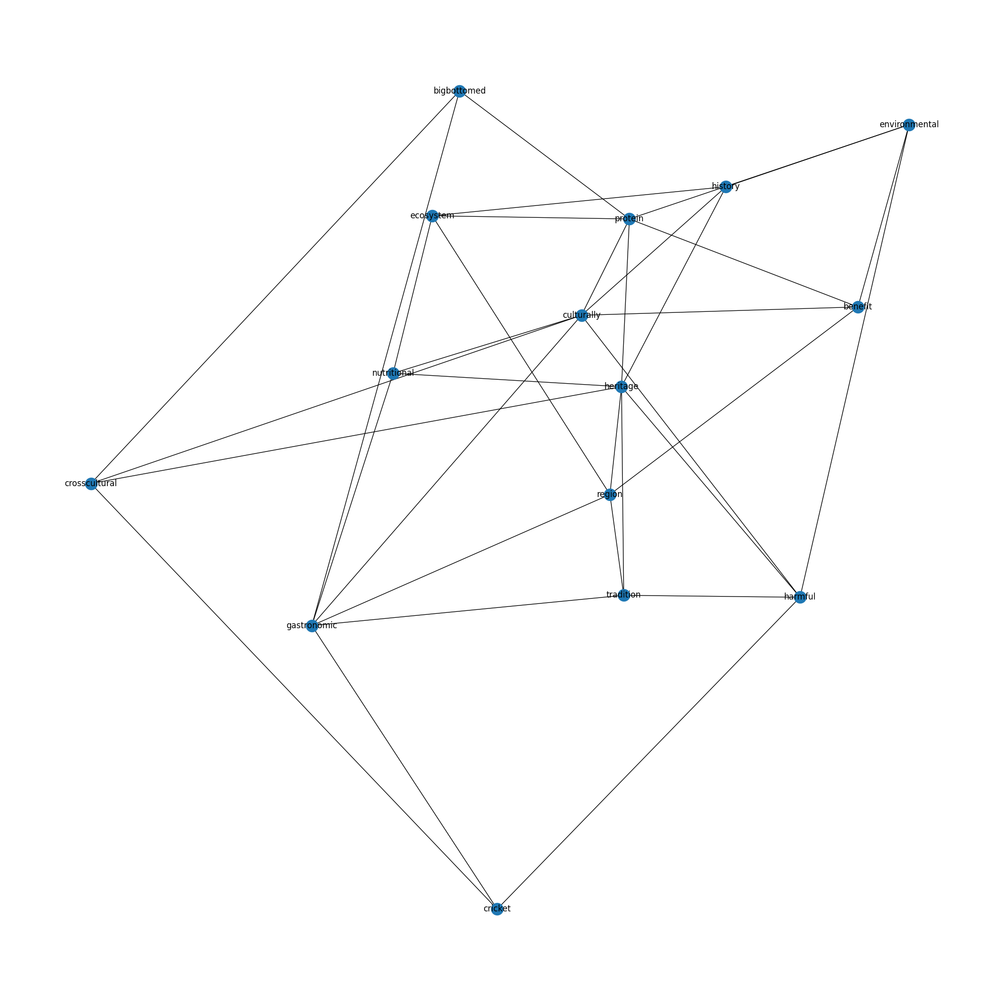

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.21:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['edibility','insectbased','entomophagy','folk','balance','sustainability','colombia','nutrient','familiarity','healthy','curious','relationship','related','regional','recognition','deeply','deal','realm','realize','hear','reaction','rational','rather','discovery','posed','everyday','portal','outsider','ordinary','embodiment','embody','onto','encounter','offense','occurs','engendering','nutritious','enlightening','enticing','novel','nostalgia','normalization','everevolving','overarching','place','point','pof','pleasantly','disposition','distinction','distinguish','planet','divide','eccentricity','driven','dynamic','eagerly','perceive','ease','passed','particular','ability','focus','le','landscape','foster','found','foundation','judge','journey','framed','free','located','farming','lower','mentioned','name','mutual','multifaceted','much','evolve','mirror','exemplifies','memory','fair','meateater','expansion','meal','express','matures','factor','maintaining','it','intriguingly','nature','intriguing','globe','inclination','going','importance','implication','grand','grapple','greater','grou','group','growing','hold','guided','handle','hesitation','head','healthier','given','indeed','influenced','integrating','intricately','intricacy','interwoven','intertwines','intersection','intergenerational','fusion','integrated','integral','acceptability','insecteating','futureoriented','futuristic','natural','need','reminiscent','discussion','delectable','delicacy','pwith','delicate','delve','desire','propels','determining','production','development','dialogue','dichotomy','difference','dinner','pragmatic','discourse','powerful','quirk','defy','range','daunting','remind','remains','relish','earth','contain','eaten','determines','bible','dessert','beyond','fulfill','appear','appeal','conventional','behind','exact','becoming','extends','fact','choose','back','exposure','familiar','challenge','coast','certainly','dislike','fiber','fine','comfort','functionality','baptist','amount','grown','adventure','crazy','daily','creature','greatest','bucaramanga','adding','agree','grows','emerge','embracing','element','embrace','accessible','ethos','affecting','boundary','debate','cooking','give','especially','getting','boyacá','cooky','couple','bridge','broader','change','center','celebration','cater','stood','capturing','stuff','spirit','steward','stretch','stand','carry','heat','complexity','changing','responsibility','security','scarcity','core','rollercoaster','country','rise','rich','response','seemingly','cringe','resonates','resistance','reservation','requires','repulsion','repugnant','conviction','converge','chowing','concept','solution','clarification','societal','snack','coming','commonplace','surprise','significantly','contribute','significant','connect','showcase','shot','connection','continuity','sentiment','supplanting','text','surprised','viewing','amazing','amid','viable','venturing','venture','varying','ancestral','valuable','unraveling','appeared','unknown','appetizing','appreciated','understanding','appreciation','allowing','viewpoint','captivating','aligns','yeah','acknowledging','wrap','adapting','wonder','without','address','winwin','willingness','wild','wield','affinity','agricultural','akin','alien','underscoring','underlying','underline','underlies','tied','thrives','threat','better','thinking','bewildering','testament','test','tends','board','table','sustenance','become','bat','touching','around','unconventional','uncharted','unappealing','ultimately','architect','arises','array','towards','translation','transformation','transform','associated','aversion','awareness','realization','render','invite','livestock','feel','level','lesson','flavor','learning','like','might','certain','dont','eating','people','consumption','thing','think','find','understand','different','strange','ant','something','part','culinary','love','taste','peanut','consume','good','would','others','santander','normal','belief','know','even','believe','preference','whether','impact','play','bottomed','big','role','pantry','beef','context','pork','interesting','depends','aspect','well','alternative','dietary','upbringing','society','maybe','consumed','unpleasant','individual','considering','humanity','experience','health','often','consuming','come','future','many','make','chicken','content','norm','world','topic','diet','type','cuisine','opportunity','personal','process','community','shape','custom','offer','went','crop','seem','could','area','spicy','background','animal','becomes','tapestry','still','exploration','another','childhood','choice','issue','kore','example','beneficial','unusual','lead','influence','tried','guess','habit','high','japanese','generation','rare','perspective','access','life','trait','provide','bag','problem','developed','source','resource','child','variety','environment','used','explore','similar','meat','common','potato','every','option','bought','never','everyone','chinese','pivotal','imagine','distinctive','great','dish','known','grow','perception','however','easily','form','exposed','lack','global','hinge','look','fascinating','palate','lens','instance','consideration','right','stomach','also','seems','seen','sense','video','shaping','though','resort','consider','specific','specie','unique','assimilate','concern','chunchullo','trying','respect','within','prospect','help','practice','surrounding','balanced','way','across','additionally','take','time','acceptable','depending','intricate','last','interplay','thought','traced','three','totally','john','tolerate','trend','potential','underscore','initially','year','hesitant','wrong','whole','welcome','honey','watch','husband','idea','identity','visited','view','impossible','vicente','incorporated','value','unfamiliar','information','ingrained','inconvenience','matter','terrified','okay','openness','seeing','salted','replacing','replace','regarding','peculiar','reason','really','person','raised','question','quantity','purpose','plate','property','promising','pleasant','product','prejudice','obtain','nuanced','term','shocking','limited','taught','locust','tasty','made','study','mean','stem','special','mexico','socorro','mostly','myriad','smaller','small','skin','skeptical','since','normalize','significance','relativity','young','anything','frequently','early','betulia','evoke','appropriate']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p4c = p4cons.apply(clean_text)
network4 = create_red(p4c, 'network4')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network4)
dfx

,Node,Total Co-occurrence Frequency
12,protein,736
9,heritage,544
4,culturally,450
14,tradition,273
13,region,252
11,nutritional,210
10,history,207
5,ecosystem,153
1,bigbottomed,150
0,benefit,132


In [ ]:
# Texto proporcionado
texto = """
11	curiosity	316
15	ecology	316
34	nutrition	316
7	crosscultural	316
26	gastronomy	316
25	gastronomic	316
24	footprint	316
39	sustainable	316
40	taboo	316
18	edibility	316
32	insectbased	316
19	entomophagy	702
22	folk	702
2	balance	702
38	sustainability	702
5	colombia	702
33	nutrient	702
21	familiarity	702
28	healthy

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'curiosity','ecology','nutrition','crosscultural','gastronomy','gastronomic','footprint','sustainable','taboo','edibility','insectbased','entomophagy','folk','balance','sustainability','colombia','nutrient','familiarity','healthy'


#4N

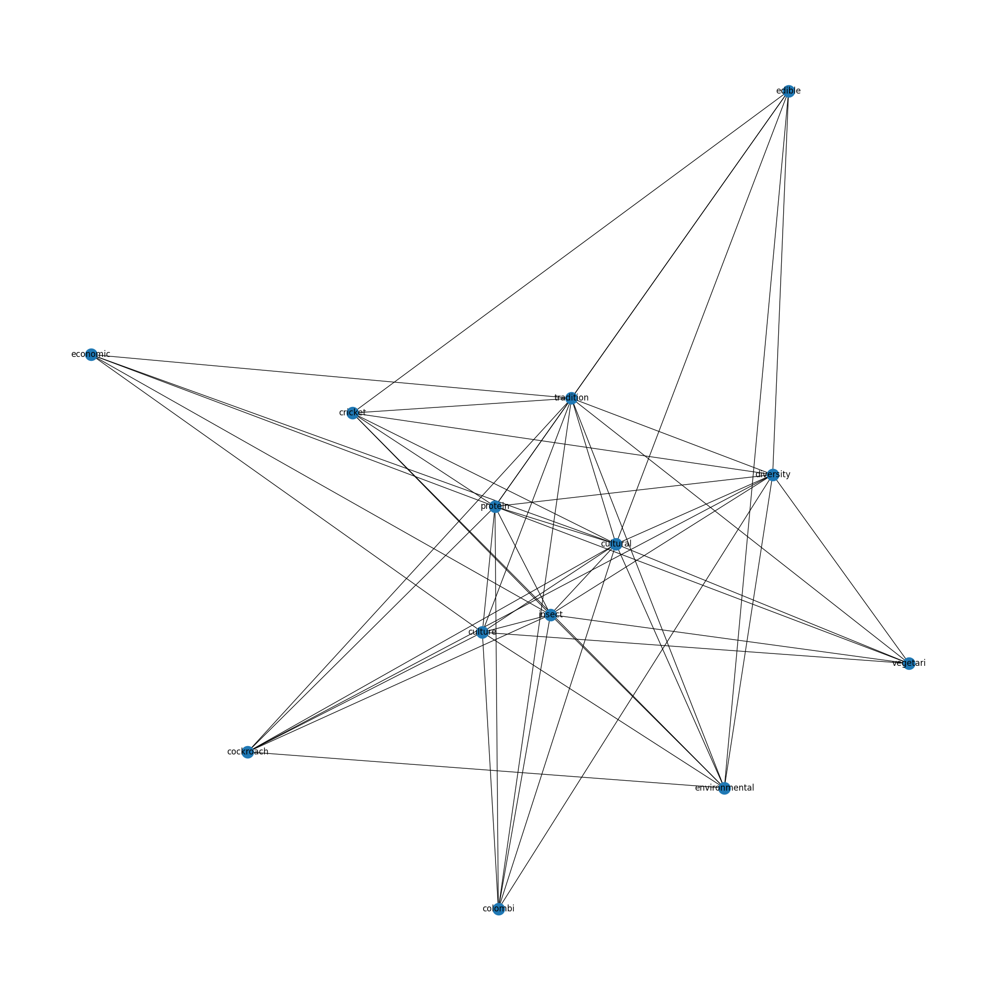

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.7:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['food','personally','enjoy','someone','although','open','notion','reminder','rooted','long','heard','always','probably','considered','prompt','mind','recognize','recognizing','reflect','region','particularly','important','benefit','appreciate','diverse','based','shared','story','approach','grew','leading','distinct','else','imperative','empathy','hygienic','history','encourages','fried','essential','fish','fly','heart','learned','acknowledge','population','likely','maintain','willing','welfare','vast','various','truth','toward','survival','sure','share','shaped','serf','scarce','safety','result','respectable','resourcefulness','resilience','reminded','prime','preconceived','develop','palatable','nourish','nothing','must','disgust','zone','china','admiration','chance','conclusion','crucial','attitude','affect','courage','compared','continues','celebrate','cheaper','profoundly','bite','challenging','pushing','rapid','rapidly','reality','realizing','biting','receives','relativism','relative','bug','reconsidering','reevaluate','cherished','reevaluating','broaden','remain','regarded','book','regular','reject','prioritized','deemed','presented','overcome','normalcy','notable','colored','nourishes','nourishment','number','observe','obtaining','offlimits','climate','openminded','outlook','overlooking','prepared','claim','paramount','partake','circumstance','path','chosen','picture','piqued','choosing','positive','possibility','repulsive','preconception','reminding','bigger','argument','apprehension','surviving','task','teach','territory','theme','thrive','appears','allows','align','transcending','unexpected','unimaginable','universally','unsettling','varied','adventurer','vary','admit','ventured','wallet','adaptability','wellcooked','wholeheartedly','adapt','window','withhold','worldview','worldwide','surprisingly','support','resonate','suitable','newfound','bias','respectful','best','reveals','being','routine','safe','safely','behavior','sample','became','science','beauty','awaits','attention','shrimp','social','aspire','sound','squeamish','squeamishness','stark','started','step','aside','strain','striving','struck','next','navigate','negatively','enjoying','enthusiasm','entirely','criticism','crab','ethical','everexpanding','evident','evolving','exchange','experiencing','experimenting','exploring','expressing','extend','eyeopening','farmed','fascination','feeling','fiction','finding','fluid','costeffective','convince','force','foreign','frequent','fresh','enjoys','criticize','frontier','critique','defines','delightful','delved','dense','depletion','description','despite','deem','differ','decline','disgusting','decent','dare','cultivation','dramatically','easier','cultivate','efficiency','efficient','elicit','elsewhere','embraced','emerges','crossed','emphasize','contrast','full','navigating','inherent','confess','inspired','interaction','intertwined','intrigued','introduced','judgment','large','completely','lifestyle','compelling','logic','logical','comparing','malleable','marked','marvel','mechanism','merely','microcosm','compare','mixed','modern','movie','comfortable','muster','mustered','narrative','deeper','inherently','ingenuity','gaining','informs','garnered','genuinely','globalization','globalized','grasshopper','hamburger','continue','contemplating','constantly','highlighting','highly','considers','honestly','honoring','horizon','humbling','humility','hygiene','consciously','ignored','act','immense','connecting','confront','impose','including','incorporate','increasing','increasingly','immed','curiosity','ecology','nutrition','crosscultural','gastronomy','gastronomic','footprint','sustainable','taboo','edibility','insectbased','entomophagy','folk','balance','sustainability','colombia','nutrient','familiarity','healthy','curious','relationship','related','regional','recognition','deeply','deal','realm','realize','hear','reaction','rational','rather','discovery','posed','everyday','portal','outsider','ordinary','embodiment','embody','onto','encounter','offense','occurs','engendering','nutritious','enlightening','enticing','novel','nostalgia','normalization','everevolving','overarching','place','point','pof','pleasantly','disposition','distinction','distinguish','planet','divide','eccentricity','driven','dynamic','eagerly','perceive','ease','passed','particular','ability','focus','le','landscape','foster','found','foundation','judge','journey','framed','free','located','farming','lower','mentioned','name','mutual','multifaceted','much','evolve','mirror','exemplifies','memory','fair','meateater','expansion','meal','express','matures','factor','maintaining','it','intriguingly','nature','intriguing','globe','inclination','going','importance','implication','grand','grapple','greater','grou','group','growing','hold','guided','handle','hesitation','head','healthier','given','indeed','influenced','integrating','intricately','intricacy','interwoven','intertwines','intersection','intergenerational','fusion','integrated','integral','acceptability','insecteating','futureoriented','futuristic','natural','need','reminiscent','discussion','delectable','delicacy','pwith','delicate','delve','desire','propels','determining','production','development','dialogue','dichotomy','difference','dinner','pragmatic','discourse','powerful','quirk','defy','range','daunting','remind','remains','relish','earth','contain','eaten','determines','bible','dessert','beyond','fulfill','appear','appeal','conventional','behind','exact','becoming','extends','fact','choose','back','exposure','familiar','challenge','coast','certainly','dislike','fiber','fine','comfort','functionality','baptist','amount','grown','adventure','crazy','daily','creature','greatest','bucaramanga','adding','agree','grows','emerge','embracing','element','embrace','accessible','ethos','affecting','boundary','debate','cooking','give','especially','getting','boyacá','cooky','couple','bridge','broader','change','center','celebration','cater','stood','capturing','stuff','spirit','steward','stretch','stand','carry','heat','complexity','changing','responsibility','security','scarcity','core','rollercoaster','country','rise','rich','response','seemingly','cringe','resonates','resistance','reservation','requires','repulsion','repugnant','conviction','converge','chowing','concept','solution','clarification','societal','snack','coming','commonplace','surprise','significantly','contribute','significant','connect','showcase','shot','connection','continuity','sentiment','supplanting','text','surprised','viewing','amazing','amid','viable','venturing','venture','varying','ancestral','valuable','unraveling','appeared','unknown','appetizing','appreciated','understanding','appreciation','allowing','viewpoint','captivating','aligns','yeah','acknowledging','wrap','adapting','wonder','without','address','winwin','willingness','wild','wield','affinity','agricultural','akin','alien','underscoring','underlying','underline','underlies','tied','thrives','threat','better','thinking','bewildering','testament','test','tends','board','table','sustenance','become','bat','touching','around','unconventional','uncharted','unappealing','ultimately','architect','arises','array','towards','translation','transformation','transform','associated','aversion','awareness','realization','render','invite','livestock','feel','level','lesson','flavor','learning','like','might','certain','dont','eating','people','consumption','thing','think','find','understand','different','strange','ant','something','part','culinary','love','taste','peanut','consume','good','would','others','santander','normal','belief','know','even','believe','preference','whether','impact','play','bottomed','big','role','pantry','beef','context','pork','interesting','depends','aspect','well','alternative','dietary','upbringing','society','maybe','consumed','unpleasant','individual','considering','humanity','experience','health','often','consuming','come','future','many','make','chicken','content','norm','world','topic','diet','type','cuisine','opportunity','personal','process','community','shape','custom','offer','went','crop','seem','could','area','spicy','background','animal','becomes','tapestry','still','exploration','another','childhood','choice','issue','kore','example','beneficial','unusual','lead','influence','tried','guess','habit','high','japanese','generation','rare','perspective','access','life','trait','provide','bag','problem','developed','source','resource','child','variety','environment','used','explore','similar','meat','common','potato','every','option','bought','never','everyone','chinese','pivotal','imagine','distinctive','great','dish','known','grow','perception','however','easily','form','exposed','lack','global','hinge','look','fascinating','palate','lens','instance','consideration','right','stomach','also','seems','seen','sense','video','shaping','though','resort','consider','specific','specie','unique','assimilate','concern','chunchullo','trying','respect','within','prospect','help','practice','surrounding','balanced','way','across','additionally','take','time','acceptable','depending','intricate','last','interplay','thought','traced','three','totally','john','tolerate','trend','potential','underscore','initially','year','hesitant','wrong','whole','welcome','honey','watch','husband','idea','identity','visited','view','impossible','vicente','incorporated','value','unfamiliar','information','ingrained','inconvenience','matter','terrified','okay','openness','seeing','salted','replacing','replace','regarding','peculiar','reason','really','person','raised','question','quantity','purpose','plate','property','promising','pleasant','product','prejudice','obtain','nuanced','term','shocking','limited','taught','locust','tasty','made','study','mean','stem','special','mexico','socorro','mostly','myriad','smaller','small','skin','skeptical','since','normalize','significance','relativity','young','anything','frequently','early','betulia','evoke','appropriate']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:13]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p4n = p4noncons.apply(clean_text)
network4n = create_red(p4n, 'network4n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network4n)
dfx

,Node,Total Co-occurrence Frequency
9,insect,4070
4,culture,2461
3,cultural,2108
10,protein,1845
11,tradition,760
5,diversity,560
2,cricket,428
8,environmental,354
0,cockroach,256
1,colombi,250


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:
#plt.title('Question 4: Cultural beliefs about insect-food based consumption - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P4.png', dpi=300, bbox_inches='tight')
#plt.show()

#P5-KNOWLEDGE ABOUT INSECTS

In [ ]:
# Crear dos grafos bipartitos diferentes
p5cons= compared['QUESTION 7 - KNOWLEDGE ABOUT INSECTS-CONS\n'].astype(str)
p5noncons= compared['P7-KNOWLEDGE ABOUT INSECTS-NONCONS'].astype(str)

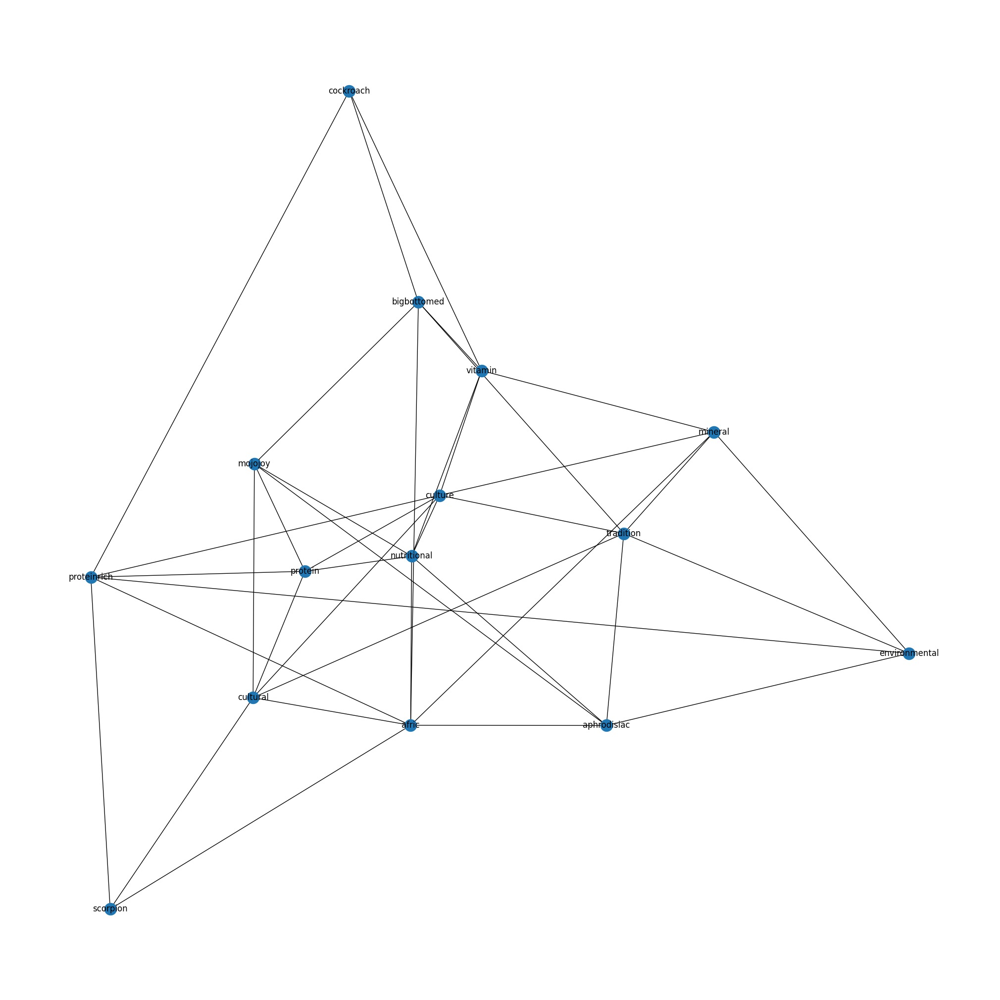

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.25:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['food','personally','enjoy','someone','although','open','notion','reminder','rooted','long','heard','always','probably','considered','prompt','mind','recognize','recognizing','reflect','region','particularly','important','benefit','appreciate','diverse','based','shared','story','approach','grew','leading','distinct','else','imperative','empathy','hygienic','history','encourages','fried','essential','fish','fly','heart','learned','acknowledge','population','likely','maintain','willing','welfare','vast','various','truth','toward','survival','sure','share','shaped','serf','scarce','safety','result','respectable','resourcefulness','resilience','reminded','prime','preconceived','develop','palatable','nourish','nothing','must','disgust','zone','china','admiration','chance','conclusion','crucial','attitude','affect','courage','compared','continues','celebrate','cheaper','profoundly','bite','challenging','pushing','rapid','rapidly','reality','realizing','biting','receives','relativism','relative','bug','reconsidering','reevaluate','cherished','reevaluating','broaden','remain','regarded','book','regular','reject','prioritized','deemed','presented','overcome','normalcy','notable','colored','nourishes','nourishment','number','observe','obtaining','offlimits','climate','openminded','outlook','overlooking','prepared','claim','paramount','partake','circumstance','path','chosen','picture','piqued','choosing','positive','possibility','repulsive','preconception','reminding','bigger','argument','apprehension','surviving','task','teach','territory','theme','thrive','appears','allows','align','transcending','unexpected','unimaginable','universally','unsettling','varied','adventurer','vary','admit','ventured','wallet','adaptability','wellcooked','wholeheartedly','adapt','window','withhold','worldview','worldwide','surprisingly','support','resonate','suitable','newfound','bias','respectful','best','reveals','being','routine','safe','safely','behavior','sample','became','science','beauty','awaits','attention','shrimp','social','aspire','sound','squeamish','squeamishness','stark','started','step','aside','strain','striving','struck','next','navigate','negatively','enjoying','enthusiasm','entirely','criticism','crab','ethical','everexpanding','evident','evolving','exchange','experiencing','experimenting','exploring','expressing','extend','eyeopening','farmed','fascination','feeling','fiction','finding','fluid','costeffective','convince','force','foreign','frequent','fresh','enjoys','criticize','frontier','critique','defines','delightful','delved','dense','depletion','description','despite','deem','differ','decline','disgusting','decent','dare','cultivation','dramatically','easier','cultivate','efficiency','efficient','elicit','elsewhere','embraced','emerges','crossed','emphasize','contrast','full','navigating','inherent','confess','inspired','interaction','intertwined','intrigued','introduced','judgment','large','completely','lifestyle','compelling','logic','logical','comparing','malleable','marked','marvel','mechanism','merely','microcosm','compare','mixed','modern','movie','comfortable','muster','mustered','narrative','deeper','inherently','ingenuity','gaining','informs','garnered','genuinely','globalization','globalized','grasshopper','hamburger','continue','contemplating','constantly','highlighting','highly','considers','honestly','honoring','horizon','humbling','humility','hygiene','consciously','ignored','act','immense','connecting','confront','impose','including','incorporate','increasing','increasingly','immed','curiosity','ecology','nutrition','crosscultural','gastronomy','gastronomic','footprint','sustainable','taboo','edibility','insectbased','entomophagy','folk','balance','sustainability','colombia','nutrient','familiarity','healthy','curious','relationship','related','regional','recognition','deeply','deal','realm','realize','hear','reaction','rational','rather','discovery','posed','everyday','portal','outsider','ordinary','embodiment','embody','onto','encounter','offense','occurs','engendering','nutritious','enlightening','enticing','novel','nostalgia','normalization','everevolving','overarching','place','point','pof','pleasantly','disposition','distinction','distinguish','planet','divide','eccentricity','driven','dynamic','eagerly','perceive','ease','passed','particular','ability','focus','le','landscape','foster','found','foundation','judge','journey','framed','free','located','farming','lower','mentioned','name','mutual','multifaceted','much','evolve','mirror','exemplifies','memory','fair','meateater','expansion','meal','express','matures','factor','maintaining','it','intriguingly','nature','intriguing','globe','inclination','going','importance','implication','grand','grapple','greater','grou','group','growing','hold','guided','handle','hesitation','head','healthier','given','indeed','influenced','integrating','intricately','intricacy','interwoven','intertwines','intersection','intergenerational','fusion','integrated','integral','acceptability','insecteating','futureoriented','futuristic','natural','need','reminiscent','discussion','delectable','delicacy','pwith','delicate','delve','desire','propels','determining','production','development','dialogue','dichotomy','difference','dinner','pragmatic','discourse','powerful','quirk','defy','range','daunting','remind','remains','relish','earth','contain','eaten','determines','bible','dessert','beyond','fulfill','appear','appeal','conventional','behind','exact','becoming','extends','fact','choose','back','exposure','familiar','challenge','coast','certainly','dislike','fiber','fine','comfort','functionality','baptist','amount','grown','adventure','crazy','daily','creature','greatest','bucaramanga','adding','agree','grows','emerge','embracing','element','embrace','accessible','ethos','affecting','boundary','debate','cooking','give','especially','getting','boyacá','cooky','couple','bridge','broader','change','center','celebration','cater','stood','capturing','stuff','spirit','steward','stretch','stand','carry','heat','complexity','changing','responsibility','security','scarcity','core','rollercoaster','country','rise','rich','response','seemingly','cringe','resonates','resistance','reservation','requires','repulsion','repugnant','conviction','converge','chowing','concept','solution','clarification','societal','snack','coming','commonplace','surprise','significantly','contribute','significant','connect','showcase','shot','connection','continuity','sentiment','supplanting','text','surprised','viewing','amazing','amid','viable','venturing','venture','varying','ancestral','valuable','unraveling','appeared','unknown','appetizing','appreciated','understanding','appreciation','allowing','viewpoint','captivating','aligns','yeah','acknowledging','wrap','adapting','wonder','without','address','winwin','willingness','wild','wield','affinity','agricultural','akin','alien','underscoring','underlying','underline','underlies','tied','thrives','threat','better','thinking','bewildering','testament','test','tends','board','table','sustenance','become','bat','touching','around','unconventional','uncharted','unappealing','ultimately','architect','arises','array','towards','translation','transformation','transform','associated','aversion','awareness','realization','render','invite','livestock','feel','level','lesson','flavor','learning','like','might','certain','dont','eating','people','consumption','thing','think','find','understand','different','strange','ant','something','part','culinary','love','taste','peanut','consume','good','would','others','santander','normal','belief','know','even','believe','preference','whether','impact','play','bottomed','big','role','pantry','beef','context','pork','interesting','depends','aspect','well','alternative','dietary','upbringing','society','maybe','consumed','unpleasant','individual','considering','humanity','experience','health','often','consuming','come','future','many','make','chicken','content','norm','world','topic','diet','type','cuisine','opportunity','personal','process','community','shape','custom','offer','went','crop','seem','could','area','spicy','background','animal','becomes','tapestry','still','exploration','another','childhood','choice','issue','kore','example','beneficial','unusual','lead','influence','tried','guess','habit','high','japanese','generation','rare','perspective','access','life','trait','provide','bag','problem','developed','source','resource','child','variety','environment','used','explore','similar','meat','common','potato','every','option','bought','never','everyone','chinese','pivotal','imagine','distinctive','great','dish','known','grow','perception','however','easily','form','exposed','lack','global','hinge','look','fascinating','palate','lens','instance','consideration','right','stomach','also','seems','seen','sense','video','shaping','though','resort','consider','specific','specie','unique','assimilate','concern','chunchullo','trying','respect','within','prospect','help','practice','surrounding','balanced','way','across','additionally','take','time','acceptable','depending','intricate','last','interplay','thought','traced','three','totally','john','tolerate','trend','potential','underscore','initially','year','hesitant','wrong','whole','welcome','honey','watch','husband','idea','identity','visited','view','impossible','vicente','incorporated','value','unfamiliar','information','ingrained','inconvenience','matter','terrified','okay','openness','seeing','salted','replacing','replace','regarding','peculiar','reason','really','person','raised','question','quantity','purpose','plate','property','promising','pleasant','product','prejudice','obtain','nuanced','term','shocking','limited','taught','locust','tasty','made','study','mean','stem','special','mexico','socorro','mostly','myriad','smaller','small','skin','skeptical','since','normalize','significance','relativity','young','anything','frequently','early','betulia','evoke','appropriate','lauded','gamechanger','insecteating','gungho','guy','innate','initiative','ingredient','indulge','hard','hel','hidden','increasingly','incorporating','highlight','highly','includes','impressive','important','honest','image','illness','grounded','grew','gastronomic','great','larger','largebottomed','gathered','general','generally','getting','kind','kicker','japanese','invaluable','intrinsic','go','intricate','goody','interplay','interesting','interest','integration','integral','expert','nourishing','remedy','delve','deal','debate','deep','deeply','deeprooted','delf','progress','program','delicacy','prized','nourishment','prevalent','prevalence','pretty','delving','depicting','dining','dinner','discovered','pot','punch','daredevil','daily','custom','cool','corner','count','cousin','regular','reflecting','refer','recognize','crossed','crucially','crunch','really','honesty','rarely','rare','range','raising','radical','quirky','distant','distinctive','plethora','overview','endures','outstanding','others','engagement','onto','enhance','onecountry','enthusiasm','offputting','enturous','oddity','occur','everevolving','every','everything','nutrientdense','exceed','exhaustive','novel','overcome','emphasize','disturbing','palatable','plate','drawback','piqued','piece','phenomenon','drink','driving','personally','drop','persist','edible','pbalance','educated','past','efficient','either','elucidation','partaking','embraced','abundance','requires','reserved','somewhat','matter','someone','mentioned','menu','snack','sixlegged','positive','mind','showing','mounting','munching','security','scoop','science','rooted','right','notion','richness','nourished','resilient','numerous','horizon','delight','eater','free','anything','animal','frontier','exploration','call','gain','amount','glimpse','allure','gather','alive','become','case','giving','beef','foster','depth','arabi','bar','fatty','diversity','aversion','feed','family','fewer','finding','central','associated','carry','dismissed','asia','foodrelated','footprint','change','discovering','chef','climate','give','closer','curiosity','globe','habit','half','beverage','hesitation','consider','higher','creative','energy','boast','history','entrepreneur','access','acceptance','cooked','crunchy','everyday','conclusion','beneficial','africa','comparable','broaden','compared','compelling','component','grapple','fare','evolving','bugeating','squirm','societal','super','stand','brimming','buffet','stem','spicing','bottomed','substantial','solid','strange','specifically','captivating','captivate','captivatingly','south','something','summary','share','categorized','revealing','commonly','said','rudimentary','composition','comprehensive','confess','confined','reunion','common','resources','connection','context','resembles','continues','require','contributor','savor','claiming','smattering','shot','cent','sink','challenging','significant','side','showcasing','show','support','chowing','serving','cherished','seriously','chest','choice','seek','chow','boost','thought','bonanza','usual','adventure','affirm','warrant','want','vivid','vital','viewed','ailment','viable','veritable','alcoholic','ventured','veil','varying','americ','varies','analysis','and','advantage','address','weave','acquainted','yeah','would','worldwide','accustomed','wood','wonderful','wild','acknowledge','actually','additionally','add','wellversed','added','wellinformed','welldocumented','wellbeing','wellbalanced','adding','usually','appeal','bodybuilder','uninformed','toss','barrier','basic','time','throughout','three','remove','beckons','therefore','texture','testament','behind','beloved','tapestry','talking','talk','tale','table','big','totally','balanced','balance','type','unfamiliarity','undoubtedly','understand','underscoring','area','uncover','array','typically','assistance','aware','truly','trove','tried','astounding','attention','available','transition','transcended','renowned','rather','reminder','long','meet','flavor','meanwhile','folk','fondly','force','foreign','forget','longstanding','local','expect','loaded','form','linked','lineup','frequently','lift','less','legit','least','firmly','feeling','feature','feast','noting','noteworthy','expertise','notably','notable','normal','nonetheless','express','negative','extend','neck','extension','familiarity','mysterious','fan','munch','multivitamin','fantastic','modest','furthermore','food','like','source','might','know','even','knowledge','often','content','rich','region','world','offer','various','creature','essential','diet','consumed','acid','part','dont','people','meat','heard','traditional','limited','amino','resource','consume','contribute','example','tiny','aspect','idea','valuable','flour','production','practice','conventional','certain','come','concern','however','country','addressing','especially','insight','challenge','hold','experience','good','santander','fact','scarcity','farming','much','seem','also','consuming','embracing','deficiency','realm','provide','alleviate','global','high','addition','could','tequila','level','fried','specific','nutritious','adventurous','particularly','nutrition','different','concept','cuisine','indeed','curious','acting','novelty','including','america','considered','quality','avenue','subject','little','supplement','dietary','unconventional','tribe','term','learn','future','beetle','thing','think','latin','diverse','topic','larva','posse','include','eager','staple','profile','community','eating','nature','clay','make','value','grasshopper','single','many','unique','particular','place','play','incorporate','education','norm','overall','natural','landscape','gastronomy','known','gluten','found','livestock','making','intriguing','find','mere','dish','must','factor','option','need','never','exploring','explore','lack','note','excellent','innovative','evident','information','hesitate','incredibly','feel','human','significance','scientifically','relationship','remarkable','continue','understanding','contain','reveals','roasted','role','clear','verified','chinese','seems','seen','serve','chapulines','significantly','believe','take','beyond','sustenance','regarding','container','well','purpose','powerhouse','widespread','pressing','widely','across','probably','promise','whether','bug','crucial','way','touted','wide','wary','used','though','lead','initial','territory','variety','water','vary','impact','system','worth','russia','sure','stop','step','look','looking','interested','toward','traction','knowing','underestimated','made','wealth','abundantly','uncharted','indi','jungle','twist','turning','land','unusual','weird','indepth','treasure','venturing','translation','wellrounded','intricacy','video','potentially','spectrum','participant','replace','relatively','related','reduced','reassuring','online','opportunity','rearing','pack','read','reach','purposes','sound','providing','pasta','promising','perception','personal','pest','pressure','planet','pound','popular','represent','iron','critter','cricketbased','zinc','rival','vitamins','snail','omega'
]
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
p5c = p5cons.apply(clean_text)
network5 = create_red(p5c, 'network5')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network5)
dfx

,Node,Total Co-occurrence Frequency
10,protein,2494
9,nutritional,2465
5,culture,1512
14,vitamin,897
4,cultural,588
8,mojojoy,576
2,bigbottomed,420
7,mineral,336
13,tradition,306
0,afric,296


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

#5N

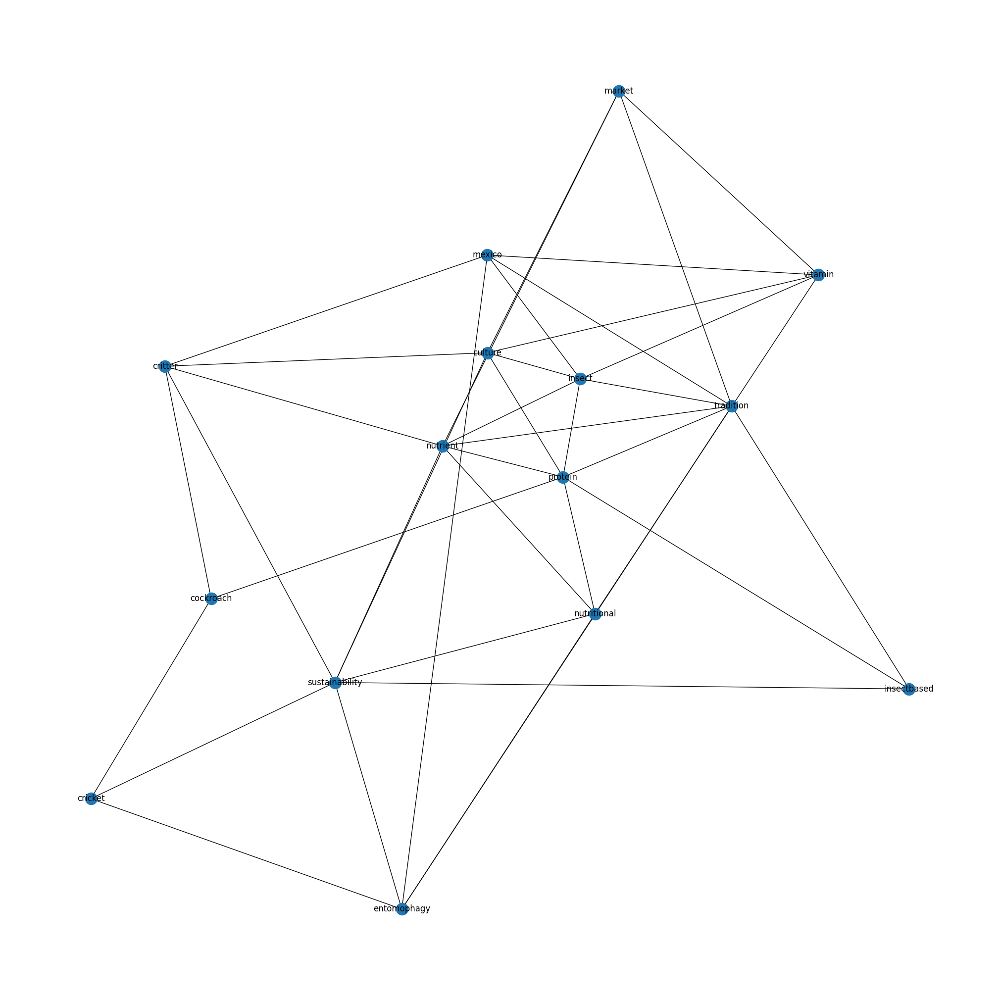

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.25:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['food','personally','enjoy','someone','although','open','notion','reminder','rooted','long','heard','always','probably','considered','prompt','mind','recognize','recognizing','reflect','region','particularly','important','benefit','appreciate','diverse','based','shared','story','approach','grew','leading','distinct','else','imperative','empathy','hygienic','history','encourages','fried','essential','fish','fly','heart','learned','acknowledge','population','likely','maintain','willing','welfare','vast','various','truth','toward','survival','sure','share','shaped','serf','scarce','safety','result','respectable','resourcefulness','resilience','reminded','prime','preconceived','develop','palatable','nourish','nothing','must','disgust','zone','admiration','chance','conclusion','crucial','attitude','affect','courage','compared','continues','celebrate','profoundly','bite','challenging','pushing','rapid','rapidly','reality','realizing','biting','receives','relativism','relative','bug','reconsidering','reevaluate','cherished','reevaluating','broaden','remain','regarded','book','regular','reject','prioritized','deemed','presented','overcome','normalcy','notable','colored','nourishes','nourishment','number','observe','obtaining','offlimits','climate','openminded','outlook','overlooking','prepared','claim','paramount','partake','circumstance','path','chosen','picture','piqued','choosing','positive','possibility','repulsive','preconception','reminding','bigger','argument','apprehension','surviving','task','teach','territory','theme','thrive','appears','allows','align','transcending','unexpected','unimaginable','universally','unsettling','varied','adventurer','vary','admit','ventured','wallet','adaptability','wellcooked','wholeheartedly','adapt','window','withhold','worldview','worldwide','surprisingly','support','resonate','suitable','newfound','bias','respectful','best','reveals','being','routine','safe','safely','behavior','sample','became','science','beauty','awaits','attention','shrimp','social','aspire','sound','squeamish','squeamishness','stark','started','step','aside','strain','striving','struck','next','navigate','negatively','enjoying','enthusiasm','entirely','criticism','crab','ethical','everexpanding','evident','evolving','exchange','experiencing','experimenting','exploring','expressing','extend','eyeopening','farmed','fascination','feeling','fiction','finding','fluid','costeffective','convince','force','foreign','frequent','fresh','enjoys','criticize','frontier','critique','defines','delightful','delved','dense','depletion','description','despite','deem','differ','decline','disgusting','decent','dare','cultivation','dramatically','easier','cultivate','efficiency','efficient','elicit','elsewhere','embraced','emerges','crossed','emphasize','contrast','full','navigating','inherent','confess','inspired','interaction','intertwined','intrigued','introduced','judgment','large','completely','lifestyle','compelling','logic','logical','comparing','malleable','marked','marvel','mechanism','merely','microcosm','compare','mixed','modern','movie','comfortable','muster','mustered','narrative','deeper','inherently','ingenuity','gaining','informs','garnered','genuinely','globalization','globalized','grasshopper','hamburger','continue','contemplating','constantly','highlighting','highly','considers','honestly','honoring','horizon','humbling','humility','hygiene','consciously','ignored','act','immense','connecting','confront','impose','including','incorporate','increasing','increasingly','immed','curiosity','ecology','nutrition','gastronomy','gastronomic','footprint','familiarity','relationship','related','regional','recognition','deeply','deal','realm','realize','hear','reaction','rational','rather','discovery','posed','everyday','portal','outsider','ordinary','embodiment','embody','onto','encounter','offense','occurs','engendering','nutritious','enlightening','enticing','novel','nostalgia','normalization','everevolving','overarching','place','point','pof','pleasantly','disposition','distinction','distinguish','planet','divide','eccentricity','driven','dynamic','eagerly','perceive','ease','passed','particular','ability','focus','le','landscape','foster','found','foundation','judge','journey','framed','free','located','farming','lower','mentioned','name','mutual','multifaceted','much','evolve','mirror','exemplifies','memory','fair','meateater','expansion','meal','express','matures','factor','maintaining','it','intriguingly','nature','intriguing','globe','inclination','going','importance','implication','grand','grapple','greater','grou','group','growing','hold','guided','handle','hesitation','head','healthier','given','indeed','influenced','integrating','intricately','intricacy','interwoven','intertwines','intersection','intergenerational','fusion','integrated','integral','acceptability','insecteating','futureoriented','futuristic','natural','need','reminiscent','discussion','delectable','delicacy','pwith','delicate','delve','desire','propels','determining','production','development','dialogue','dichotomy','difference','dinner','pragmatic','discourse','powerful','quirk','defy','range','daunting','remind','remains','relish','earth','contain','eaten','determines','bible','dessert','beyond','fulfill','appear','appeal','conventional','behind','exact','becoming','extends','fact','choose','back','exposure','familiar','challenge','coast','certainly','dislike','fiber','fine','comfort','functionality','baptist','amount','grown','adventure','crazy','daily','creature','greatest','bucaramanga','adding','agree','grows','emerge','embracing','element','embrace','accessible','ethos','affecting','boundary','debate','cooking','give','especially','getting','boyacá','cooky','couple','bridge','broader','change','center','celebration','cater','stood','capturing','stuff','spirit','steward','stretch','stand','carry','heat','complexity','changing','responsibility','security','scarcity','core','rollercoaster','country','rise','rich','response','seemingly','cringe','resonates','resistance','reservation','requires','repulsion','repugnant','conviction','converge','chowing','concept','solution','clarification','societal','snack','coming','commonplace','surprise','significantly','contribute','significant','connect','showcase','shot','connection','continuity','sentiment','supplanting','text','surprised','viewing','amazing','amid','viable','venturing','venture','varying','ancestral','valuable','unraveling','appeared','unknown','appetizing','appreciated','understanding','appreciation','allowing','viewpoint','captivating','aligns','yeah','acknowledging','wrap','adapting','wonder','without','address','winwin','willingness','wild','wield','affinity','agricultural','akin','alien','underscoring','underlying','underline','underlies','tied','thrives','threat','better','thinking','bewildering','testament','test','tends','board','table','sustenance','become','bat','touching','around','unconventional','uncharted','unappealing','ultimately','architect','arises','array','towards','translation','transformation','transform','associated','aversion','awareness','realization','render','invite','livestock','feel','level','lesson','flavor','learning','like','might','certain','dont','eating','people','consumption','thing','think','find','understand','different','strange','ant','something','part','culinary','love','taste','peanut','consume','good','would','others','santander','normal','belief','know','even','believe','preference','whether','impact','play','bottomed','big','role','pantry','beef','context','pork','interesting','depends','aspect','well','alternative','dietary','upbringing','society','maybe','consumed','unpleasant','individual','considering','humanity','experience','health','often','consuming','come','future','many','make','chicken','content','norm','world','topic','diet','type','cuisine','opportunity','personal','process','community','shape','custom','offer','went','crop','seem','could','area','spicy','background','animal','becomes','tapestry','still','exploration','another','childhood','choice','issue','kore','example','beneficial','unusual','lead','influence','tried','guess','habit','high','japanese','generation','rare','perspective','access','life','trait','provide','bag','problem','developed','source','resource','child','variety','environment','used','explore','similar','meat','common','potato','every','option','bought','never','everyone','chinese','pivotal','imagine','distinctive','great','dish','known','grow','perception','however','easily','form','exposed','lack','global','hinge','look','fascinating','palate','lens','instance','consideration','right','stomach','also','seems','seen','sense','video','shaping','though','resort','consider','specific','specie','unique','assimilate','concern','chunchullo','trying','respect','within','prospect','help','practice','surrounding','balanced','way','across','additionally','take','time','acceptable','depending','intricate','last','interplay','thought','traced','three','totally','john','tolerate','trend','potential','underscore','initially','year','hesitant','wrong','whole','welcome','honey','watch','husband','idea','identity','visited','view','impossible','vicente','incorporated','value','unfamiliar','information','ingrained','inconvenience','matter','terrified','okay','openness','seeing','salted','replacing','replace','regarding','peculiar','reason','really','person','raised','question','quantity','purpose','plate','property','promising','pleasant','product','prejudice','obtain','nuanced','term','shocking','limited','taught','locust','tasty','made','study','mean','stem','special','socorro','mostly','myriad','smaller','small','skin','skeptical','since','normalize','significance','relativity','young','anything','frequently','early','betulia','evoke','appropriate','lauded','gamechanger','insecteating','gungho','guy','innate','initiative','ingredient','indulge','hard','hel','hidden','increasingly','incorporating','highlight','highly','includes','impressive','important','honest','image','illness','grounded','grew','gastronomic','great','larger','largebottomed','gathered','general','generally','getting','kind','kicker','japanese','invaluable','intrinsic','go','intricate','goody','interplay','interesting','interest','integration','integral','expert','nourishing','remedy','delve','deal','debate','deep','deeply','deeprooted','delf','progress','program','delicacy','prized','nourishment','prevalent','prevalence','pretty','delving','depicting','dining','dinner','discovered','pot','punch','daredevil','daily','custom','cool','corner','count','cousin','regular','reflecting','refer','recognize','crossed','crucially','crunch','really','honesty','rarely','rare','range','raising','radical','quirky','distant','distinctive','plethora','overview','endures','outstanding','others','engagement','onto','enhance','onecountry','enthusiasm','offputting','enturous','oddity','occur','everevolving','every','everything','nutrientdense','exceed','exhaustive','novel','overcome','emphasize','disturbing','palatable','plate','drawback','piqued','piece','phenomenon','drink','driving','personally','drop','persist','edible','pbalance','educated','past','efficient','either','elucidation','partaking','embraced','abundance','requires','reserved','somewhat','matter','someone','mentioned','menu','snack','sixlegged','positive','mind','showing','mounting','munching','security','scoop','science','rooted','right','notion','richness','nourished','resilient','numerous','horizon','delight','eater','free','anything','animal','frontier','exploration','call','gain','amount','glimpse','allure','gather','alive','become','case','giving','beef','foster','depth','arabi','bar','fatty','diversity','aversion','feed','family','fewer','finding','central','associated','carry','dismissed','asia','foodrelated','footprint','change','discovering','chef','climate','give','closer','curiosity','globe','habit','half','beverage','hesitation','consider','higher','creative','energy','boast','history','entrepreneur','access','acceptance','cooked','crunchy','everyday','conclusion','beneficial','africa','comparable','broaden','compared','compelling','component','grapple','fare','evolving','bugeating','squirm','societal','super','stand','brimming','buffet','stem','spicing','bottomed','substantial','solid','strange','specifically','captivating','captivate','captivatingly','south','something','summary','share','categorized','revealing','commonly','said','rudimentary','composition','comprehensive','confess','confined','reunion','common','resources','connection','context','resembles','continues','require','contributor','savor','claiming','smattering','shot','cent','sink','challenging','significant','side','showcasing','show','support','chowing','serving','cherished','seriously','chest','choice','seek','chow','boost','thought','bonanza','usual','adventure','affirm','warrant','want','vivid','vital','viewed','ailment','viable','veritable','alcoholic','ventured','veil','varying','americ','varies','analysis','and','advantage','address','weave','acquainted','yeah','would','worldwide','accustomed','wood','wonderful','wild','acknowledge','actually','additionally','add','wellversed','added','wellinformed','welldocumented','wellbeing','wellbalanced','adding','usually','appeal','bodybuilder','uninformed','toss','barrier','basic','time','throughout','three','remove','beckons','therefore','texture','testament','behind','beloved','tapestry','talking','talk','tale','table','big','totally','balanced','balance','type','unfamiliarity','undoubtedly','understand','underscoring','area','uncover','array','typically','assistance','aware','truly','trove','tried','astounding','attention','available','transition','transcended','renowned','rather','reminder','long','meet','flavor','meanwhile','folk','fondly','force','foreign','forget','longstanding','local','expect','loaded','form','linked','lineup','frequently','lift','less','legit','least','firmly','feeling','feature','feast','noting','noteworthy','expertise','notably','notable','normal','nonetheless','express','negative','extend','neck','extension','familiarity','mysterious','fan','munch','fantastic','modest','furthermore','food','like','source','might','know','even','knowledge','often','content','rich','region','world','offer','various','creature','essential','diet','consumed','acid','part','dont','people','meat','heard','traditional','limited','amino','resource','consume','contribute','example','tiny','aspect','idea','valuable','flour','production','practice','conventional','certain','come','concern','however','country','addressing','especially','insight','challenge','hold','experience','good','santander','fact','scarcity','farming','much','seem','also','consuming','embracing','deficiency','realm','provide','alleviate','global','high','addition','could','tequila','level','fried','specific','nutritious','adventurous','particularly','nutrition','different','concept','cuisine','indeed','curious','acting','novelty','including','america','considered','quality','avenue','subject','little','supplement','dietary','unconventional','tribe','term','learn','future','beetle','thing','think','latin','diverse','topic','larva','posse','include','eager','staple','profile','community','eating','nature','clay','make','value','grasshopper','single','many','unique','particular','place','play','incorporate','education','norm','overall','natural','landscape','gastronomy','known','gluten','found','livestock','making','intriguing','find','mere','dish','must','factor','option','need','never','exploring','explore','lack','note','excellent','innovative','evident','information','hesitate','incredibly','feel','human','significance','scientifically','relationship','remarkable','continue','understanding','contain','reveals','roasted','role','clear','verified','chinese','seems','seen','serve','chapulines','significantly','believe','take','beyond','sustenance','regarding','container','well','purpose','powerhouse','widespread','pressing','widely','across','probably','promise','whether','bug','crucial','way','touted','wide','wary','used','though','lead','initial','territory','variety','water','vary','impact','system','worth','sure','stop','step','look','looking','interested','toward','traction','knowing','underestimated','made','wealth','abundantly','uncharted','indi','jungle','twist','turning','land','unusual','weird','indepth','treasure','venturing','translation','wellrounded','intricacy','video','potentially','spectrum','participant','replace','relatively','related','reduced','reassuring','online','opportunity','rearing','pack','read','reach','purposes','sound','providing','pasta','promising','perception','personal','pest','pressure','planet','pound','popular','represent','quite','ground','easy','breed','packed','taken','sausage','exotic','adaptation','coloring','cochinilla','interestingly','demand','dedicated','interconnectedness','crispy','project','assortment','creativity','deny','sight','connoisseur','one','skewer','enthusiast','shortage','shift','selling','ancient','conversation','stick','gourmet','calcium','baked','symbolize','perfection','closing','necessity','turn','admire','powdered','perhaps','reducing','regard','regulatory','pin','remarkably','worked','redefine','reshape','passion','resourceefficient','pinpoint','power','pique','push','produce','profound','potency','responsible','projected','post','popularly','wondered','popping','prominent','witness','proteinpacked','pondering','played','precise','weight','wisdom','uncanny','ripple','store','straight','summon','superheroes','supermarket','untapped','underwent','surface','surge','sushi','undeniably','symbol','tantalize','technical','tell','tempted','terrain','thriving','tourist','undeniable','transformed','treat','vegan','stewardship','rumor','vegetable','rushing','savored','scale','scratched','served','turned','simple','size','skewered','snippet','sold','space','spark','vibrant','speaking','spice','stage','stagnant','stall','versatility','sparked','accompany','offering','contemplate','caused','century','chomping','chowdowns','circle','class','closely','compound','condiment','constitutes','crispyfried','nutty','crossroad','cultivating','day','digging','dimension','drawn','earthy','effect','emerged','encountered','catching','care','captured','bugeater','adhering','adjustment','advocate','agent','alike','among','anecdote','anyone','arose','astonishing','audacity','avoid','away','ballgame','believed','belonging','bigbottomed','bioactive','blend','brave','brim','bring','bud','endlessly','enjoyed','enough','inevitably','insectderived','insectinfused','intake','intensive','intrigue','introspection','jampacked','keep','knowledgeable','line','acutely','medicinal','medium','meeting','mental','minilivestock','modernity','moment','momentum','movement','nittygritty','nuance','nutritionally','ingenious','industry','enterprising','indulging','environmental','ethic','ever','exactly','except','exciting','exist','existence','exploitation','famous','fancy','floating','follow','friendly','fueled','grain','grasp','healing','healthy','heritage','hurdle','mark','harmful','researcher','resourceintensive','powder','ecologically']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p5n = p5noncons.apply(clean_text)
network5n = create_red(p5n, 'network5')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network5n)
dfx

,Node,Total Co-occurrence Frequency
5,insect,5529
11,protein,3770
3,culture,1846
9,nutrient,954
13,tradition,725
8,mexico,565
10,nutritional,560
0,cockroach,399
1,cricket,312
12,sustainability,276


In [ ]:
# Texto proporcionado
texto = """
harmful	232
22	researcher
resourceintensive
	powder
	ecologically
"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'harmful','researcher','resourceintensive','powder','ecologically'


In [ ]:
#plt.title('Question 5: Knowledge about insect-based food consumption all over the world - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P5.png', dpi=300, bbox_inches='tight')
#plt.show()

In [ ]:
#print("p5c:", p5c.nodes())
#print("p5n:", p5n.nodes())


#6-KNOWLEDGE OF INSECT CONSUMPTION IN COLOMBIA

In [ ]:
p6cons= compared['8-KNOWLEDGE OF INSECT CONSUMPTION IN COLOMBIA-CONS'].astype(str)
p6noncons= compared['8-KNOWLEDGE OF INSECT CONSUMPTION IN COLOMBIA-NONCONS'].astype(str)

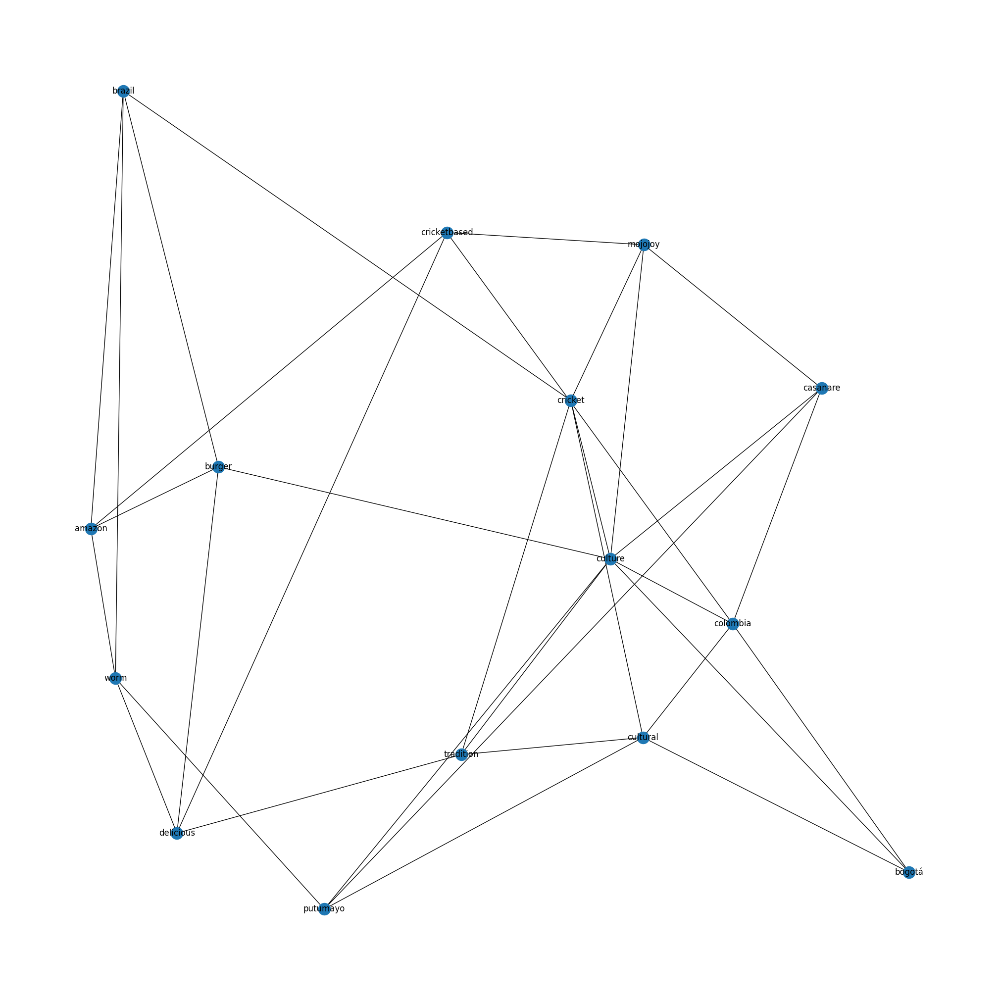

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.25:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['food','personally','enjoy','someone','although','open','notion','reminder','rooted','long','heard','always','probably','considered','prompt','mind','recognize','recognizing','reflect','region','particularly','important','benefit','appreciate','diverse','based','shared','story','approach','grew','leading','distinct','else','imperative','empathy','hygienic','history','encourages','fried','essential','fish','fly','heart','learned','acknowledge','population','likely','maintain','willing','welfare','vast','various','truth','toward','survival','sure','share','shaped','serf','scarce','safety','result','respectable','resourcefulness','resilience','reminded','prime','preconceived','develop','palatable','nourish','nothing','must','disgust','zone','admiration','chance','conclusion','crucial','attitude','affect','courage','compared','continues','celebrate','profoundly','bite','challenging','pushing','rapid','rapidly','reality','realizing','biting','receives','relativism','relative','bug','reconsidering','reevaluate','cherished','reevaluating','broaden','remain','regarded','book','regular','reject','prioritized','deemed','presented','overcome','normalcy','notable','colored','nourishes','nourishment','number','observe','obtaining','offlimits','climate','openminded','outlook','overlooking','prepared','claim','paramount','partake','circumstance','path','chosen','picture','piqued','choosing','positive','possibility','repulsive','preconception','reminding','bigger','argument','apprehension','surviving','task','teach','territory','theme','thrive','appears','allows','align','transcending','unexpected','unimaginable','universally','unsettling','varied','adventurer','vary','admit','ventured','wallet','adaptability','wellcooked','wholeheartedly','adapt','window','withhold','worldview','worldwide','surprisingly','support','resonate','suitable','newfound','bias','respectful','best','reveals','being','routine','safe','safely','behavior','sample','became','science','beauty','awaits','attention','shrimp','social','aspire','sound','squeamish','squeamishness','stark','started','step','aside','strain','striving','struck','next','navigate','negatively','enjoying','enthusiasm','entirely','criticism','crab','ethical','everexpanding','evident','evolving','exchange','experiencing','experimenting','exploring','expressing','extend','eyeopening','farmed','fascination','feeling','fiction','finding','fluid','costeffective','convince','force','foreign','frequent','fresh','enjoys','criticize','frontier','critique','defines','delightful','delved','dense','depletion','description','despite','deem','differ','decline','disgusting','decent','dare','cultivation','dramatically','easier','cultivate','efficiency','efficient','elicit','elsewhere','embraced','emerges','crossed','emphasize','contrast','full','navigating','inherent','confess','inspired','interaction','intertwined','intrigued','introduced','judgment','large','completely','lifestyle','compelling','logic','logical','comparing','malleable','marked','marvel','mechanism','merely','microcosm','compare','mixed','modern','movie','comfortable','muster','mustered','narrative','deeper','inherently','ingenuity','gaining','informs','garnered','genuinely','globalization','globalized','grasshopper','hamburger','continue','contemplating','constantly','highlighting','highly','considers','honestly','honoring','horizon','humbling','humility','hygiene','consciously','ignored','act','immense','connecting','confront','impose','including','incorporate','increasing','increasingly','immed','curiosity','nutrition','gastronomy','gastronomic','footprint','familiarity','relationship','related','regional','recognition','deeply','deal','realm','realize','hear','reaction','rational','rather','discovery','posed','everyday','portal','outsider','ordinary','embodiment','embody','onto','encounter','offense','occurs','engendering','nutritious','enlightening','enticing','novel','nostalgia','normalization','everevolving','overarching','place','point','pof','pleasantly','disposition','distinction','distinguish','planet','divide','eccentricity','driven','dynamic','eagerly','perceive','ease','passed','particular','ability','focus','le','landscape','foster','found','foundation','judge','journey','framed','free','located','farming','lower','mentioned','name','mutual','multifaceted','much','evolve','mirror','exemplifies','memory','fair','meateater','expansion','meal','express','matures','factor','maintaining','it','intriguingly','nature','intriguing','globe','inclination','going','importance','implication','grand','grapple','greater','grou','group','growing','hold','guided','handle','hesitation','head','healthier','given','indeed','influenced','integrating','intricately','intricacy','interwoven','intertwines','intersection','intergenerational','fusion','integrated','integral','acceptability','insecteating','futureoriented','futuristic','natural','need','reminiscent','discussion','delectable','delicacy','pwith','delicate','delve','desire','propels','determining','production','development','dialogue','dichotomy','difference','dinner','pragmatic','discourse','powerful','quirk','defy','range','daunting','remind','remains','relish','earth','contain','eaten','determines','bible','dessert','beyond','fulfill','appear','appeal','conventional','behind','exact','becoming','extends','fact','choose','back','exposure','familiar','challenge','coast','certainly','dislike','fiber','fine','comfort','functionality','baptist','amount','grown','adventure','crazy','daily','creature','greatest','bucaramanga','adding','agree','grows','emerge','embracing','element','embrace','accessible','ethos','affecting','boundary','debate','cooking','give','especially','getting','boyacá','cooky','couple','bridge','broader','change','center','celebration','cater','stood','capturing','stuff','spirit','steward','stretch','stand','carry','heat','complexity','changing','responsibility','security','scarcity','core','rollercoaster','country','rise','rich','response','seemingly','cringe','resonates','resistance','reservation','requires','repulsion','repugnant','conviction','converge','chowing','concept','solution','clarification','societal','snack','coming','commonplace','surprise','significantly','contribute','significant','connect','showcase','shot','connection','continuity','sentiment','supplanting','text','surprised','viewing','amazing','amid','viable','venturing','venture','varying','ancestral','valuable','unraveling','appeared','unknown','appetizing','appreciated','understanding','appreciation','allowing','viewpoint','captivating','aligns','yeah','acknowledging','wrap','adapting','wonder','without','address','winwin','willingness','wild','wield','affinity','agricultural','akin','alien','underscoring','underlying','underline','underlies','tied','thrives','threat','better','thinking','bewildering','testament','test','tends','board','table','sustenance','become','bat','touching','around','unconventional','uncharted','unappealing','ultimately','architect','arises','array','towards','translation','transformation','transform','associated','aversion','awareness','realization','render','invite','livestock','feel','level','lesson','flavor','learning','like','might','certain','dont','eating','people','consumption','thing','think','find','understand','different','strange','ant','something','part','culinary','love','taste','peanut','consume','good','would','others','santander','normal','belief','know','even','believe','preference','whether','impact','play','bottomed','big','role','pantry','beef','context','pork','interesting','depends','aspect','well','alternative','dietary','upbringing','society','maybe','consumed','unpleasant','individual','considering','humanity','experience','health','often','consuming','come','future','many','make','chicken','content','norm','world','topic','diet','type','cuisine','opportunity','personal','process','community','shape','custom','offer','went','crop','seem','could','area','spicy','background','animal','becomes','tapestry','still','exploration','another','childhood','choice','issue','kore','example','beneficial','unusual','lead','influence','tried','guess','habit','high','japanese','generation','rare','perspective','access','life','trait','provide','bag','problem','developed','source','resource','child','variety','environment','used','explore','similar','meat','common','potato','every','option','bought','never','everyone','chinese','pivotal','imagine','distinctive','great','dish','known','grow','perception','however','easily','form','exposed','lack','global','hinge','look','fascinating','palate','lens','instance','consideration','right','stomach','also','seems','seen','sense','video','shaping','though','resort','consider','specific','specie','unique','assimilate','concern','chunchullo','trying','respect','within','prospect','help','practice','surrounding','balanced','way','across','additionally','take','time','acceptable','depending','intricate','last','interplay','thought','traced','three','totally','john','tolerate','trend','potential','underscore','initially','year','hesitant','wrong','whole','welcome','honey','watch','husband','idea','identity','visited','view','impossible','vicente','incorporated','value','unfamiliar','information','ingrained','inconvenience','matter','terrified','okay','openness','seeing','salted','replacing','replace','regarding','peculiar','reason','really','person','raised','question','quantity','purpose','plate','property','promising','pleasant','product','prejudice','obtain','nuanced','term','shocking','limited','taught','locust','tasty','made','study','mean','stem','special','socorro','mostly','myriad','smaller','small','skin','skeptical','since','normalize','significance','relativity','young','anything','frequently','early','betulia','evoke','appropriate','lauded','gamechanger','insecteating','gungho','guy','innate','initiative','ingredient','indulge','hard','hel','hidden','increasingly','incorporating','highlight','highly','includes','impressive','important','honest','image','illness','grounded','grew','gastronomic','great','larger','largebottomed','gathered','general','generally','getting','kind','kicker','japanese','invaluable','intrinsic','go','intricate','goody','interplay','interesting','interest','integration','integral','expert','nourishing','remedy','delve','deal','debate','deep','deeply','deeprooted','delf','progress','program','delicacy','prized','nourishment','prevalent','prevalence','pretty','delving','depicting','dining','dinner','discovered','pot','punch','daredevil','daily','custom','cool','corner','count','cousin','regular','reflecting','refer','recognize','crossed','crucially','crunch','really','honesty','rarely','rare','range','raising','radical','quirky','distant','distinctive','plethora','overview','endures','outstanding','others','engagement','onto','enhance','onecountry','enthusiasm','offputting','enturous','oddity','occur','everevolving','every','everything','nutrientdense','exceed','exhaustive','novel','overcome','emphasize','disturbing','palatable','plate','drawback','piqued','piece','phenomenon','drink','driving','personally','drop','persist','edible','pbalance','educated','past','efficient','either','elucidation','partaking','embraced','abundance','requires','reserved','somewhat','matter','someone','mentioned','menu','snack','sixlegged','positive','mind','showing','mounting','munching','security','scoop','science','rooted','right','notion','richness','nourished','resilient','numerous','horizon','delight','eater','free','anything','animal','frontier','exploration','call','gain','amount','glimpse','allure','gather','alive','become','case','giving','beef','foster','depth','arabi','bar','fatty','diversity','aversion','feed','family','fewer','finding','central','associated','carry','dismissed','asia','foodrelated','footprint','change','discovering','chef','climate','give','closer','curiosity','globe','habit','half','beverage','hesitation','consider','higher','creative','energy','boast','history','entrepreneur','access','acceptance','cooked','crunchy','everyday','conclusion','beneficial','africa','comparable','broaden','compared','compelling','component','grapple','fare','evolving','bugeating','squirm','societal','super','stand','brimming','buffet','stem','spicing','bottomed','substantial','solid','strange','specifically','captivating','captivate','captivatingly','south','something','summary','share','categorized','revealing','commonly','said','rudimentary','composition','comprehensive','confess','confined','reunion','common','resources','connection','context','resembles','continues','require','contributor','savor','claiming','smattering','shot','cent','sink','challenging','significant','side','showcasing','show','support','chowing','serving','cherished','seriously','chest','choice','seek','chow','boost','thought','bonanza','usual','adventure','affirm','warrant','want','vivid','vital','viewed','ailment','viable','veritable','alcoholic','ventured','veil','varying','americ','varies','analysis','and','advantage','address','weave','acquainted','yeah','would','worldwide','accustomed','wood','wonderful','wild','acknowledge','actually','additionally','add','wellversed','added','wellinformed','welldocumented','wellbeing','wellbalanced','adding','usually','appeal','bodybuilder','uninformed','toss','barrier','basic','time','throughout','three','remove','beckons','therefore','texture','testament','behind','beloved','tapestry','talking','talk','tale','table','big','totally','balanced','balance','type','unfamiliarity','undoubtedly','understand','underscoring','area','uncover','array','typically','assistance','aware','truly','trove','tried','astounding','attention','available','transition','transcended','renowned','rather','reminder','long','meet','flavor','meanwhile','folk','fondly','force','foreign','forget','longstanding','local','expect','loaded','form','linked','lineup','frequently','lift','less','legit','least','firmly','feeling','feature','feast','noting','noteworthy','expertise','notably','notable','normal','nonetheless','express','negative','extend','neck','extension','familiarity','mysterious','fan','munch','fantastic','modest','furthermore','food','like','source','might','know','even','knowledge','often','content','rich','region','world','offer','various','creature','essential','diet','consumed','acid','part','dont','people','meat','heard','traditional','limited','amino','resource','consume','contribute','example','tiny','aspect','idea','valuable','flour','production','practice','conventional','certain','come','concern','however','country','addressing','especially','insight','challenge','hold','experience','good','santander','fact','scarcity','farming','much','seem','also','consuming','embracing','deficiency','realm','provide','alleviate','global','high','addition','could','tequila','level','fried','specific','nutritious','adventurous','particularly','nutrition','different','concept','cuisine','indeed','curious','acting','novelty','including','america','considered','quality','avenue','subject','little','supplement','dietary','unconventional','tribe','term','learn','future','beetle','thing','think','latin','diverse','topic','larva','posse','include','eager','staple','profile','community','eating','nature','clay','make','value','grasshopper','single','many','unique','particular','place','play','incorporate','education','norm','overall','natural','landscape','gastronomy','known','gluten','found','livestock','making','intriguing','find','mere','dish','must','factor','option','need','never','exploring','explore','lack','note','excellent','innovative','evident','information','hesitate','incredibly','feel','human','significance','scientifically','relationship','remarkable','continue','understanding','contain','reveals','roasted','role','clear','verified','chinese','seems','seen','serve','chapulines','significantly','believe','take','beyond','sustenance','regarding','container','well','purpose','powerhouse','widespread','pressing','widely','across','probably','promise','whether','bug','crucial','way','touted','wide','wary','used','though','lead','initial','territory','variety','water','vary','impact','system','worth','sure','stop','step','look','looking','interested','toward','traction','knowing','underestimated','made','wealth','abundantly','uncharted','indi','jungle','twist','turning','land','unusual','weird','indepth','treasure','venturing','translation','wellrounded','intricacy','video','potentially','spectrum','participant','replace','relatively','related','reduced','reassuring','online','opportunity','rearing','pack','read','reach','purposes','sound','providing','pasta','promising','perception','personal','pest','pressure','planet','pound','popular','represent','quite','ground','easy','breed','packed','taken','sausage','exotic','adaptation','coloring','cochinilla','interestingly','demand','dedicated','interconnectedness','crispy','project','assortment','creativity','deny','sight','connoisseur','one','skewer','enthusiast','shortage','shift','selling','ancient','conversation','stick','gourmet','calcium','baked','symbolize','perfection','closing','necessity','turn','admire','powdered','perhaps','reducing','regard','regulatory','pin','remarkably','worked','redefine','reshape','passion','resourceefficient','pinpoint','power','pique','push','produce','profound','potency','responsible','projected','post','popularly','wondered','popping','prominent','witness','proteinpacked','pondering','played','precise','weight','wisdom','uncanny','ripple','store','straight','summon','superheroes','supermarket','untapped','underwent','surface','surge','sushi','undeniably','symbol','tantalize','technical','tell','tempted','terrain','thriving','tourist','undeniable','transformed','treat','vegan','stewardship','rumor','vegetable','rushing','savored','scale','scratched','served','turned','simple','size','skewered','snippet','sold','space','spark','vibrant','speaking','spice','stage','stagnant','stall','versatility','sparked','accompany','offering','contemplate','caused','century','chomping','chowdowns','circle','class','closely','compound','condiment','constitutes','crispyfried','nutty','crossroad','cultivating','day','digging','dimension','drawn','earthy','effect','emerged','encountered','catching','care','captured','bugeater','adhering','adjustment','advocate','agent','alike','among','anecdote','anyone','arose','astonishing','audacity','avoid','away','ballgame','believed','belonging','bigbottomed','bioactive','blend','brave','brim','bring','bud','endlessly','enjoyed','enough','inevitably','insectderived','insectinfused','intake','intensive','intrigue','introspection','jampacked','keep','knowledgeable','line','acutely','medicinal','medium','meeting','mental','minilivestock','modernity','moment','momentum','movement','nittygritty','nuance','nutritionally','ingenious','industry','enterprising','indulging','environmental','ethic','ever','exactly','except','exciting','exist','existence','exploitation','famous','fancy','floating','follow','friendly','fueled','grain','grasp','healing','healthy','heritage','hurdle','mark','harmful','researcher','resourceintensive','powder',
'restaurant','slowly','colombi','experiment','browncolored','presence','frying','largely','looked','recognized','promote','wellknown','terrible','prepare','processed','market','maní','puerto','culturally','remember','grape','remote','sell','eastern','strong','pasto','primarily','plain','accepted','changed','appearance','breaking','shine','shadow','impression','sent','industrial','colony','judging','lasting','later','left','leguizamo','sena','appetite','select','mainstream','highend','mention','method','recently','salt','mother','near','niche','restricted','opinion','pas','called','brightest','school','pale','sorry','thick','work','visually','equally','unexplored','sporadic','extensive','favorite','felt','first','forefront','costly','blood','happens','appealing','comparison','star','television','reference','asís','resistant','serious','welldeveloped','reputation','replaced','additional','blessed','wider','applied','acquired','reluctance','regulating','regulate','beginning','almost','uniqueness','thank','taking','aguazul','sector','season','along','blessing','salting','tree','stronghold','route','underrated','roasting','roast','revolution','cropping','protein','fullyfledged','hesitated','helping','haute','hailing','guaviare','grilling','grilled','grandma','goto','generates','generated','convincing','iceberg','fond','face','exists','evolves','elicits','creep','earlier','distribute','definitely','dash','hint','incredible','promotion','omit','promoting','border','pride','presentation','popularity','brown','persists','cusp','order','opening','nope','indulges','nevertheless','municipality','monserrate','mistaken','mask','centered','cesar','majority','mainly','achieving','lingering','yopal','colombian'	]
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p6c = p6cons.apply(clean_text)
network6 = create_red(p6c, 'network6')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network6)
dfx

,Node,Total Co-occurrence Frequency
14,worm,1178
5,colombia,950
0,amazon,912
6,cricket,840
8,cultural,729
11,mojojoy,616
9,culture,456
10,delicious,424
3,burger,256
13,tradition,246


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

#6N

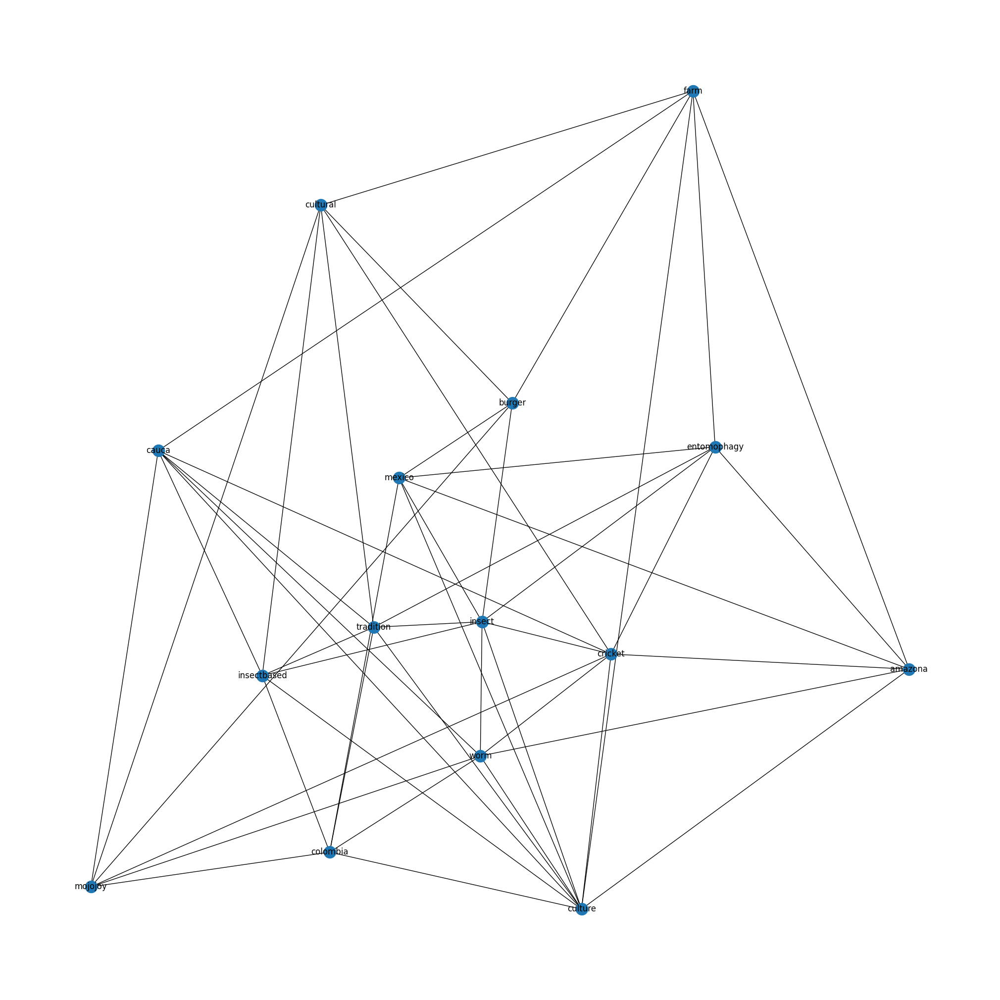

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.4:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['food','personally','enjoy','someone','although','open','notion','reminder','rooted','long','heard','always','probably','considered','prompt','mind','recognize','recognizing','reflect','region','particularly','important','benefit','appreciate','diverse','based','shared','story','approach','grew','leading','distinct','else','imperative','empathy','hygienic','history','encourages','fried','essential','fish','fly','heart','learned','acknowledge','population','likely','maintain','willing','welfare','vast','various','truth','toward','survival','sure','share','shaped','serf','scarce','safety','result','respectable','resourcefulness','resilience','reminded','prime','preconceived','develop','palatable','nourish','nothing','must','disgust','zone','admiration','chance','conclusion','crucial','attitude','affect','courage','compared','continues','celebrate','profoundly','bite','challenging','pushing','rapid','rapidly','reality','realizing','biting','receives','relativism','relative','bug','reconsidering','reevaluate','cherished','reevaluating','broaden','remain','regarded','book','regular','reject','prioritized','deemed','presented','overcome','normalcy','notable','colored','nourishes','nourishment','number','observe','obtaining','offlimits','climate','openminded','outlook','overlooking','prepared','claim','paramount','partake','circumstance','path','chosen','picture','piqued','choosing','positive','possibility','repulsive','preconception','reminding','bigger','argument','apprehension','surviving','task','teach','territory','theme','thrive','appears','allows','align','transcending','unexpected','unimaginable','universally','unsettling','varied','adventurer','vary','admit','ventured','wallet','adaptability','wellcooked','wholeheartedly','adapt','window','withhold','worldview','worldwide','surprisingly','support','resonate','suitable','newfound','bias','respectful','best','reveals','being','routine','safe','safely','behavior','sample','became','science','beauty','awaits','attention','shrimp','social','aspire','sound','squeamish','squeamishness','stark','started','step','aside','strain','striving','struck','next','navigate','negatively','enjoying','enthusiasm','entirely','criticism','crab','ethical','everexpanding','evident','evolving','exchange','experiencing','experimenting','exploring','expressing','extend','eyeopening','farmed','fascination','feeling','fiction','finding','fluid','costeffective','convince','force','foreign','frequent','fresh','enjoys','criticize','frontier','critique','defines','delightful','delved','dense','depletion','description','despite','deem','differ','decline','disgusting','decent','dare','cultivation','dramatically','easier','cultivate','efficiency','efficient','elicit','elsewhere','embraced','emerges','crossed','emphasize','contrast','full','navigating','inherent','confess','inspired','interaction','intertwined','intrigued','introduced','judgment','large','completely','lifestyle','compelling','logic','logical','comparing','malleable','marked','marvel','mechanism','merely','microcosm','compare','mixed','modern','movie','comfortable','muster','mustered','narrative','deeper','inherently','ingenuity','gaining','informs','garnered','genuinely','globalization','globalized','grasshopper','hamburger','continue','contemplating','constantly','highlighting','highly','considers','honestly','honoring','horizon','humbling','humility','hygiene','consciously','ignored','act','immense','connecting','confront','impose','including','incorporate','increasing','increasingly','immed','curiosity','nutrition','gastronomy','gastronomic','footprint','familiarity','relationship','related','regional','recognition','deeply','deal','realm','realize','hear','reaction','rational','rather','discovery','posed','everyday','portal','outsider','ordinary','embodiment','embody','onto','encounter','offense','occurs','engendering','nutritious','enlightening','enticing','novel','nostalgia','normalization','everevolving','overarching','place','point','pof','pleasantly','disposition','distinction','distinguish','planet','divide','eccentricity','driven','dynamic','eagerly','perceive','ease','passed','particular','ability','focus','le','landscape','foster','found','foundation','judge','journey','framed','free','located','farming','lower','mentioned','name','mutual','multifaceted','much','evolve','mirror','exemplifies','memory','fair','meateater','expansion','meal','express','matures','factor','maintaining','it','intriguingly','nature','intriguing','globe','inclination','going','importance','implication','grand','grapple','greater','grou','group','growing','hold','guided','handle','hesitation','head','healthier','given','indeed','influenced','integrating','intricately','intricacy','interwoven','intertwines','intersection','intergenerational','fusion','integrated','integral','acceptability','insecteating','futureoriented','futuristic','natural','need','reminiscent','discussion','delectable','delicacy','pwith','delicate','delve','desire','propels','determining','production','development','dialogue','dichotomy','difference','dinner','pragmatic','discourse','powerful','quirk','defy','range','daunting','remind','remains','relish','earth','contain','eaten','determines','bible','dessert','beyond','fulfill','appear','appeal','conventional','behind','exact','becoming','extends','fact','choose','back','exposure','familiar','challenge','coast','certainly','dislike','fiber','fine','comfort','functionality','baptist','amount','grown','adventure','crazy','daily','creature','greatest','bucaramanga','adding','agree','grows','emerge','embracing','element','embrace','accessible','ethos','affecting','boundary','debate','cooking','give','especially','getting','boyacá','cooky','couple','bridge','broader','change','center','celebration','cater','stood','capturing','stuff','spirit','steward','stretch','stand','carry','heat','complexity','changing','responsibility','security','scarcity','core','rollercoaster','country','rise','rich','response','seemingly','cringe','resonates','resistance','reservation','requires','repulsion','repugnant','conviction','converge','chowing','concept','solution','clarification','societal','snack','coming','commonplace','surprise','significantly','contribute','significant','connect','showcase','shot','connection','continuity','sentiment','supplanting','text','surprised','viewing','amazing','amid','viable','venturing','venture','varying','ancestral','valuable','unraveling','appeared','unknown','appetizing','appreciated','understanding','appreciation','allowing','viewpoint','captivating','aligns','yeah','acknowledging','wrap','adapting','wonder','without','address','winwin','willingness','wild','wield','affinity','agricultural','akin','alien','underscoring','underlying','underline','underlies','tied','thrives','threat','better','thinking','bewildering','testament','test','tends','board','table','sustenance','become','bat','touching','around','unconventional','uncharted','unappealing','ultimately','architect','arises','array','towards','translation','transformation','transform','associated','aversion','awareness','realization','render','invite','livestock','feel','level','lesson','flavor','learning','like','might','certain','dont','eating','people','consumption','thing','think','find','understand','different','strange','ant','something','part','culinary','love','taste','peanut','consume','good','would','others','santander','normal','belief','know','even','believe','preference','whether','impact','play','bottomed','big','role','pantry','beef','context','pork','interesting','depends','aspect','well','alternative','dietary','upbringing','society','maybe','consumed','unpleasant','individual','considering','humanity','experience','often','consuming','come','future','many','make','chicken','content','norm','world','topic','diet','type','cuisine','opportunity','personal','process','community','shape','custom','offer','went','crop','seem','could','area','spicy','background','animal','becomes','tapestry','still','exploration','another','childhood','choice','issue','kore','example','beneficial','unusual','lead','influence','tried','guess','habit','high','japanese','generation','rare','perspective','access','life','trait','provide','bag','problem','developed','source','resource','child','variety','environment','used','explore','similar','meat','common','potato','every','option','bought','never','everyone','chinese','pivotal','imagine','distinctive','great','dish','known','grow','perception','however','easily','form','exposed','lack','global','hinge','look','fascinating','palate','lens','instance','consideration','right','stomach','also','seems','seen','sense','video','shaping','though','resort','consider','specific','specie','unique','assimilate','concern','chunchullo','trying','respect','within','prospect','help','practice','surrounding','balanced','way','across','additionally','take','time','acceptable','depending','intricate','last','interplay','thought','traced','three','totally','john','tolerate','trend','potential','underscore','initially','year','hesitant','wrong','whole','welcome','honey','watch','husband','idea','identity','visited','view','impossible','vicente','incorporated','value','unfamiliar','information','ingrained','inconvenience','matter','terrified','okay','openness','seeing','salted','replacing','replace','regarding','peculiar','reason','really','person','raised','question','quantity','purpose','plate','property','promising','pleasant','product','prejudice','obtain','nuanced','term','shocking','limited','taught','locust','tasty','made','study','mean','stem','special','socorro','mostly','myriad','smaller','small','skin','skeptical','since','normalize','significance','relativity','young','anything','frequently','early','betulia','evoke','appropriate','lauded','gamechanger','insecteating','gungho','guy','innate','initiative','ingredient','indulge','hard','hel','hidden','increasingly','incorporating','highlight','highly','includes','impressive','important','honest','image','illness','grounded','grew','gastronomic','great','larger','largebottomed','gathered','general','generally','getting','kind','kicker','japanese','invaluable','intrinsic','go','intricate','goody','interplay','interesting','interest','integration','integral','expert','nourishing','remedy','delve','deal','debate','deep','deeply','deeprooted','delf','progress','program','delicacy','prized','nourishment','prevalent','prevalence','pretty','delving','depicting','dining','dinner','discovered','pot','punch','daredevil','daily','custom','cool','corner','count','cousin','regular','reflecting','refer','recognize','crossed','crucially','crunch','really','honesty','rarely','rare','range','raising','radical','quirky','distant','distinctive','plethora','overview','endures','outstanding','others','engagement','onto','enhance','onecountry','enthusiasm','offputting','enturous','oddity','occur','everevolving','every','everything','nutrientdense','exceed','exhaustive','novel','overcome','emphasize','disturbing','palatable','plate','drawback','piqued','piece','phenomenon','drink','driving','personally','drop','persist','edible','pbalance','educated','past','efficient','either','elucidation','partaking','embraced','abundance','requires','reserved','somewhat','matter','someone','mentioned','menu','snack','sixlegged','positive','mind','showing','mounting','munching','security','scoop','science','rooted','right','notion','richness','nourished','resilient','numerous','horizon','delight','eater','free','anything','animal','frontier','exploration','call','gain','amount','glimpse','allure','gather','alive','become','case','giving','beef','foster','depth','arabi','bar','fatty','diversity','aversion','feed','family','fewer','finding','central','associated','carry','dismissed','asia','foodrelated','footprint','change','discovering','chef','climate','give','closer','curiosity','globe','habit','half','beverage','hesitation','consider','higher','creative','energy','boast','history','entrepreneur','access','acceptance','cooked','crunchy','everyday','conclusion','beneficial','africa','comparable','broaden','compared','compelling','component','grapple','fare','evolving','bugeating','squirm','societal','super','stand','brimming','buffet','stem','spicing','bottomed','substantial','solid','strange','specifically','captivating','captivate','captivatingly','south','something','summary','share','categorized','revealing','commonly','said','rudimentary','composition','comprehensive','confess','confined','reunion','common','resources','connection','context','resembles','continues','require','contributor','savor','claiming','smattering','shot','cent','sink','challenging','significant','side','showcasing','show','support','chowing','serving','cherished','seriously','chest','choice','seek','chow','boost','thought','bonanza','usual','adventure','affirm','warrant','want','vivid','vital','viewed','ailment','viable','veritable','alcoholic','ventured','veil','varying','americ','varies','analysis','and','advantage','address','weave','acquainted','yeah','would','worldwide','accustomed','wood','wonderful','wild','acknowledge','actually','additionally','add','wellversed','added','wellinformed','welldocumented','wellbeing','wellbalanced','adding','usually','appeal','bodybuilder','uninformed','toss','barrier','basic','time','throughout','three','remove','beckons','therefore','texture','testament','behind','beloved','tapestry','talking','talk','tale','table','big','totally','balanced','balance','type','unfamiliarity','undoubtedly','understand','underscoring','area','uncover','array','typically','assistance','aware','truly','trove','tried','astounding','attention','available','transition','transcended','renowned','rather','reminder','long','meet','flavor','meanwhile','folk','fondly','force','foreign','forget','longstanding','local','expect','loaded','form','linked','lineup','frequently','lift','less','legit','least','firmly','feeling','feature','feast','noting','noteworthy','expertise','notably','notable','normal','nonetheless','express','negative','extend','neck','extension','familiarity','mysterious','fan','munch','fantastic','modest','furthermore','food','like','source','might','know','even','knowledge','often','content','rich','region','world','offer','various','creature','essential','diet','consumed','acid','part','dont','people','meat','heard','traditional','limited','amino','resource','consume','contribute','example','tiny','aspect','idea','valuable','flour','production','practice','conventional','certain','come','concern','however','country','addressing','especially','insight','challenge','hold','experience','good','santander','fact','scarcity','farming','much','seem','also','consuming','embracing','deficiency','realm','provide','alleviate','global','high','addition','could','tequila','level','fried','specific','nutritious','adventurous','particularly','nutrition','different','concept','cuisine','indeed','curious','acting','novelty','including','america','considered','quality','avenue','subject','little','supplement','dietary','unconventional','tribe','term','learn','future','beetle','thing','think','latin','diverse','topic','larva','posse','include','eager','staple','profile','community','eating','nature','clay','make','value','grasshopper','single','many','unique','particular','place','play','incorporate','education','norm','overall','natural','landscape','gastronomy','known','gluten','found','livestock','making','intriguing','find','mere','dish','must','factor','option','need','never','exploring','explore','lack','note','excellent','innovative','evident','information','hesitate','incredibly','feel','human','significance','scientifically','relationship','remarkable','continue','understanding','contain','reveals','roasted','role','clear','verified','chinese','seems','seen','serve','chapulines','significantly','believe','take','beyond','sustenance','regarding','container','well','purpose','powerhouse','widespread','pressing','widely','across','probably','promise','whether','bug','crucial','way','touted','wide','wary','used','though','lead','initial','territory','variety','water','vary','impact','system','worth','sure','stop','step','look','looking','interested','toward','traction','knowing','underestimated','made','wealth','abundantly','uncharted','indi','jungle','twist','turning','land','unusual','weird','indepth','treasure','venturing','translation','wellrounded','intricacy','video','potentially','spectrum','participant','replace','relatively','related','reduced','reassuring','online','opportunity','rearing','pack','read','reach','purposes','sound','providing','pasta','promising','perception','personal','pest','pressure','planet','pound','popular','represent','quite','ground','easy','breed','packed','taken','sausage','exotic','adaptation','coloring','cochinilla','interestingly','demand','dedicated','interconnectedness','crispy','project','assortment','creativity','deny','sight','connoisseur','one','skewer','enthusiast','shortage','shift','selling','ancient','conversation','stick','gourmet','calcium','baked','symbolize','perfection','closing','necessity','turn','admire','powdered','perhaps','reducing','regard','regulatory','pin','remarkably','worked','redefine','reshape','passion','resourceefficient','pinpoint','power','pique','push','produce','profound','potency','responsible','projected','post','popularly','wondered','popping','prominent','witness','proteinpacked','pondering','played','precise','weight','wisdom','uncanny','ripple','store','straight','summon','superheroes','supermarket','untapped','underwent','surface','surge','sushi','undeniably','symbol','tantalize','technical','tell','tempted','terrain','thriving','tourist','undeniable','transformed','treat','vegan','stewardship','rumor','vegetable','rushing','savored','scale','scratched','served','turned','simple','size','skewered','snippet','sold','space','spark','vibrant','speaking','spice','stage','stagnant','stall','versatility','sparked','accompany','offering','contemplate','caused','century','chomping','chowdowns','circle','class','closely','compound','condiment','constitutes','crispyfried','nutty','crossroad','cultivating','day','digging','dimension','drawn','earthy','effect','emerged','encountered','catching','care','captured','bugeater','adhering','adjustment','advocate','agent','alike','among','anecdote','anyone','arose','astonishing','audacity','avoid','away','ballgame','believed','belonging','bigbottomed','bioactive','blend','brave','brim','bring','bud','endlessly','enjoyed','enough','inevitably','insectderived','insectinfused','intake','intensive','intrigue','introspection','jampacked','keep','knowledgeable','line','acutely','medicinal','medium','meeting','mental','minilivestock','modernity','moment','momentum','movement','nittygritty','nuance','nutritionally','ingenious','industry','enterprising','indulging','environmental','ethic','ever','exactly','except','exciting','exist','existence','exploitation','famous','fancy','floating','follow','friendly','fueled','grain','grasp','healing','heritage','hurdle','mark','harmful','researcher','resourceintensive','powder',
'restaurant','slowly','colombi','experiment','browncolored','presence','frying','largely','looked','recognized','promote','wellknown','terrible','prepare','processed','market','maní','puerto','culturally','remember','grape','remote','sell','eastern','strong','pasto','primarily','plain','accepted','changed','appearance','breaking','shine','shadow','impression','sent','industrial','colony','judging','lasting','later','left','leguizamo','sena','appetite','select','mainstream','highend','mention','method','recently','salt','mother','near','niche','restricted','opinion','pas','called','brightest','school','pale','sorry','thick','work','visually','equally','unexplored','sporadic','extensive','favorite','felt','first','forefront','costly','blood','happens','appealing','comparison','star','television','reference','asís','resistant','serious','welldeveloped','reputation','replaced','additional','blessed','wider','applied','acquired','reluctance','regulating','regulate','beginning','almost','uniqueness','thank','taking','aguazul','sector','season','along','blessing','salting','tree','stronghold','route','underrated','roasting','roast','revolution','cropping','protein','fullyfledged','hesitated','helping','haute','hailing','guaviare','grilling','grilled','grandma','goto','generates','generated','convincing','iceberg','fond','face','exists','evolves','elicits','creep','earlier','distribute','definitely','dash','hint','incredible','promotion','omit','promoting','border','pride','presentation','popularity','brown','persists','cusp','order','opening','nope','indulges','nevertheless','municipality','monserrate','mistaken','mask','centered','cesar','majority','mainly','achieving','lingering','yopal','chiza','chocó','department','commerce','scene','fastfood','referred','centralized','raise','north','apart','hotspot','plump','exported','grillos','festival','spanish','insectthemed','biological','layer','caught','chain','classification','city','occasional','night','nonconsumer','public','prompted','prominence','received','possibly','occurrence','please','party','passage','perform','personality','pizza','ready','rock','recipe','suggests','whisper','waiting','wait','variation','underground','ugly','trade','touch','suppose','summarize','signify','regularly','set','secret','salsa','safari','rockstars','nation','rite','revolves','reside','remaining','rely','network','insectlike','music','moreover','emergence','elude','diversifying','diversification','difficult','dicen','deserve','dared','critter','concrete','concert','antroasting','club','close','cinema','chip','capital','cangrejo','candidate','bugbased','beautiful','backdrop','exclusive','explored','explorer','inclusion','mexic','location','label','kinda','keen','join','investigate','instead','attend','indicating','import','export','humorously','host','home','headliner','gem','friend','foremost','farmtotable','farmfresh','exporting','alone','colombian']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:15]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p6n = p6noncons.apply(clean_text)
network6n = create_red(p6n, 'network6n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network6n)
dfx

,Node,Total Co-occurrence Frequency
9,insect,2809
14,worm,1204
13,tradition,957
3,colombia,646
1,burger,536
4,cricket,504
10,insectbased,450
11,mexico,344
7,entomophagy,243
6,culture,240


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:
#plt.title('Question 6: Knowledge about insect-based food consumption in the colombian territory - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P6.png', dpi=300, bbox_inches='tight')
#plt.show()

In [ ]:
#print("p6c:", p6c.nodes())
#print("p6n:", p6n.nodes())


#P7- CHILDHOOD EXPERIENCES WITH PREFERRED FOODS

In [ ]:
p7cons= compared['P40- CHILDHOOD EXPERIENCES WITH PREFERRED FOODS-CONS'].astype(str)
p7noncons= compared['P40- CHILDHOOD EXPERIENCES WITH PREFERRED FOODS-NONCONS'].astype(str)

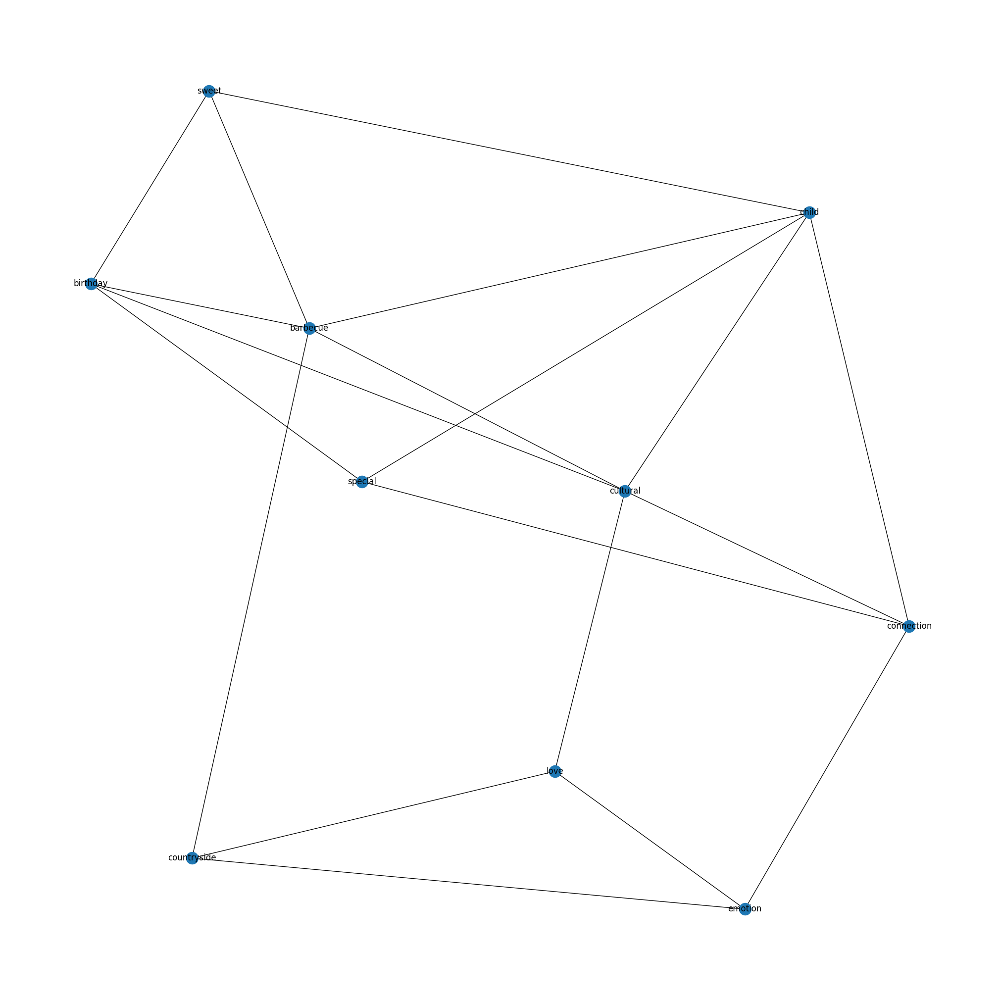

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.4:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['ritual','sick','sweetness','teaching','thrill','happiness','testament','reward','relationship','identity','traditional','home','delicious','cream','tinajo','tender','tell','technique','togetherness','token','told','tableau','took','symposium','symphony','symbolic','touch','towards','trying','showcase','sharing','upon','right','rich','usually','utilitari','variety','revolve','reveals','rested','rest','resilience','reservoir','reserved','repository','reminding','remind','vivid','remain','rock','universality','unique','sense','turn','turned','shaped','unadulterated','shape','serve','sentimentality','undercurrent','seemingly','root','seemed','seasoning','sculpts','scarcity','satisfies','santander','unfamiliar','unifying','academic','joyous','passed','cooking','dance','current','curd','crystallize','crunch','creates','creamy','creambased','craved','coveted','cornerstone','contributed','dedication','contribute','contrary','continuity','context','constant','compass','companion','communion','communal','common','commemorate','danced','defined','comfort','eclipse','entity','ensuring','enriched','enjoyed','enjoyable','encounter','encapsulated','emphasize','emblematic','embedded','elaborate','eater','depends','earliest','drawn','dough','diverse','distaste','dislike','discern','dimension','difficulty','devoted','dessert','comforting','combination','particularly','armadillo','belonging','bell','believe','becoming','baked','backdrop','aversion','attribute','associated','associate','asked','appreciation','besides','appearance','anticipation','anchored','amplifies','amalgamation','adult','adorned','additional','activity','across','accompanied','beloved','better','color','bucaramanga','closely','clarified','chunky','choose','cheese','chapter','channel','challenge','cared','capacity','canvas','brushstrokes','bind','brushstroke','brought','brings','brimming','box','bountiful','boundless','boundary','bonding','boggy','body','entwined','essence','everyday','isolated','lettuce','learning','le','layer','larger','landscape','lady','know','knit','jubilation','access','interwoven','linked','internalize','instead','instance','insight','innocence','inner','infuse','infrequency','informed','indulgence','indelible','liking','lived','everything','moist','particular','partaking','palate','ordinary','opportunity','offering','occasion','nourish','notion','none','molding','milk','local','metamorphose','mere','melting','medium','meaning','mattered','malleability','making','lunch','look','locale','imprinted','important','impact','filling','fresh','frequently','frequency','found','forward','forged','forge','force','fluffy','fleeting','first','festivity','imbues','featured','fascinating','farm','exuberance','expressed','exploration','exchanged','evolves','evolve','evoke','evident','fruit','furthermore','fusion','generation','illustrate','idea','hunger','humble','hue','house','homemade','hold','heightened','healthy','hard','hamburger','gustatory','guiding','growth','grow','graced','go','gettogether','getting','get','gesture','geographical','youth','food','like','experience','rice','taste','dish','also','meat','made','would','always','meal','flavor','used','something','cake','even','shared','soup','culinary','prepared','liked','familial','really','becomes','time','year','type','often','dont','story','certain','pasta','think','interplay','journey','life','preference','within','example','enjoy','delight','cherished','tapestry','culture','complexity','affection','woven','thing','moment','gathering','vegetable','gallina','became','become','good','recollection','sancocho','favorite','roasted','cooky','narrative','friend','ingredient','physical','savored','one','personal','paint','day','sustenance','foster','mirror','past','pollo','many','stood','eaten','started','embodiment','preferred','influence','profound','kind','every','young','world','together','chicken','vessel','consumed','arroz','threemilk','carry','learned','form','weekend','shaping','underscore','fondness','well','formative','fish','served','felt','prepare','thread','fabric','around','bud','bridge','long','whether','care','significance','white','make','simplest','appreciate','unexpected','rooted','laughter','pudding','remember','hunted','hunt','banana','history','rarity','resonance','resonate','response','guava','growing','grew','grateful','bite','intimate','bond','give','intricate','cook','gelatin','gave','back','gastronomic','especially','said','matter','loved','plain','achievement','mosaic','deeply','early','mother','transcends','much','taught','tradition','sunday','tasty','surroundings','town','wonder','discovery','wild','daily','different','developed','peto','take','nourishment','table','novelty','commonly','conduit','conclusion','adulthood','consumption','treat','animal','apart','continue','celebration','embrace','emerges','anecdote','plate','economic','papaya','plantain','echo','eating','rabbit','regular','quite','reflecting','wanted','warmth','people','perhaps','pepper','wrapped','raised','peppered','reflect','perception','warm','rarely','recognize','rare','power','quick','week','potato','practical','practice','portal','pon','willingness','predilection','related','poignant','prefer','pleasure','preparation','whatever','went','without','wellrounded','preparing','property','protein','provides','pureed','purpose','putumayo','pizza','pin','pvery','pwith','regularly','ripe','voyage','transformed','transmission','staple','stand','squirrel','transporting','spinach','spent','travel','traveled','soul','sou','solution','solely','social','tropical','soaked','small','simple','similar','stem','still','relished','transcend','though','three']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p7c = p7cons.apply(clean_text)
network7 = create_red(p7c, 'network7')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network7)
dfx

,Node,Total Co-occurrence Frequency
1,birthday,156
5,cultural,144
7,love,136
6,emotion,119
3,connection,110
9,sweet,110
8,special,91
0,barbecue,84
4,countryside,72
2,child,62


In [ ]:
# Texto proporcionado
texto = """
24	ritual	87
25	sick	87
28	sweetness	87
29	teaching	87
32	thrill	87
15	happiness	286
30	testament	596
23	reward	596
21	relationship	596
17	identity	596
33	traditional	596
16	home	596
8	delicious	740
6	cream	740
"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'ritual','sick','sweetness','teaching','thrill','happiness','testament','reward','relationship','identity','traditional','home','delicious','cream'


#7N

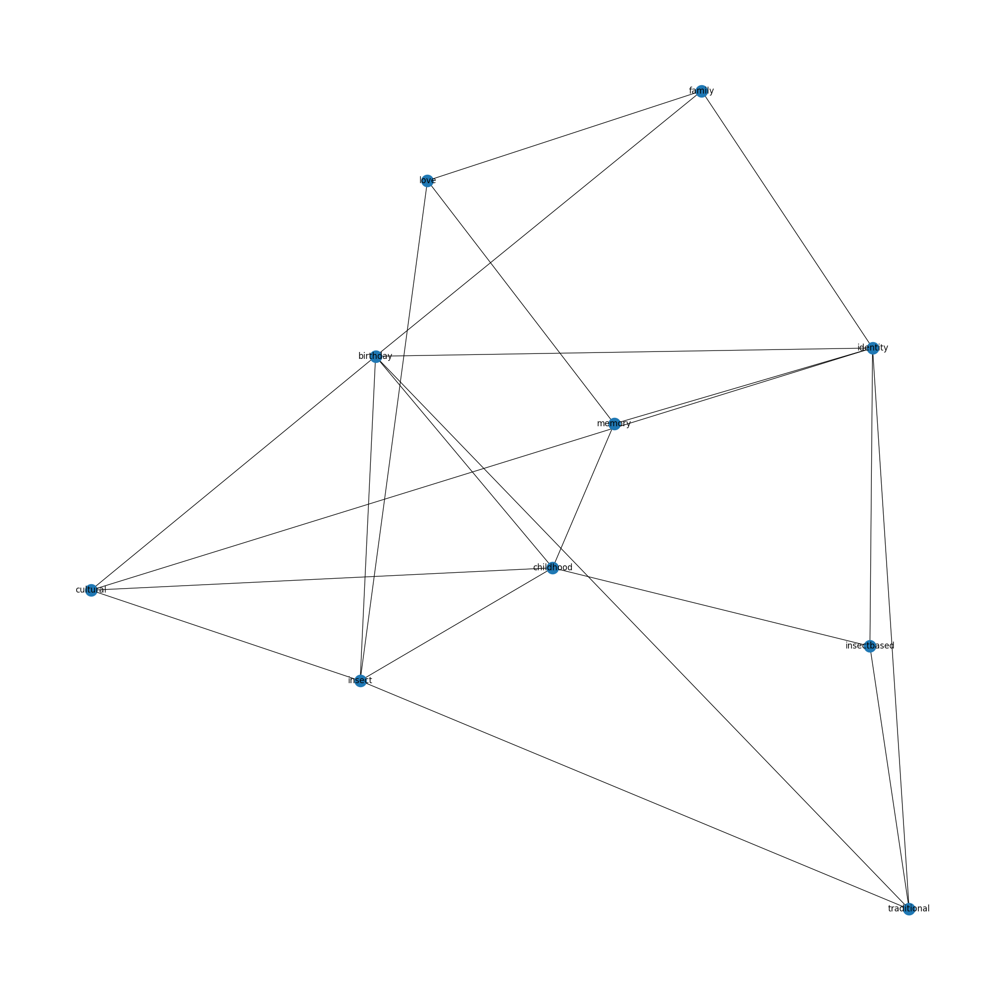

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.4:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['interconnectedness','emotional','contemplate','land','instills','constantly','consisted','intertwine','intertwined','intertwining','intriguingly','juxtaposition','labor','laden','yucca','reward','chocolate','special','tale','bean','mango','connection','since','present','paisa','little','child','specific','dietary','unconventional','bandeja','allure','adaptation','nonconsumer','enjoying','delicacy','choice','cream','freshly','cooked','link','conversation','influenced','option','sticker','similarly','arepas','aroma','today','impression','illuminate','theme','guide','groundwork','parent','fantastic','fallen','exploring','tuna','unfold','whole','diet','fond','sometimes','positive','smooth','possibility','ongoing','novel','produced','never','nature','realm','received','mainly','recipe','recurring','linking','saturday','intersection','integrating','delicious','able','cuajada','bring','avocado','create','concept','consuming','creating','ajiaco','barbecue','chef','corn','cornbased','chocolatinas','chicharrón','satisfying','capsule','receiving','came','scent','cafam','reflects','relationship','remains','reliance','sancochos','reminiscent','repertoire','reveal','brush','ritual','rolled','rural','recall','define','cast','potentially','painted','part','pea','permeated','pick','picture','pinpoint','point','cheesy','characterized','potency','potential','poured','rather','powerful','precious','change','presentday','pretty','chance','product','profile','proteinrich','provide','question','sent','sensory','several','serf','serving','arequipe','thought','throughout','tie','anything','topping','touchstone','traced','anchor','tree','almost','ultimately','uncharted','uncover','affinity','various','veggie','vein','venture','weave','whenever','window','winner','aromatic','testament','tendril','sound','setting','show','sibling','silky','bounty','born','sister','smelled','based','soothing','source','tangible','speaks','baker','badge','spell','spot','steadfast','stomach','strongly','available','symbolizing','association','outing','nowadays','openness','coladas','extends','familiar','crop','feel','feeling','fell','find','fixed','fluid','forming','framed','framework','countryside','funny','future','game','genesis','goodness','grilled','count','cornbread','hanging','hardly','heart','cue','explore','experienced','delve','dialogue','deeprooted','deeper','differ','driven','dynamic','earlier','effort','element','dairy','emphasizing','exotic','encapsulate','curiosity','enshrining','enticing','environment','envueltos','etched','everevolving','everpresent','evolution','evolving','heritage','highlight','histori','motif','connected','conjures','locally','conjure','lunchbox','mainstream','complex','maybe','melgar','completely','might','come','lifelong','navigate','need','needed','collective','collecting','norm','normal','nostalgia','collected','delightful','okay','connoisseur','leading','home','ingrained','honest','honor','however','hug','hunting','illustrating','importance','cool','incorporate','continues','infuses','tinajo','tender','tell','technique','togetherness','token','told','tableau','took','symposium','symphony','symbolic','touch','towards','trying','showcase','sharing','upon','right','rich','usually','utilitari','variety','revolve','reveals','rested','rest','resilience','reservoir','reserved','repository','reminding','remind','vivid','remain','rock','universality','unique','sense','turn','turned','shaped','unadulterated','shape','serve','sentimentality','undercurrent','seemingly','root','seemed','seasoning','sculpts','scarcity','satisfies','santander','unfamiliar','unifying','academic','joyous','passed','cooking','dance','current','curd','crystallize','crunch','creates','creamy','creambased','craved','coveted','cornerstone','contributed','dedication','contribute','contrary','continuity','context','constant','compass','companion','communion','communal','common','commemorate','danced','defined','comfort','eclipse','entity','ensuring','enriched','enjoyed','enjoyable','encounter','encapsulated','emphasize','emblematic','embedded','elaborate','eater','depends','earliest','drawn','dough','diverse','distaste','dislike','discern','dimension','difficulty','devoted','dessert','comforting','combination','particularly','armadillo','belonging','bell','believe','becoming','baked','backdrop','aversion','attribute','associated','associate','asked','appreciation','besides','appearance','anticipation','anchored','amplifies','amalgamation','adult','adorned','additional','activity','across','accompanied','beloved','better','color','bucaramanga','closely','clarified','chunky','choose','cheese','chapter','channel','challenge','cared','capacity','canvas','brushstrokes','bind','brushstroke','brought','brings','brimming','box','bountiful','boundless','boundary','bonding','boggy','body','entwined','essence','everyday','isolated','lettuce','learning','le','layer','larger','landscape','lady','know','knit','jubilation','access','interwoven','linked','internalize','instead','instance','insight','innocence','inner','infuse','infrequency','informed','indulgence','indelible','liking','lived','everything','moist','particular','partaking','palate','ordinary','opportunity','offering','occasion','nourish','notion','none','molding','milk','local','metamorphose','mere','melting','medium','meaning','mattered','malleability','making','lunch','look','locale','imprinted','important','impact','filling','fresh','frequently','frequency','found','forward','forged','forge','force','fluffy','fleeting','first','festivity','imbues','featured','fascinating','farm','exuberance','expressed','exploration','exchanged','evolves','evolve','evoke','evident','fruit','furthermore','fusion','generation','illustrate','idea','hunger','humble','hue','house','homemade','hold','heightened','healthy','hard','hamburger','gustatory','guiding','growth','grow','graced','go','gettogether','getting','get','gesture','geographical','youth','food','like','experience','rice','taste','dish','also','meat','made','would','always','meal','flavor','used','something','cake','even','shared','soup','culinary','prepared','liked','familial','really','becomes','time','year','type','often','dont','story','certain','pasta','think','interplay','journey','life','preference','within','example','enjoy','delight','cherished','tapestry','culture','complexity','affection','woven','thing','moment','gathering','vegetable','gallina','became','become','good','recollection','sancocho','favorite','roasted','cooky','narrative','friend','ingredient','physical','savored','one','personal','paint','day','sustenance','foster','mirror','past','pollo','many','stood','eaten','started','embodiment','preferred','influence','profound','kind','every','young','world','together','chicken','vessel','consumed','arroz','threemilk','carry','learned','form','weekend','shaping','underscore','fondness','well','formative','fish','served','felt','prepare','thread','fabric','around','bud','bridge','long','whether','care','significance','white','make','simplest','appreciate','unexpected','rooted','laughter','pudding','remember','hunted','hunt','banana','history','rarity','resonance','resonate','response','guava','growing','grew','grateful','bite','intimate','bond','give','intricate','cook','gelatin','gave','back','gastronomic','especially','said','matter','loved','plain','achievement','mosaic','deeply','early','mother','transcends','much','taught','tradition','sunday','tasty','surroundings','town','wonder','discovery','wild','daily','different','developed','peto','take','nourishment','table','novelty','commonly','conduit','conclusion','adulthood','consumption','treat','animal','apart','continue','celebration','embrace','emerges','anecdote','plate','economic','papaya','plantain','echo','eating','rabbit','regular','quite','reflecting','wanted','warmth','people','perhaps','pepper','wrapped','raised','peppered','reflect','perception','warm','rarely','recognize','rare','power','quick','week','potato','practical','practice','portal','pon','willingness','predilection','related','poignant','prefer','pleasure','preparation','whatever','went','without','wellrounded','preparing','property','protein','provides','pureed','purpose','putumayo','pizza','pin','pvery','pwith','regularly','ripe','voyage','transformed','transmission','staple','stand','squirrel','transporting','spinach','spent','travel','traveled','soul','sou','solution','solely','social','tropical','soaked','small','simple','similar','stem','still','relished','transcend','though','three']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p7n = p7noncons.apply(clean_text)
network7n = create_red(p7n, 'network7n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network7n)
dfx

,Node,Total Co-occurrence Frequency
1,childhood,936
8,memory,646
4,identity,270
6,insectbased,256
3,family,234
5,insect,228
7,love,215
0,birthday,177
2,cultural,114
9,traditional,66


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:
#print("p7c:", p7c.nodes())
#print("p7n:", p7n.nodes())

In [ ]:
#plt.title('Question 7: Childhood Experiences with Preferred Foods - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P7.png', dpi=300, bbox_inches='tight')
#plt.show()

#P8- CHILDHOOD EXPERIENCES WITH NON-PREFERRED FOODS

In [ ]:
p8cons= compared['P50- CHILDHOOD EXPERIENCES WITH NON-PREFERRED FOODS\n-CONS'].astype(str)
p8noncons= compared['P50- CHILDHOOD EXPERIENCES WITH NON-PREFERRED FOODS\n – NONCONS'].astype(str)

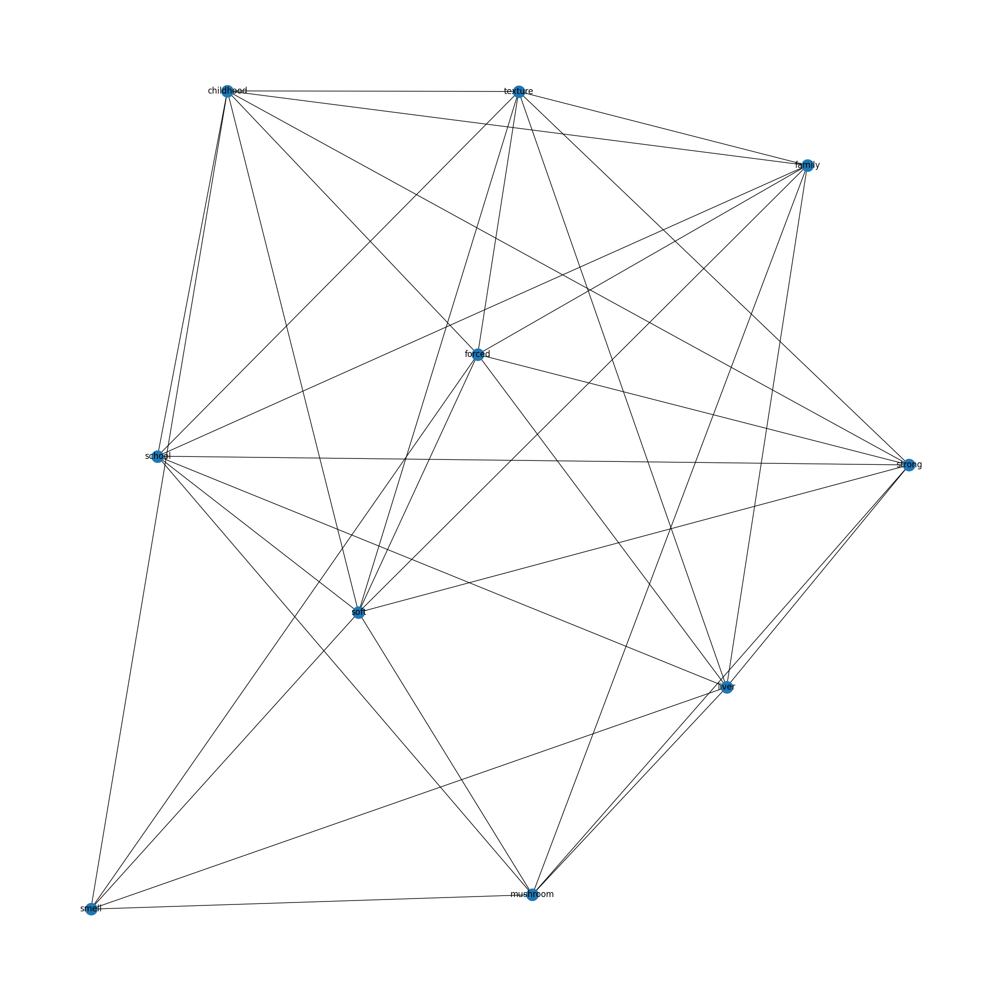

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.8:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['could','another','given','egg','problem','self','cabbage','despised','disliked','drink','matured','accept','repetitive','consume','help','okra','hide','juice','nemesis','left','limited','everyone','drinking','brussels','tried','anyone','tolerate','sprout','picky','peach','odds','piece','oncedespised','older','uninspiring','undertone','utterly','offputting','pile','overcome','nutritious','obligated','practically','merit','mind','minicabbages','muscle','worse','willingly','wellcooked','welcomed','napkin','way','newfound','ventured','normally','notice','pleasant','umami','precisely','strategically','resistance','result','revelation','richness','sauce','sautéed','seat','stubborn','secretly','stopped','side','simply','resembled','surprise','understand','reached','slyly','properly','pumpkin','typical','push','quickly','realized','terrible','realizing','reason','turnoff','reluctance','reluctantly','reminds','lasting','mashua','cringe','coaxing','cold','comprehend','consequence','consistency','convince','cosidos','cost','cuchuco','distribute','cultural','cundinamarca','cycle','decided','destined','develop','directly','discreetly','called','brother','boyacenses','bothered','adding','addition','agree','alone','amount','annoyed','anymore','appealing','appeared','appetizing','arrived','avoid','baffled','bane','beetroot','beneath','bland','distinct','doubt','insist','hardboiled','heat','herb','hope','hoping','huge','imported','issue','kiwi','actually','later','laugh','living','love','major','mamoncillo','happened','hand','green','grandmother','either','enough','everchanging','evolved','exciting','exhausted','existence','experiment','facility','fan','feed','fold','forever','fungi','garlic','gelatinous','gooey','younger','interconnectedness','contemplate','land','instills','constantly','consisted','intertwine','intertwined','intertwining','intriguingly','juxtaposition','labor','laden','yucca','reward','chocolate','special','tale','bean','mango','connection','since','present','paisa','little','child','specific','dietary','unconventional','bandeja','allure','adaptation','nonconsumer','enjoying','delicacy','choice','cream','freshly','cooked','link','conversation','influenced','option','sticker','similarly','arepas','aroma','today','impression','illuminate','theme','guide','groundwork','parent','fantastic','fallen','exploring','tuna','unfold','whole','diet','fond','sometimes','positive','smooth','possibility','ongoing','novel','produced','never','nature','realm','received','mainly','recipe','recurring','linking','saturday','intersection','integrating','delicious','able','cuajada','bring','avocado','create','concept','consuming','creating','ajiaco','barbecue','chef','corn','cornbased','chocolatinas','chicharrón','satisfying','capsule','receiving','came','scent','cafam','reflects','relationship','remains','reliance','sancochos','reminiscent','repertoire','reveal','brush','ritual','rolled','rural','recall','define','cast','potentially','painted','part','pea','permeated','pick','picture','pinpoint','point','cheesy','characterized','potency','potential','poured','rather','powerful','precious','change','presentday','pretty','chance','product','profile','proteinrich','provide','question','sent','sensory','several','serf','serving','arequipe','thought','throughout','tie','anything','topping','touchstone','traced','anchor','tree','almost','ultimately','uncharted','uncover','affinity','various','veggie','vein','venture','weave','whenever','window','winner','aromatic','testament','tendril','sound','setting','show','sibling','silky','bounty','born','sister','smelled','based','soothing','source','tangible','speaks','baker','badge','spell','spot','steadfast','stomach','strongly','available','symbolizing','association','outing','nowadays','openness','coladas','extends','familiar','crop','feel','feeling','fell','find','fixed','fluid','forming','framed','framework','countryside','funny','future','game','genesis','goodness','grilled','count','cornbread','hanging','hardly','heart','cue','explore','experienced','delve','dialogue','deeprooted','deeper','differ','driven','dynamic','earlier','effort','element','dairy','emphasizing','exotic','encapsulate','curiosity','enshrining','enticing','environment','envueltos','etched','everevolving','everpresent','evolution','evolving','heritage','highlight','histori','motif','connected','conjures','locally','conjure','lunchbox','mainstream','complex','maybe','melgar','completely','might','come','lifelong','navigate','need','needed','collective','collecting','norm','normal','nostalgia','collected','delightful','okay','connoisseur','leading','home','ingrained','honest','honor','however','hug','hunting','illustrating','importance','cool','incorporate','continues','infuses','tinajo','tender','tell','technique','togetherness','token','told','tableau','took','symposium','symphony','symbolic','touch','towards','trying','showcase','sharing','upon','right','rich','usually','utilitari','variety','revolve','reveals','rested','rest','resilience','reservoir','reserved','repository','reminding','remind','vivid','remain','rock','universality','unique','sense','turn','turned','shaped','unadulterated','shape','serve','sentimentality','undercurrent','seemingly','root','seemed','seasoning','sculpts','scarcity','satisfies','santander','unfamiliar','unifying','academic','joyous','passed','cooking','dance','current','curd','crystallize','crunch','creates','creamy','creambased','craved','coveted','cornerstone','contributed','dedication','contribute','contrary','continuity','context','constant','compass','companion','communion','communal','common','commemorate','danced','defined','comfort','eclipse','entity','ensuring','enriched','enjoyed','enjoyable','encounter','encapsulated','emphasize','emblematic','embedded','elaborate','eater','depends','earliest','drawn','dough','diverse','distaste','dislike','discern','dimension','difficulty','devoted','dessert','comforting','combination','particularly','armadillo','belonging','bell','believe','becoming','baked','backdrop','aversion','attribute','associated','associate','asked','appreciation','besides','appearance','anticipation','anchored','amplifies','amalgamation','adult','adorned','additional','activity','across','accompanied','beloved','better','color','bucaramanga','closely','clarified','chunky','choose','cheese','chapter','channel','challenge','cared','capacity','canvas','brushstrokes','bind','brushstroke','brought','brings','brimming','box','bountiful','boundless','boundary','bonding','boggy','body','entwined','essence','everyday','isolated','lettuce','learning','le','layer','larger','landscape','lady','know','knit','jubilation','access','interwoven','linked','internalize','instead','instance','insight','innocence','inner','infuse','infrequency','informed','indulgence','indelible','liking','lived','everything','moist','particular','partaking','palate','ordinary','opportunity','offering','occasion','nourish','notion','none','molding','milk','local','metamorphose','mere','melting','medium','meaning','mattered','malleability','making','lunch','look','locale','imprinted','important','impact','filling','fresh','frequently','frequency','found','forward','forged','forge','force','fluffy','fleeting','first','festivity','imbues','featured','fascinating','farm','exuberance','expressed','exploration','exchanged','evolves','evolve','evoke','evident','fruit','furthermore','fusion','generation','illustrate','idea','hunger','humble','hue','house','homemade','hold','heightened','healthy','hard','hamburger','gustatory','guiding','growth','grow','graced','go','gettogether','getting','get','gesture','geographical','youth','food','like','experience','rice','taste','dish','also','meat','made','would','always','meal','flavor','used','something','cake','even','shared','soup','culinary','prepared','liked','familial','really','becomes','time','year','type','often','dont','story','certain','pasta','think','interplay','journey','life','preference','within','example','enjoy','delight','cherished','tapestry','culture','complexity','affection','woven','thing','moment','gathering','vegetable','gallina','became','become','good','recollection','sancocho','favorite','roasted','cooky','narrative','friend','ingredient','physical','savored','one','personal','paint','day','sustenance','foster','mirror','past','pollo','many','stood','eaten','started','embodiment','preferred','influence','profound','kind','every','young','world','together','chicken','vessel','consumed','arroz','threemilk','carry','learned','form','weekend','shaping','underscore','fondness','well','formative','fish','served','felt','prepare','thread','fabric','around','bud','bridge','long','whether','care','significance','white','make','simplest','appreciate','unexpected','rooted','laughter','pudding','remember','hunted','hunt','banana','history','rarity','resonance','resonate','response','guava','growing','grew','grateful','bite','intimate','bond','give','intricate','cook','gelatin','gave','back','gastronomic','especially','said','matter','loved','plain','achievement','mosaic','deeply','early','mother','transcends','much','taught','tradition','sunday','tasty','surroundings','town','wonder','discovery','wild','daily','different','developed','peto','take','nourishment','table','novelty','commonly','conduit','conclusion','adulthood','consumption','treat','animal','apart','continue','celebration','embrace','emerges','anecdote','plate','economic','papaya','plantain','echo','eating','rabbit','regular','quite','reflecting','wanted','warmth','people','perhaps','pepper','wrapped','raised','peppered','reflect','perception','warm','rarely','recognize','rare','power','quick','week','potato','practical','practice','portal','pon','willingness','predilection','related','poignant','prefer','pleasure','preparation','whatever','went','without','wellrounded','preparing','property','protein','provides','pureed','purpose','putumayo','pizza','pin','pvery','pwith','regularly','ripe','voyage','transformed','transmission','staple','stand','squirrel','transporting','spinach','spent','travel','traveled','soul','sou','solution','solely','social','tropical','soaked','small','simple','similar','stem','still','relished','transcend','though','three']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p8c = p8cons.apply(clean_text)
network8 = create_red(p8c, 'network8')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network8)
dfx

,Node,Total Co-occurrence Frequency
2,forced,220
9,texture,162
4,mushroom,120
0,childhood,112
7,soft,111
3,liver,99
5,school,84
1,family,74
8,strong,74
6,smell,56


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

#8N

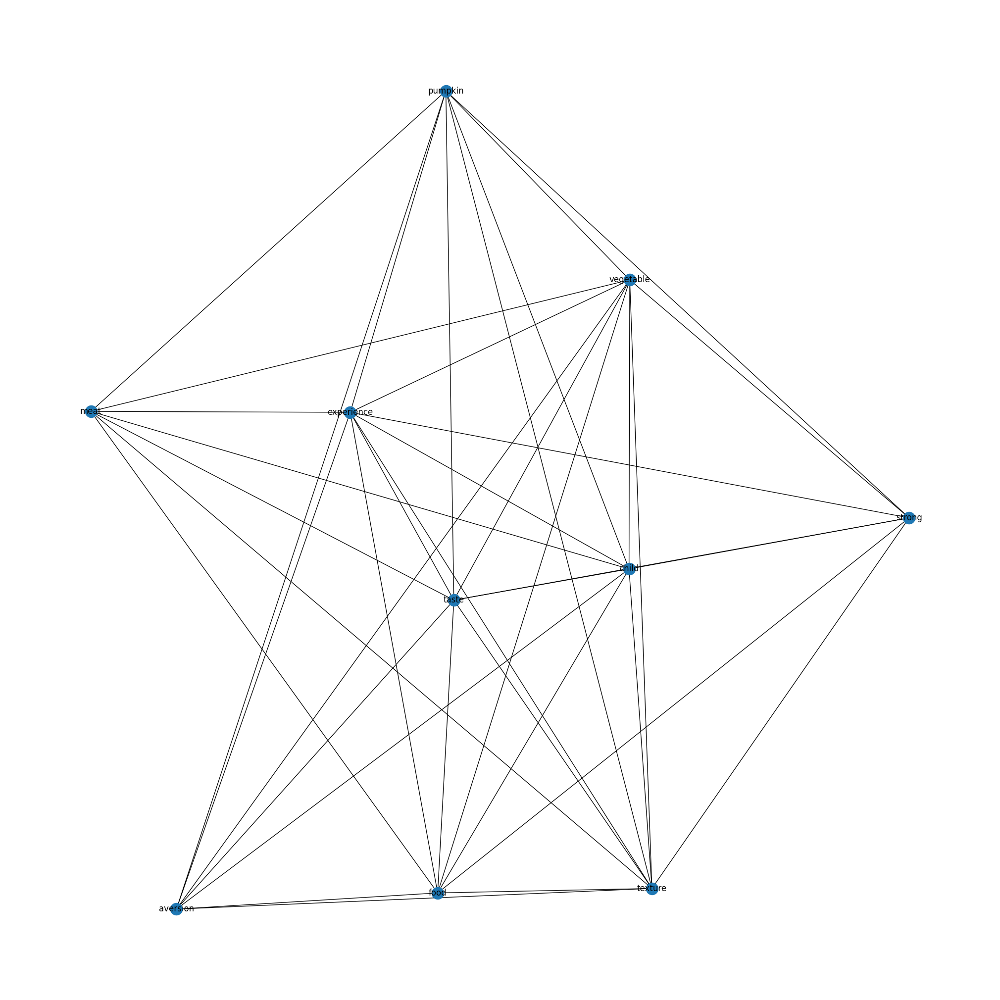

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.8:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['like','made','used','cabbage','still','avoid','dislike','dont','developed','certain','since','soup','never','enjoy','pregnant','mazorca','added','seasoning','sauce','repetition','pizza','ground','flavor','much','also','arracacha','time','although','nutritious','people','presence','prepare','wall','preferred','preference','possible','point','persists','perhaps','would','obligation','pea','pdessert','pvomiting','pasta','young','younger','particularly','pand','nutritional','older','pata','relative','reason','sick','started','stand','taken','sometimes','taught','someone','softboiled','thought','tiny','shrimplike','stick','tolerable','tomato','served','secretly','tried','unappealing','salcedo','unpleasant','removed','reminds','value','remember','similarly','acquire','nauseous','mother','consuming','cooked','corn','current','differently','distaste','eating','egg','ended','environment','especially','even','eventually','every','example','consumed','considered','bean','additionally','animal','appetizing','asked','associate','avoided','bought','chicken','broth','came','car','changua','chea','cherry','farm','first','foot','living','kid','knorr','learned','left','little','lived','long','jelly','maggi','mandarin','meal','meant','might','mistook','juice','insect','force','guatila','found','frequently','fundamental','gelatina','grew','habichuelas','initially','hamburger','hear','however','impression','included','influenced','yucca']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p8n = p8noncons.apply(clean_text)
network8n = create_red(p8n, 'network8n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network8n)
dfx

,Node,Total Co-occurrence Frequency
7,taste,196
3,food,135
1,child,124
2,experience,124
8,texture,96
9,vegetable,96
5,pumpkin,81
0,aversion,58
4,meat,58
6,strong,58


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:
#print("p8c:", p8c.nodes())
#print("p8n:", p8n.nodes())

In [ ]:
#plt.title('Question 8: Childhood experiences with disliked foods - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P9.png', dpi=300, bbox_inches='tight')
#plt.show()

#P9-RECENT EXPERIENCES WITH PREFERRED FOODS

In [ ]:
p9cons= compared['P41-RECENT EXPERIENCES WITH PREFERRED FOODS-CONS'].astype(str)
p9noncons= compared['P41-RECENT EXPERIENCES WITH PREFERRED FOODS-NONCONS'].astype(str)

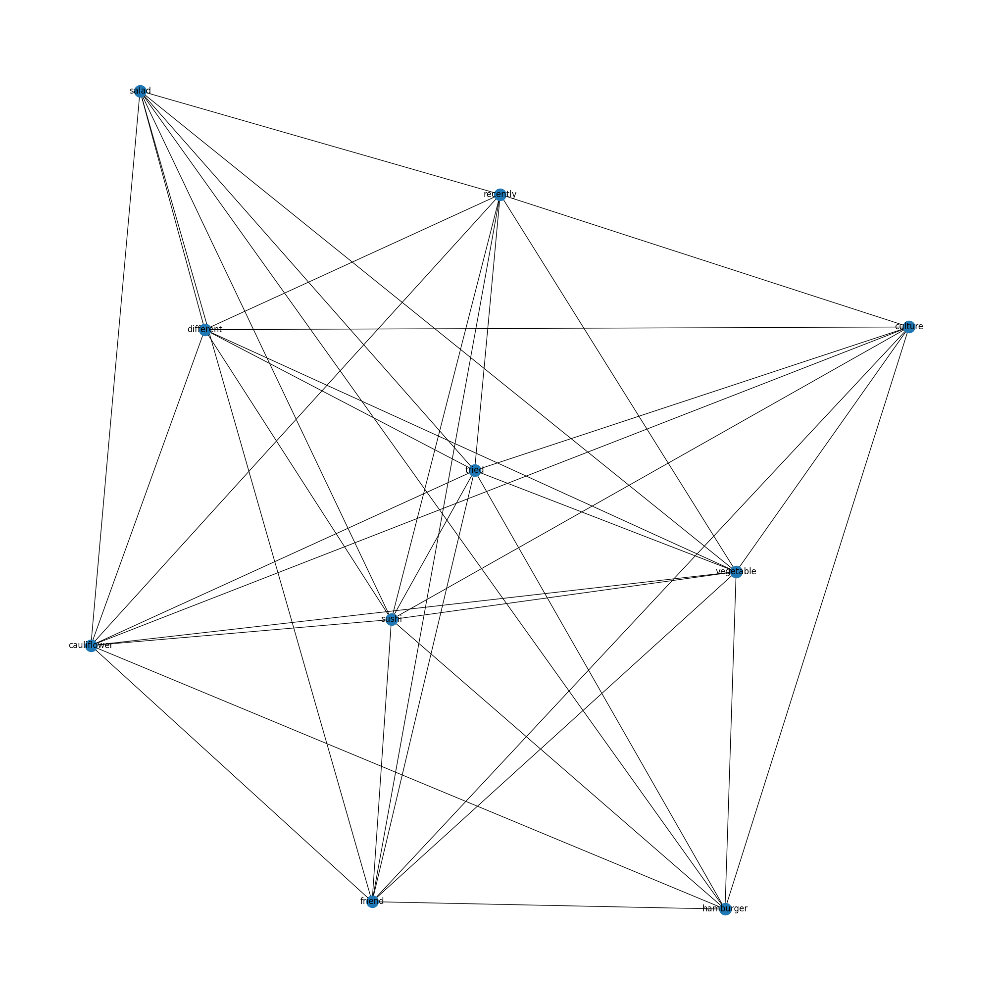

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.8:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['lifestyle','thing','food','like','differently','much','really','experience','started','dont','delicious','would','example','think','something','prepare','place','year','barley','liked','also','another','well','little','liking','diet','type','trying','small','moment','everything','impressed','many','particular','good','change','usually','cook','avocado','used','tomato','pepper','perception','nut','people','pea','trauma','pasta','trendy','pa','pistachio','order','tri','night','thanks','must','turkish','turn','milk','menu','mediumrare','typical','went','meal','maybe','within','never','pleasant','smelled','taste','soak','social','since','shrimp','setting','seems','sauce','love','russi','rice','restaurant','spinach','starting','representative','powdered','remember','regular','recipe','tasted','reason','tasting','pto','presentation','prepared','tatacoa','taught','preparation','made','added','looked','culinary','cholao','compacted','consume','cooked','country','cousin','cream','currently','look','decided','deliciously','desert','develo','developed','eaten','eating','egg','cheese','changed','challenge','celebratory','almost','anything','apart','appetite','arab','bean','bechamel','becoming','besides','birthday','bread','broccoli','buffet','cali','carbohydrate','celebration','employee','enjoy','enjoyable','great','group','health','helped','hungry','juicier','last','late','lately','almond','legume','lentil','lettuce','lived','living','location','grew','given','enjoyed','geographical','enjoying','especially','experienced','experiencing','exploring','exquisite','extremely','feel','fell','find','fine','first','fish','forced','found','framework','gastronomic','learn']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p9c = p9cons.apply(clean_text)
network9 = create_red(p9c, 'network9')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network9)
dfx

,Node,Total Co-occurrence Frequency
8,tried,279
7,sushi,204
2,different,145
5,recently,132
0,cauliflower,111
9,vegetable,111
3,friend,96
4,hamburger,84
1,culture,72
6,salad,72


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

#9N

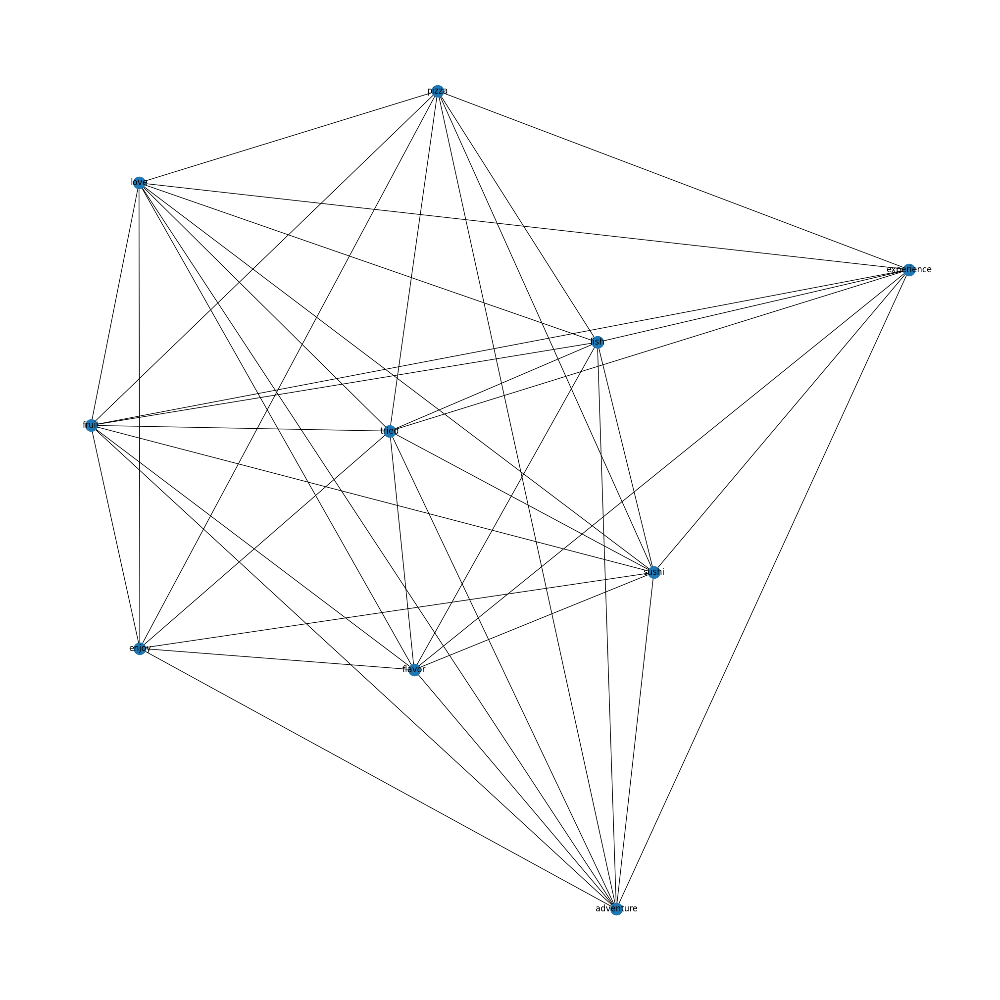

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.8:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['gastronomy','food','gathering','social','like','thing','especially','trying','dish','used','good','started','hamburger','even','right','stuff','crepe','sometimes','lasagna','lately','made','coast','plate','bogota','taste','never','appreciate','waffle','shrimp','time','recently','different','delicious','onion','change','diet','surprisingly','mouth','found','developed','garlic','goodness','spaghetti','special','fry','fried','weird','snail','mature','pasta','occasion','muscle','moved','place','plantain','mexic','prawn','pregnancy','meat','mandarin','sausage','protein','pto','liked','life','recent','kid','jeno','itali','rome','salmon','restaurant','french','book','birthday','dislike','development','texture','brotherinlaw','bud','daughter','cream','crab','called','tomato','type','ceviche','cheese','trip','traveling','tri','also','unique','chinese','family','working','every','variety','eating','enthusiast','various','enjoyed','anchovy','surprise','squid','find','egg','unappealing','party','paradise','trust','quite','pand','rare','unknown','pretty','peace','prepared','whole','unconventional','power','pleasure','pleasant','value','rarely','person','understanding','upgraded','spiciness','response','really','sound','smooth','sneak','someone','take','sou','soup','treat','suddenly','story','start','want','standard','specifically','showed','showdown','shot','seeing','section','secret','second','wide','thought','roll','reward','tossing','translation','world','resist','rephrasing','repetitive','opened','actually','one','consume','consumption','cool','culinary','dance','delicate','deliciously','discover','either','enough','entirely','everyday','example','excitement','excites','explore','explosion','feast','fiesta','firework','first','form','full','funky','consuming','competition','gave','combo','affair','affinity','already','always','amazed','amazing','appeal','appreciating','arrival','avoid','become','begun','best','bite','bland','bumped','cared','certain','chance','check','childhood','clarity','clear','gamechanger','getting','often','later','adulting','liking','little','long','make','makeover','medium','meeting','mentor','menu','might','mild','mini','minivacation','missing','motivated','mystery','needed','note','occasionally','offbeat','offered','officially','level','know','give','knew','goto','guilty','guru','hanging','happened','healthy','highquality','hospital','hospitalized','importance','include','increase','indulging','influence','influenced','influencers','ingredient','innovative','integrating','introduced','italy','keep','kick','wrapped']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p9n = p9noncons.apply(clean_text)
network9n = create_red(p9n, 'network9n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network9n)
dfx

,Node,Total Co-occurrence Frequency
9,tried,360
3,fish,324
4,flavor,294
1,enjoy,264
8,sushi,240
5,fruit,196
7,pizza,168
6,love,150
2,experience,126
0,adventure,102


In [ ]:
# Texto proporcionado
texto = """

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

In [ ]:
#print("p9c:", p9c.nodes())
#print("p9n:", p9n.nodes())

In [ ]:
#plt.title('Question 9: Recent experiences with preferred foods - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P9.png', dpi=300, bbox_inches='tight')
#plt.show()

#P10-RECENT EXPERIENCES WITH DISLIKED FOODS

In [ ]:
p10cons= compared['P51-RECENT EXPERIENCES WITH DISLIKED FOODS-CONS'].astype(str)
p10noncons= compared['P51-RECENT EXPERIENCES WITH DISLIKED FOODS-NONCONS'].astype(str)

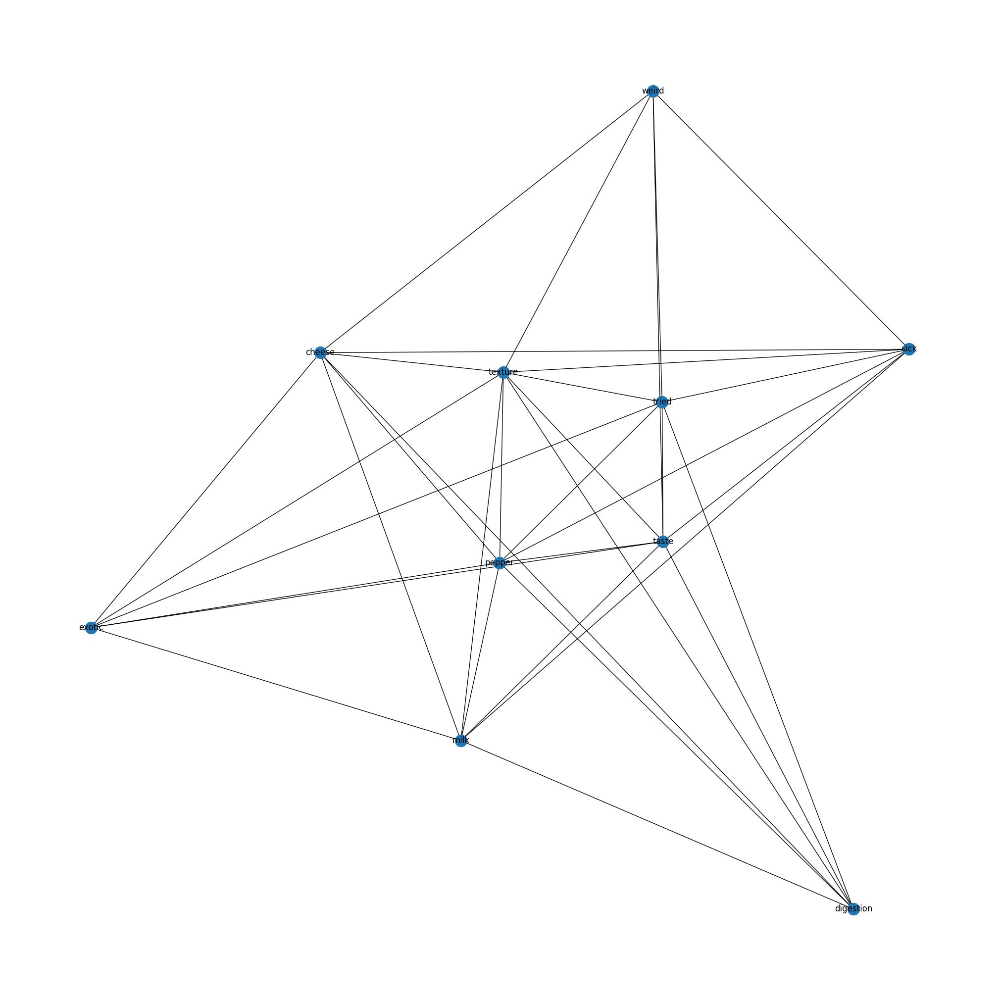

In [ ]:
def clean_text(text):
    additional_stopwords = []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.8:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['avoid','egg','sweet','diet','tasted','aversion','pregnancy','veggie','associate','health','liver','lentil','glutenfree','like','food','chicken','dont','much','eating','bell','thing','experience','restaurant','dessert','back','even','know','never','anything','nope','bone','burger','something','nogo','dish','nugget','pizza','super','many','vegetable','place','fish','flavor','pas','past','home','fruit','hard','made','good','blood','cautious','sandwich','time','coffee','truck','love','lose','look','hair','take','healthy','vibe','water','well','happened','interest','might','mess','paisa','real','rice','right','pastry','salad','pasta','sausage','shrimp','paella','since','sound','spicy','stand','moving','stuff','popcorn','worth','green','family','certain','cake','drink','crunchy','either','depends','blue','bean','enough','day','consumption','consuming','dislike','always','contain','aged','agree','found','flour','garlic','color','cheeseboard','special','count','said','challenge','cream','starting','scene','soft','contains','sardine','completely','condiment','stick','sauce','shrim','serving','serve','snack','sushi','work','whether','whatever','watery','also','appeal','appreciate','usually','used','turned','trying','attention','avocado','tofu','think','banana','tend','bite','body','taco','bud','sure','cause','strong','crunch','reason','reputation','long','need','else','enemy','mouth','enjoy','enjoyable','menu','meal','especially','adventure','excellent','exciting','local','drinking','expensive','list','eye','left','learned','feel','keep','issue','follow','giving','happening','eater','nothing','repeat','rejected','reduced','hamburger','currently','rarely','ramen','processed','prepared','curry','prefer','postpregnancy','portion','daughter','poorly','plate','often','definitely','pineapple','people','developed','different','digest','party','dressing','otherwise','opened','one','added','yeah','tres','lech','thanks','stopped','stomach','zero','intolerance','must','ruin','service','fancy','bogotá','fearing','getting','urchin','took','strongly','slowly','pandemic','sprout','specific','soda','seemed','pain','mazamorra','care','chontaduro','carbonated','call','crime','resumed','revolted','cardboard','secondary','came','budget','simple','slime','brussels','smelling','repeatedly','redcolored','soap','careful','checking','changed','peppercrazy','pitaya','pool','realize','praise','pretty','price','psauce','pudding','quinoa','breath','oyster','tough','tripledecker','anymore','vowed','ancient','went','wife','wing','wobbly','worked','working','afraid','yikes','associated','toast','birth','specialized','breaking','spoiled','bracket','brace','became','tired','sunbath','tastiest','terrible','balut','tiny','overrated','curb','horrible','fertilized','fishshaped','foot','frog','gave','gelatin','cilantro','goodbye','halfshell','choy','hated','hawaii','hiding','hike','club','fear','cone','delicacy','cute','cutlet','cutting','dared','date','cool','diner','drowning','duck','ever','expiration','honestly','hunt','overkill','indigestion','mode','mold','movie','choked','nemesis','next','none','nono','chestnut','number','oceanflavored','onetime','onion','ordered','mild','accept','mayonnaise','killed','inferno','inherently','interested','joint','kick','leafy','looked','leaving','choking','leg','lesson','liverwurst','longer','abdominal']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p10c = p10cons.apply(clean_text)
network10 = create_red(p10c, 'network10')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network10)
dfx

,Node,Total Co-occurrence Frequency
8,tried,648
6,taste,611
4,pepper,432
7,texture,413
3,milk,228
9,weird,184
0,cheese,174
5,sick,124
1,digestion,58
2,exotic,58


In [ ]:
# Texto proporcionado
texto = """
6	egg	920
29	sweet	408
4	diet	408
32	tasted	309
1	aversion	309
21	pregnancy	168
38	veggie	168
0	associate	168
11	health	168
14	liver	168
13	lentil	168
9	glutenfree	66

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'egg','sweet','diet','tasted','aversion','pregnancy','veggie','associate','health','liver','lentil','glutenfree'


#10N

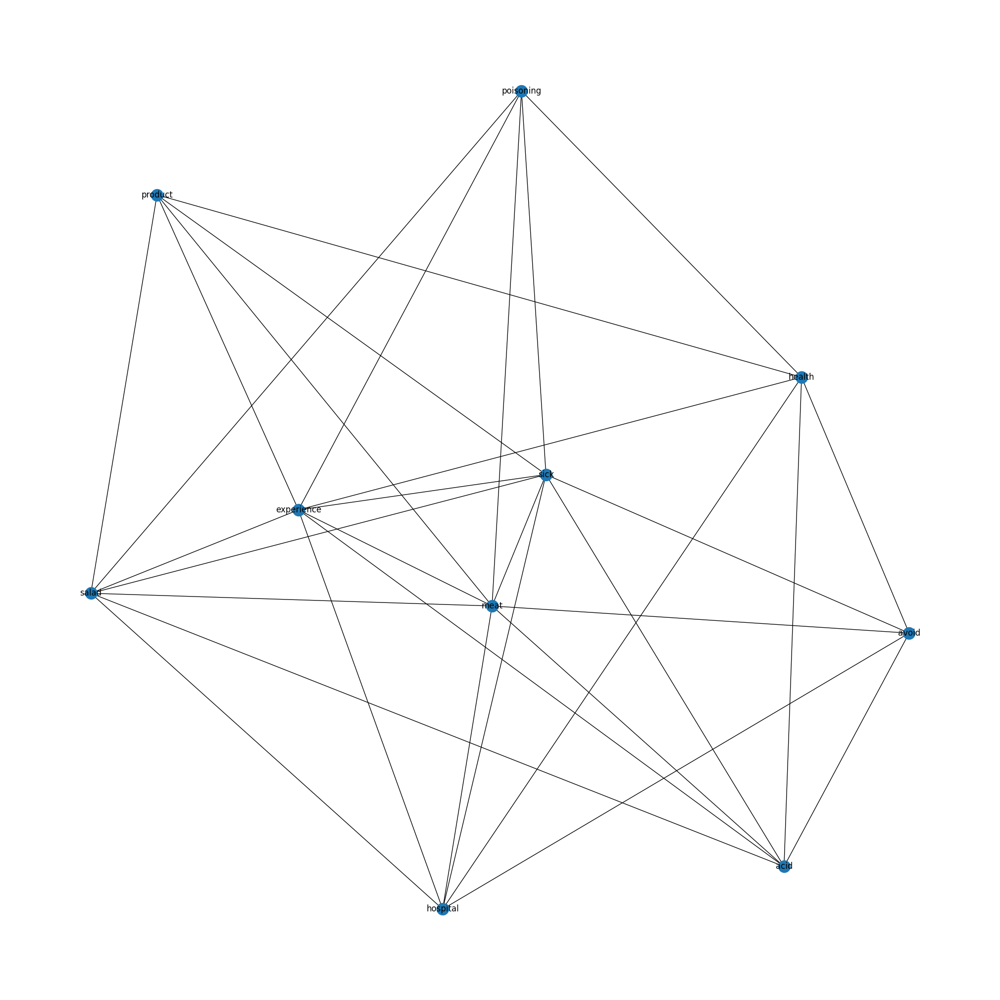

In [ ]:
def clean_text(text):
    additional_stopwords =  []
    nltk_stopwords = set(stopwords.words('english')).union(additional_stopwords)
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    cleaned_tokens = []
    for token in tokens:
        token = ''.join([char for char in token if char not in string.punctuation])
        if token and token.lower() not in nltk_stopwords and len(token) > 3 and token.lower() != 've':
            token = re.sub(r'([a-z])([A-Z])', r'\1 \2', token)
            cleaned_tokens.append(lemmatizer.lemmatize(token.lower()))
    text_clean = ' '.join(cleaned_tokens)
    text_clean = ' '.join(text_clean.split())
    text_clean = re.sub(r'\d+', '', text_clean)
    return text_clean
def create_red(p1n, network_id):
    min_word_frequency = 1
    vectorizer = CountVectorizer(ngram_range=(1, 1), min_df=min_word_frequency)
    X_p1n = vectorizer.fit_transform(p1n)  # Vectorización
    words = vectorizer.get_feature_names_out()  # Palabras en la red
    G1n = nx.Graph()
    cooccurrence_matrix = (X_p1n.T @ X_p1n).toarray()  # Convertir a matriz densa
    for word in words:
        G1n.add_node(word)
    for i, word1 in enumerate(words):
        for j, word2 in enumerate(words):
            if i < j:
                weight = cooccurrence_matrix[i, j]
                if weight > 5 and random.random() < 0.8:  # 50% de probabilidad de añadir la arista
                    G1n.add_edge(word1, word2, weight=weight)
    nodes_to_remove = ['feel','fish','feeling','safer','trauma','mushy','overcooked','combined','cleanse','caused','badtasting','food','like','dont','used','aversion','reason','certain','sometimes','consumption','taste','eating','recent','stand','dish','make','currently','sauce','rib','consume','made','acne','soup','pickle','yeah','grain','hard','body','high','heavy','life','grilled','mess','know','good','never','level','pomegranate','wrong','weak','wasting','want','vendor','uric','tomato','time','thick','sugary','stuff','stopped','spinach','something','seed','restaurant','gone','prepared','prefer','pork','reduced','much','either','flour','anymore','although','also','alone','cream','choice','dairy','developed','beetroot','even','burger','smart','skin','soft','simply','fruit','spicy','sound','sight','carnivore','spoiled','buying','steak','steer','similar','come','clear','safe','consumed','restrict','restricting','condition','right','rodizio','rough','share','completely','santa','company','scarred','seafood','sto','seemed','still','suero','train','tri','tricky','tried','trust','trusted','turn','amount','almost','well','without','wonder','worth','would','affecting','advised','year','tough','business','totally','bought','reputable','sure','surprise','swear','swell','tabasco','tell','texture','thing','thought','averse','tired','tolerate','appetizing','respect','reluctance','repulsed','except','invited','irritation','expect','large','learned','leather','left','lesson','enjoyable','ingredient','lip','list','liver','long','look','enjoy','making','marta','interesting','infection','repetitive','guava','gathering','general','getting','given','going','friend','flow','felt','guess','impression','hamburger','haunt','family','fair','expired','homemade','experiencing','house','meal','egg','easy','cross','perspective','pfor','disaster','diet','poorly','decided','precaution','cutting','pto','milk','queasy','cousin','recently','recommended','costeño','relationship','gamechanger','remind','peating','pasta','past','passed','mind','mouth','move','easily','need','negative','done','nogo','occasionally','often','overload','disgusted','parent','particularly','party','zone']
    G1n.remove_nodes_from(nodes_to_remove)
    degrees = dict(G1n.degree())
    top_20_nodes = sorted(degrees, key=degrees.get, reverse=True)[:10]
    nodes_to_keep = set(top_20_nodes)
    nodes_to_remove_specific = set(G1n.nodes()) - set(top_20_nodes)
    G1n.remove_nodes_from(nodes_to_remove_specific)
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(G1n)
    nx.draw(G1n, pos, with_labels=True)
    plt.show()
    all_network_labels[network_id] = {word: word for word in G1n.nodes()}
    return G1n
# Aplicar la función clean_text a la copia de la columna
p10n = p10noncons.apply(clean_text)
network10n = create_red(p10n, 'network10n')

In [ ]:
def create_node_frequency_dataframe(G):
    node_frequencies = {node: sum(weight for _, _, weight in G.edges(node, data='weight')) for node in G.nodes()}
    dfx = pd.DataFrame(node_frequencies.items(), columns=['Node', 'Total Co-occurrence Frequency'])
    dfx = dfx.sort_values(by='Total Co-occurrence Frequency', ascending=False)
    return dfx
dfx = create_node_frequency_dataframe(network10n)
dfx

,Node,Total Co-occurrence Frequency
5,meat,280
9,sick,217
2,experience,140
1,avoid,135
8,salad,116
3,health,102
0,acid,72
4,hospital,72
6,poisoning,62
7,product,62


In [ ]:
# Texto proporcionado
texto = """
8	feel	402
10	fish	174
9	feeling	118
20	safer	42
26	trauma	42
14	mushy	42
15	overcooked	42
6	combined	42
5	cleanse	42
4	caused	42
3	badtasting	42

"""
lineas = texto.split('\n')
palabras = []
for linea in lineas:
    palabras_linea = linea.split()
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]
    palabras.extend(palabras_sin_numeros)
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)
print(cadena_palabras)

'feel','fish','feeling','safer','trauma','mushy','overcooked','combined','cleanse','caused','badtasting'


In [ ]:
#plt.title('Question 10: Recent experiences with disliked foods - Communities Bipartite Network')
#plt.axis('off')
#plt.legend(handles=combined_handles, loc='upper right', title="Nodes", bbox_to_anchor=(0.02, 0.98), fontsize=13)
#plt.savefig('P10.png', dpi=300, bbox_inches='tight')
#plt.show()

#Pickle

Download de las redes

In [ ]:
# Diccionario con todas las redes
all_networks = {
    'network1': network1, 'network1n': network1n, 'network2': network2, 'network2n': network2n,
    'network3': network3, 'network3n': network3n, 'network4': network4, 'network4n': network4n,
    'network5': network5, 'network5n': network5n, 'network6': network6, 'network6n': network6n,
    'network7': network7, 'network7n': network7n, 'network8': network8, 'network8n': network8n,
    'network9': network9, 'network9n': network9n, 'network10': network10, 'network10n': network10n
}
# Guardar cada red en un archivo separado
for name, network in all_networks.items():
    file_path = f'/content/drive/MyDrive/Projects/Insects/{name}_network.pickle'
    with open(file_path, 'wb') as f:
        pickle.dump(network, f)

# Exportar el diccionario de etiquetas
with open('all_network_labels.pickle', 'wb') as f:
    pickle.dump(all_network_labels, f)

#Upload de las redes

In [4]:
network_names = [
    'network1', 'network1n', 'network2', 'network2n',
    'network3', 'network3n', 'network4', 'network4n',
    'network5', 'network5n', 'network6', 'network6n',
    'network7', 'network7n', 'network8', 'network8n',
    'network9', 'network9n', 'network10', 'network10n'
]

# Cargar todas las redes desde sus archivos
all_networks = {}
for name in network_names:
    file_path = f'/content/drive/MyDrive/Projects/Insects/{name}_network.pickle'
    with open(file_path, 'rb') as f:
        all_networks[name] = pickle.load(f)


# Ruta al archivo donde se guardó el diccionario
file_path = '/content/drive/MyDrive/Projects/Insects/all_network_labels.pickle'

# Cargar el diccionario desde el archivo
with open(file_path, 'rb') as f:
    all_network_labels = pickle.load(f)

In [5]:
net1 = all_networks['network1'] #Eating Patterns C
net1n = all_networks['network1n'] #Eating Patterns N
net2 = all_networks['network2'] #Characteristics and preferences C
net2n = all_networks['network2n'] #Characteristics and preferences N
net3 = all_networks['network3'] #Characteristics non prefered food C
net3n = all_networks['network3n'] #Characteristics non prefered food N
#-------
net4 = all_networks['network4'] #Cultural C
net4n = all_networks['network4n'] #Cultural N
net5 = all_networks['network5'] #Knowledge Int C
net5n = all_networks['network5n'] #Knowledge Int N
net6 = all_networks['network6'] #Knowledge Colombia C
net6n = all_networks['network6n'] #Knowledge Colombia N
#----- Chilhood Experiences
net7 = all_networks['network7']
net7n = all_networks['network7n']
net8 = all_networks['network8']
net8n = all_networks['network8n']
net9 = all_networks['network9']
net9n = all_networks['network9n']
net10 = all_networks['network10']
net10n = all_networks['network10n']

In [6]:
net1.name = 'net1' #Eating Patterns C
net1n.name = 'net1n' #Eating Patterns N
net2.name = 'net2' #Characteristics and preferences C
net2n.name = 'net2n' #Characteristics and preferences N
net3.name = 'net3n' #Characteristics non prefered food C
net3n.name = 'net3n' #Characteristics non prefered food N
#-------
net4.name = 'net4' #Cultural C
net4n.name = 'net4n' #Cultural N
net5.name = 'net5' #Knowledge Int C
net5n.name = 'net5n' #Knowledge Int N
net6.name = 'net6' #Knowledge Colombia C
net6n.name = 'net6n' #Knowledge Colombia N
#----- Chilhood Experiences
net7.name = 'net7' #childhood + prefered food C
net7n.name = 'net7n' #childhood + prefered food N
net8.name = 'net8' #childhood + non prefered food C
net8n.name = 'net8n' #childhood + non prefered food N
#----------------------------------------------------
net9.name = 'net9' #Recent + prefered food C
net9n.name = 'net9n' #Recent + prefered food N
net10.name = 'net10' #Recent + non prefered food C
net10n.name = 'net10n' #Recent + non prefered food N

#Multiplex

es posible, en base a este codigo generar un dataframe que imprima una columna llamada nodos donde esten todas las etiquetas de los nodos, una columna que se llame capa que contenga la capa que corresponde a cada nodo, una columa que diga centralidad intercapa y se imprima la centralidad intercapa de cada nodo, una columa que diga comunidad y que se imprima un asterisco * si el nodo tiene alta comunidad, ** dos asteriscos ysi la comunidad es media y *** tres asteriscos si la comunidd del nodo es baja.

#Eating paterns

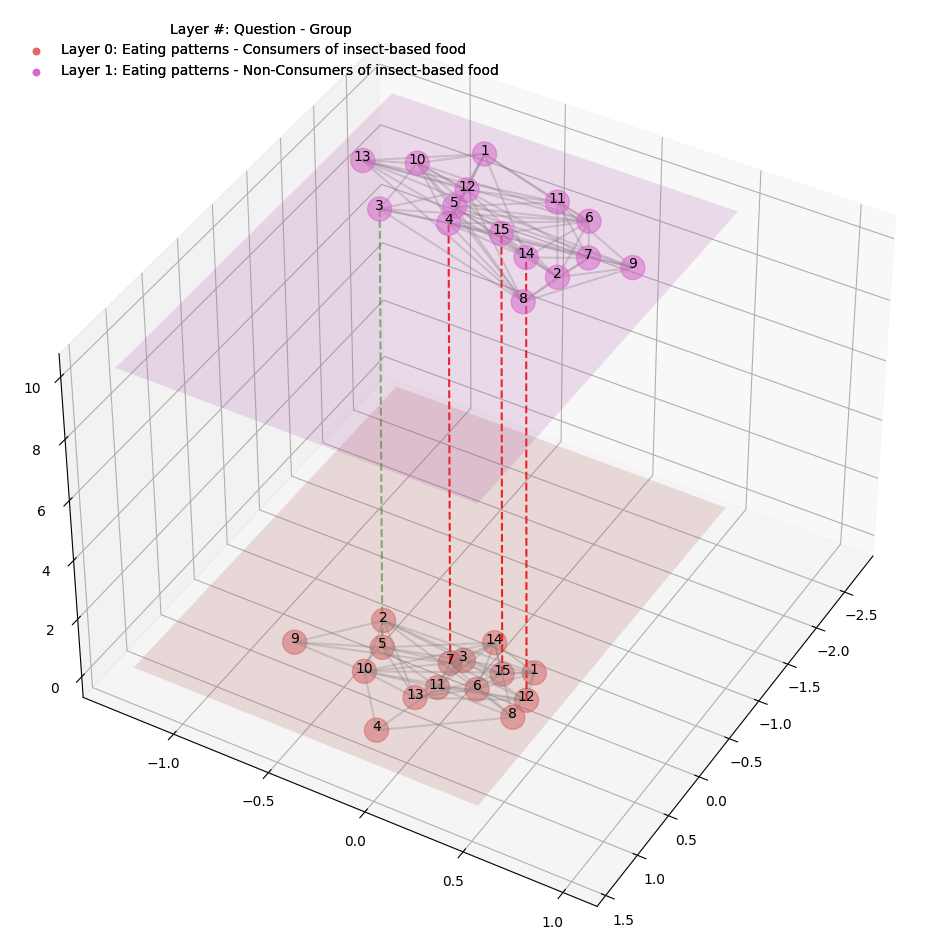

In [ ]:
class LayeredNetworkGraph(object):
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        self.graphs = graphs
        self.total_layers = len(graphs)
        self.node_labels = node_labels
        self.layout = layout
        if ax:
            self.ax = ax
        else:
            fig = plt.figure()
            self.ax = fig.add_subplot(111, projection='3d')
        self.eigenvector_centrality = {}
        self.get_nodes()
        self.get_edges_within_layers()
        self.calculate_eigenvector_centrality()  # Primero calcula la centralidad
        self.get_edges_between_layers_by_eigenvector_centrality()  # Luego obtén los bordes basados en la centralidad
        self.get_node_positions()
        self.draw()
    def get_nodes(self):
        self.nodes = []
        for z, g in enumerate(self.graphs):
            self.nodes.extend([(node, z) for node in g.nodes()])
    def get_edges_within_layers(self):
        self.edges_within_layers = []
        for z, g in enumerate(self.graphs):
            self.edges_within_layers.extend([((source, z), (target, z)) for source, target in g.edges()])
    def get_edges_between_layers_by_eigenvector_centrality(self):
        self.edges_between_layers_by_eigenvector_centrality = []
        for z1, g in enumerate(self.graphs[:-1]):
            z2 = z1 + 1
            h = self.graphs[z2]
            shared_nodes = set(g.nodes()) & set(h.nodes())
            sorted_nodes = sorted(shared_nodes, key=lambda n:self.eigenvector_centrality[(n, z1)], reverse=True)
            self.edges_between_layers_by_eigenvector_centrality.extend([((node, z1), (node, z2)) for node in sorted_nodes])
    def calculate_eigenvector_centrality(self):
        for z, g in enumerate(self.graphs):
            centrality = nx.eigenvector_centrality(g)
            self.eigenvector_centrality.update({(n, z): centrality[n] for n in g.nodes()})
    def get_node_positions(self, *args, **kwargs):
        composition = self.graphs[0]
        for h in self.graphs[1:]:
            composition = nx.compose(composition, h)
        pos = self.layout(composition, *args, **kwargs)
        self.node_positions = dict()
        for z, g in enumerate(self.graphs):
            layer_offset = z * 10  # Desplazamiento en z
            network_name = g.name
            x_layer_offset = network_offsets.get(network_name, {}).get('x_offset', 0) * z
            y_layer_offset = network_offsets.get(network_name, {}).get('y_offset', 0) * z
            self.node_positions.update({
                (node, z): (pos[node][0] + x_layer_offset, pos[node][1] + y_layer_offset, layer_offset)
                for node in g.nodes()
            })
    def draw_nodes(self, nodes, color,alpha =None, *args, **kwargs):
        x, y, z = zip(*[self.node_positions[node] for node in nodes])
        self.ax.scatter(x, y, z, color=color, alpha = 0.5, *args, **kwargs)
    def draw_edges(self, edges, *args, **kwargs):
        segments = [(self.node_positions[source], self.node_positions[target]) for source, target in edges]
        line_collection = Line3DCollection(segments, *args, **kwargs)
        self.ax.add_collection3d(line_collection)
    def get_extent(self, pad=0.1):
        xyz = np.array(list(self.node_positions.values()))
        xmin, ymin, _ = np.min(xyz, axis=0)
        xmax, ymax, _ = np.max(xyz, axis=0)
        dx = xmax - xmin
        dy = ymax - ymin
        return (xmin - pad * dx, xmax + pad * dx), \
            (ymin - pad * dy, ymax + pad * dy)
    def draw_plane(self, z, *args, **kwargs):
        network_name = self.graphs[z].name
        color = legend_info.get(network_name, '#CCCCCC')
        (xmin, xmax), (ymin, ymax) = self.get_extent(pad=0.1)
        u = np.linspace(xmin, xmax, 150)
        v = np.linspace(ymin, ymax, 150)
        U, V = np.meshgrid(u, v)
        layer_offset = z * 10
        W = layer_offset * np.ones_like(U)
        self.ax.plot_surface(U, V, W, color=color, *args, **kwargs)
    def synchronize_labels(self):
        missing_labels = set(self.node_positions.keys()) - set(self.node_labels.keys())
        for node in missing_labels:
            self.node_labels[node] = f"Nodo {node[0]}"
        extra_labels = set(self.node_labels.keys()) - set(self.node_positions.keys())
        for node in extra_labels:
            del self.node_labels[node]
    def draw(self):
        self.draw_edges(self.edges_within_layers, color='black', alpha=0.3, linestyle='-', zorder=2)
        self.draw_edges(self.edges_between_layers, color='Red', alpha=0.8, linestyle='--', zorder=2)
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.2, zorder=1)
            color = legend_info.get(self.graphs[z].name, 'default_color')
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
        if self.node_labels:
            self.draw_node_labels(self.node_labels,
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  zorder=100)
    def draw_node_labels(self, labels, font_size=9, color='black', **kwargs):  # Tamaño de fuente reducido
        for node, (x, y, z) in self.node_positions.items():
            label = labels.get(node, f'{node[0]}')
            self.ax.text(x, y, z, label, fontsize=font_size, color=color, alpha=0.7, **kwargs)  # Añadida transparencia
node_labels = {}
for z, g in enumerate([net1, net1n]):
    for node in g.nodes():
        node_labels[(node, z)] = f'Nodo {node}'
class ModifiedLayeredNetworkGraph(LayeredNetworkGraph): #Se encarga únicamente de las comunidades de las redes.
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        super().__init__(graphs, node_labels=node_labels, layout=layout, ax=ax)
        """Determine edges between layers based on community detection."""
    def order_nodes_by_community(self):
        multiplex_network = nx.Graph()
        for z, g in enumerate(self.graphs):
            g = nx.relabel_nodes(g, {n: (n, z) for n in g.nodes()})
            multiplex_network = nx.compose(multiplex_network, g)
        partition = community_louvain.best_partition(multiplex_network)
        community_sizes = defaultdict(int)
        for node, community in partition.items():
            community_sizes[community] += 1
        ordered_nodes = {}
        for z, g in enumerate(self.graphs):
            nodes_in_layer = [(n, community_sizes[partition[(n, z)]]) for n in g.nodes()]
            nodes_in_layer.sort(key=lambda x: x[1], reverse=True)
            ordered_nodes[z] = [node for node, _ in nodes_in_layer]
        for z, nodes in ordered_nodes.items():
            for i, node in enumerate(nodes):
                self.node_labels[(node, z)] = f'{i + 1}'
    def draw(self):
        top_centrality_edges = self.edges_between_layers_by_eigenvector_centrality[:3]
        other_edges = self.edges_between_layers_by_eigenvector_centrality[3:]
        self.draw_edges(top_centrality_edges, color='red', alpha=0.9, linestyle='--', zorder=2)
        self.draw_edges(other_edges, color='green', alpha=0.5, linestyle='--', zorder=2)
        self.draw_edges(self.edges_within_layers, color='grey', alpha=0.3, linestyle='-', zorder=1)
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.18, zorder=1)
        for z in range(self.total_layers):
            color = legend_info[list(legend_info.keys())[z]]  # Obtiene el color de la leyenda
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
class NodeLabelPrinter:
    def __init__(self, ax, node_positions, node_labels, font_size=10, color='black'):
        self.ax = ax
        self.node_positions = node_positions
        self.node_labels = node_labels
        self.font_size = font_size
        self.color = color
    def print_labels(self):
        for node, position in self.node_positions.items():
            if node in self.node_labels:
                x, y, z = position
                label = self.node_labels[node]
                self.ax.text(x, y, z + 0.1, label, fontsize=self.font_size, color=self.color,
                             ha='center', va='center', zorder=11)
legend_info = {
    'net1':'#DF6767',
    'net1n':'#DF67D2'
}
legend_infou = {
    'Layer 0: Eating patterns - Consumers of insect-based food':'#DF6767',
    'Layer 1: Eating patterns - Non-Consumers of insect-based food':'#DF67D2'
}
network_offsets = {
    'net1': {'x_offset': 0.5, 'y_offset': 0.5}, #naranja
    'net1n': {'x_offset': -1.5, 'y_offset': -0.5}, #rosado
}
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=40, azim=30) #Elevación y Eje Z
graph = ModifiedLayeredNetworkGraph([net1, net1n],
                                    node_labels=node_labels,
                                    layout=lambda G: nx.spring_layout(G, k=4.7, iterations=40),
                                    ax=ax)
graph.calculate_eigenvector_centrality()
graph.get_edges_between_layers_by_eigenvector_centrality()
graph.order_nodes_by_community()
label_printer = NodeLabelPrinter(ax, graph.node_positions, node_labels)
label_printer.print_labels()
for label, color in legend_infou.items():
    ax.scatter([], [], c=color, label=label)
legend_color = ax.legend(title="Layer #: Question - Group", loc='upper left', frameon=False)
ax.add_artist(legend_color)
plt.draw()
plt.show()
fig.savefig('Multinetwork1.png', format='png')

In [ ]:
top_centrality_edges = {}
for edge in graph.edges_between_layers_by_eigenvector_centrality:
    top_centrality_edges[edge[0]] = edge[1]  # Mapear el nodo de la capa actual a su nodo conectado en la siguiente capa
data = []
for node in graph.nodes:
    centrality_marker = ''
    connected_node_label = ''
    if node in top_centrality_edges:
        centrality_marker = '*'
        connected_node = top_centrality_edges[node]
        connected_node_label = connected_node[0],connected_node[1]  # Modificado para mostrar solo el número y la capa
    eigenvector_centrality = round(graph.eigenvector_centrality.get(node, 0), 3)
    node_label_and_number = f"{node_labels.get(node, 'Nodo')} ({node[0]})"
    layer = node[1]
    degree = len([edge for edge in graph.edges_within_layers if node in edge])
    inter_layer_connections = len([target for edge in graph.edges_between_layers_by_eigenvector_centrality for target in edge if node in edge])
    inter_layer_centrality = degree + inter_layer_connections
    row = {
        'Node': node_label_and_number,
        'CN': connected_node_label,
        'L': layer,
        'EC': f"{eigenvector_centrality}{centrality_marker}",
        'IC': inter_layer_centrality
    }
    data.append(row)
df = pd.DataFrame(data, columns=['Node', 'CN', 'L', 'EC', 'IC'])
#df = df.to_latex()
df


,Node,CN,L,EC,IC
0,1 (arepa),,0,0.297,8
1,2 (beef),,0,0.251,7
2,3 (bread),,0,0.329,9
3,4 (cereal),,0,0.111,3
4,5 (cheese),"(cheese, 1)",0,0.221*,8
5,6 (chicken),,0,0.261,7
6,7 (chocolate),"(chocolate, 1)",0,0.252*,9
7,8 (fish),,0,0.213,6
8,9 (fruit),,0,0.139,4
9,10 (plantain),,0,0.297,9


#Characteristics

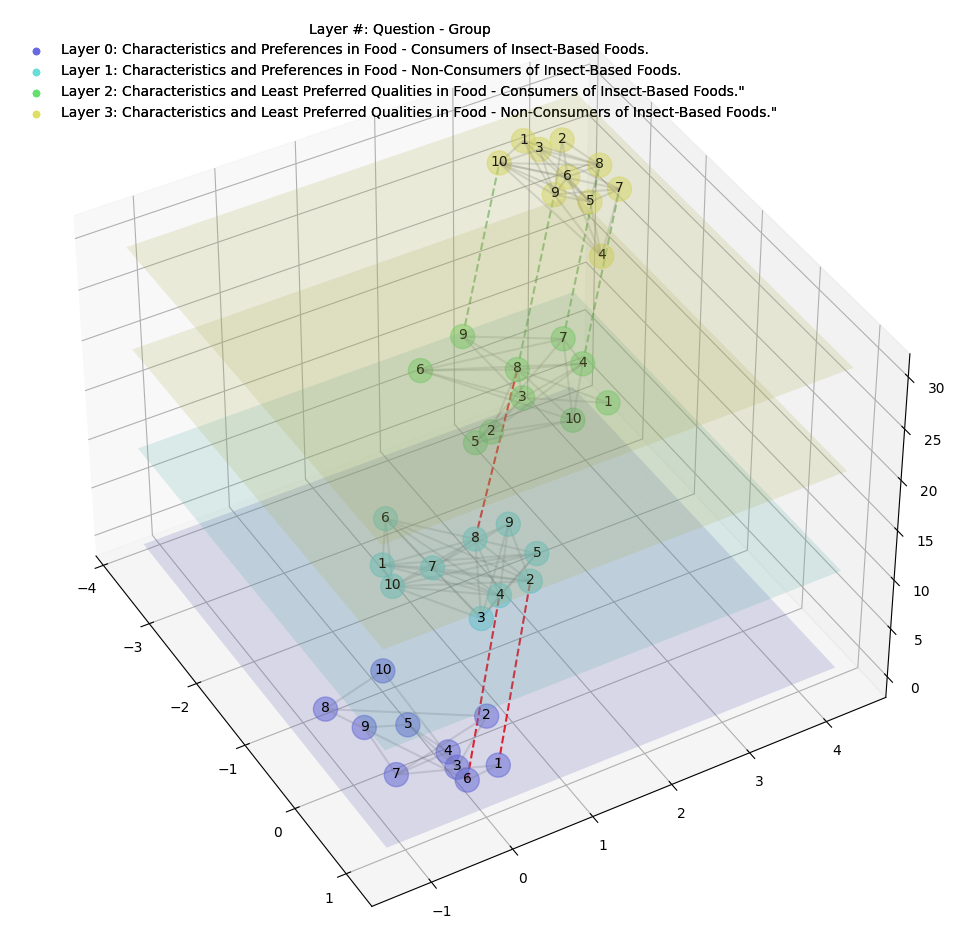

In [ ]:
class LayeredNetworkGraph(object):
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        self.graphs = graphs
        self.total_layers = len(graphs)
        self.node_labels = node_labels
        self.layout = layout
        if ax:
            self.ax = ax
        else:
            fig = plt.figure()
            self.ax = fig.add_subplot(111, projection='3d')
        self.eigenvector_centrality = {}
        self.get_nodes()
        self.get_edges_within_layers()
        self.calculate_eigenvector_centrality()  # Primero calcula la centralidad
        self.get_edges_between_layers_by_eigenvector_centrality()  # Luego obtén los bordes basados en la centralidad
        self.get_node_positions()
        self.draw()
    def get_nodes(self):
        self.nodes = []
        for z, g in enumerate(self.graphs):
            self.nodes.extend([(node, z) for node in g.nodes()])
    def get_edges_within_layers(self):
        self.edges_within_layers = []
        for z, g in enumerate(self.graphs):
            self.edges_within_layers.extend([((source, z), (target, z)) for source, target in g.edges()])
    def get_edges_between_layers_by_eigenvector_centrality(self):
        self.edges_between_layers_by_eigenvector_centrality = []
        for z1, g in enumerate(self.graphs[:-1]):
            z2 = z1 + 1
            h = self.graphs[z2]
            shared_nodes = set(g.nodes()) & set(h.nodes())
            sorted_nodes = sorted(shared_nodes, key=lambda n:self.eigenvector_centrality[(n, z1)], reverse=True)
            self.edges_between_layers_by_eigenvector_centrality.extend([((node, z1), (node, z2)) for node in sorted_nodes])
    def calculate_eigenvector_centrality(self):
        for z, g in enumerate(self.graphs):
            centrality = nx.eigenvector_centrality(g)
            self.eigenvector_centrality.update({(n, z): centrality[n] for n in g.nodes()})


    def get_node_positions(self, *args, **kwargs):
        composition = self.graphs[0]
        for h in self.graphs[1:]:
            composition = nx.compose(composition, h)
        pos = self.layout(composition, *args, **kwargs)
        self.node_positions = dict()

        for z, g in enumerate(self.graphs):
            layer_offset = z * 10  # Desplazamiento en z
            network_name = g.name
            # Obtén los desplazamientos de x e y para esta red específica
            x_layer_offset = network_offsets.get(network_name, {}).get('x_offset', 0) * z
            y_layer_offset = network_offsets.get(network_name, {}).get('y_offset', 0) * z

            # Actualiza las posiciones de los nodos con los desplazamientos personalizados
            self.node_positions.update({
                (node, z): (pos[node][0] + x_layer_offset, pos[node][1] + y_layer_offset, layer_offset)
                for node in g.nodes()
            })
    def draw_nodes(self, nodes, color,alpha =None, *args, **kwargs):
        x, y, z = zip(*[self.node_positions[node] for node in nodes])
        self.ax.scatter(x, y, z, color=color, alpha = 0.5, *args, **kwargs)
    def draw_edges(self, edges, *args, **kwargs):
        segments = [(self.node_positions[source], self.node_positions[target]) for source, target in edges]
        line_collection = Line3DCollection(segments, *args, **kwargs)
        self.ax.add_collection3d(line_collection)
    def get_extent(self, pad=0.1):
        xyz = np.array(list(self.node_positions.values()))
        xmin, ymin, _ = np.min(xyz, axis=0)
        xmax, ymax, _ = np.max(xyz, axis=0)
        dx = xmax - xmin
        dy = ymax - ymin
        return (xmin - pad * dx, xmax + pad * dx), \
            (ymin - pad * dy, ymax + pad * dy)
    def draw_plane(self, z, *args, **kwargs):
        network_name = self.graphs[z].name
        color = legend_info.get(network_name, '#CCCCCC')
        (xmin, xmax), (ymin, ymax) = self.get_extent(pad=0.1)
        u = np.linspace(xmin, xmax, 150)
        v = np.linspace(ymin, ymax, 150)
        U, V = np.meshgrid(u, v)
        layer_offset = z * 10
        W = layer_offset * np.ones_like(U)
        self.ax.plot_surface(U, V, W, color=color, *args, **kwargs)
    def synchronize_labels(self):
        # Asegura que cada nodo en node_positions tenga una etiqueta en node_labels.
        missing_labels = set(self.node_positions.keys()) - set(self.node_labels.keys())
        for node in missing_labels:
            self.node_labels[node] = f"Nodo {node[0]}"

        # Opcionalmente, también podría eliminar cualquier etiqueta que no tenga un nodo correspondiente.
        extra_labels = set(self.node_labels.keys()) - set(self.node_positions.keys())
        for node in extra_labels:
            del self.node_labels[node]
    def draw(self):
        self.draw_edges(self.edges_within_layers, color='black', alpha=0.3, linestyle='-', zorder=2)
        self.draw_edges(self.edges_between_layers, color='Red', alpha=0.8, linestyle='--', zorder=2)
        for z in range(self.total_layers):
            # Se llama a draw_plane con el color correcto
            self.draw_plane(z, alpha=0.2, zorder=1)
            color = legend_info.get(self.graphs[z].name, 'default_color')
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
        if self.node_labels:
            self.draw_node_labels(self.node_labels,
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  zorder=100)
    def draw_node_labels(self, labels, font_size=9, color='black', **kwargs):  # Tamaño de fuente reducido
        for node, (x, y, z) in self.node_positions.items():
            label = labels.get(node, f'{node[0]}')
            self.ax.text(x, y, z, label, fontsize=font_size, color=color, alpha=0.7, **kwargs)  # Añadida transparencia
node_labels = {}
for z, g in enumerate([net2, net2n, net3, net3n]):
    for node in g.nodes():
        node_labels[(node, z)] = f'Nodo {node}'
class ModifiedLayeredNetworkGraph(LayeredNetworkGraph): #Se encarga únicamente de las comunidades de las redes.
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        super().__init__(graphs, node_labels=node_labels, layout=layout, ax=ax)
        """Determine edges between layers based on community detection."""
    def order_nodes_by_community(self):
        multiplex_network = nx.Graph()
        for z, g in enumerate(self.graphs):
            g = nx.relabel_nodes(g, {n: (n, z) for n in g.nodes()})
            multiplex_network = nx.compose(multiplex_network, g)
        partition = community_louvain.best_partition(multiplex_network)
        community_sizes = defaultdict(int)
        for node, community in partition.items():
            community_sizes[community] += 1
        ordered_nodes = {}
        for z, g in enumerate(self.graphs):
            nodes_in_layer = [(n, community_sizes[partition[(n, z)]]) for n in g.nodes()]
            nodes_in_layer.sort(key=lambda x: x[1], reverse=True)
            ordered_nodes[z] = [node for node, _ in nodes_in_layer]
        # Actualiza las etiquetas de los nodos
        for z, nodes in ordered_nodes.items():
            for i, node in enumerate(nodes):
                self.node_labels[(node, z)] = f'{i + 1}'
    def draw(self):
        top_centrality_edges = self.edges_between_layers_by_eigenvector_centrality[:3]
        other_edges = self.edges_between_layers_by_eigenvector_centrality[3:]
        self.draw_edges(top_centrality_edges, color='red', alpha=0.9, linestyle='--', zorder=2)
        self.draw_edges(other_edges, color='green', alpha=0.4, linestyle='--', zorder=2)
        self.draw_edges(self.edges_within_layers, color='grey', alpha=0.25, linestyle='-', zorder=1)
        # Dibuja planos para cada capa
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.18, zorder=1)
        # Dibuja TODOS los nodos de TODAS las capas con el color correspondiente
        for z in range(self.total_layers):
            color = legend_info[list(legend_info.keys())[z]]  # Obtiene el color de la leyenda
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
class NodeLabelPrinter:
    def __init__(self, ax, node_positions, node_labels, font_size=10, color='black'):
        self.ax = ax
        self.node_positions = node_positions
        self.node_labels = node_labels
        self.font_size = font_size
        self.color = color
    def print_labels(self):
        for node, position in self.node_positions.items():
            if node in self.node_labels:
                x, y, z = position
                label = self.node_labels[node]
                self.ax.text(x, y, z + 0.1, label, fontsize=self.font_size, color=self.color,
                             ha='center', va='center', zorder=11)
legend_info = {
    'net2':'#676BDF',
    'net2n':'#67DFD8',
    'net3':'#67DF6E',
    'net3n':'#DFDF67'
}

legend_infou = {
    'Layer 0: Characteristics and Preferences in Food - Consumers of Insect-Based Foods.':'#676BDF',
    'Layer 1: Characteristics and Preferences in Food - Non-Consumers of Insect-Based Foods.':'#67DFD8',
    'Layer 2: Characteristics and Least Preferred Qualities in Food - Consumers of Insect-Based Foods."':'#67DF6E',
    'Layer 3: Characteristics and Least Preferred Qualities in Food - Non-Consumers of Insect-Based Foods."':'#DFDF67'
}
network_offsets = {
    'net2': {'x_offset': 1.0, 'y_offset': 0.0}, #morado
    'net2n': {'x_offset': -0.9, 'y_offset': 1}, #Aguamarina
    'net3': {'x_offset': 3.5, 'y_offset': 0.0}, #verde
    'net3n': {'x_offset': -0.8, 'y_offset': 1}, #Amarilla -> Toda la visualización depende de dónde está la primera y la últoma red.
}
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=40, azim=-30) #Elevación y Eje Z
graph = ModifiedLayeredNetworkGraph([net2, net2n, net3, net3n],
                                    node_labels=node_labels,
                                    layout=lambda G: nx.spring_layout(G, k=3, iterations=17),
                                    ax=ax)
graph.calculate_eigenvector_centrality()
graph.get_edges_between_layers_by_eigenvector_centrality()
graph.order_nodes_by_community()
label_printer = NodeLabelPrinter(ax, graph.node_positions, node_labels)
label_printer.print_labels()

# Código para la leyenda y para mostrar la gráfica
for label, color in legend_infou.items():
    ax.scatter([], [], c=color, label=label)
legend_color = ax.legend(title="Layer #: Question - Group", loc='upper left', frameon=False)
ax.add_artist(legend_color)
plt.draw()
plt.show()
fig.savefig('Multinetwork2.png', format='png')

In [ ]:
top_centrality_edges = {}
for edge in graph.edges_between_layers_by_eigenvector_centrality:
    top_centrality_edges[edge[0]] = edge[1]  # Mapear el nodo de la capa actual a su nodo conectado en la siguiente capa
data = []
for node in graph.nodes:
    centrality_marker = ''
    connected_node_label = ''
    if node in top_centrality_edges:
        centrality_marker = '*'
        connected_node = top_centrality_edges[node]
        connected_node_label = connected_node[0],connected_node[1]  # Modificado para mostrar solo el número y la capa
    eigenvector_centrality = round(graph.eigenvector_centrality.get(node, 0), 3)
    node_label_and_number = f"{node_labels.get(node, 'Nodo')} ({node[0]})"
    layer = node[1]
    degree = len([edge for edge in graph.edges_within_layers if node in edge])
    inter_layer_connections = len([target for edge in graph.edges_between_layers_by_eigenvector_centrality for target in edge if node in edge])
    inter_layer_centrality = degree + inter_layer_connections
    row = {
        'Node': node_label_and_number,
        'CN': connected_node_label,
        'L': layer,
        'EC': f"{eigenvector_centrality}{centrality_marker}",
        'IC': inter_layer_centrality
    }
    data.append(row)
df2 = pd.DataFrame(data, columns=['Node', 'CN', 'L', 'EC', 'IC'])
#df2 = df2.to_latex()
df2

,Node,CN,L,EC,IC
0,1 (combination),"(combination, 1)",0,0.255*,4
1,2 (creaminess),,0,0.355,3
2,3 (crispiness),,0,0.304,3
3,4 (crunch),,0,0.365,3
4,5 (crunchy),,0,0.318,3
5,6 (experience),"(experience, 1)",0,0.318*,5
6,7 (mixing),,0,0.424,4
7,8 (smoky),,0,0.304,3
8,9 (smooth),,0,0.255,2
9,10 (tender),,0,0.209,2


#Cultural Beleifs

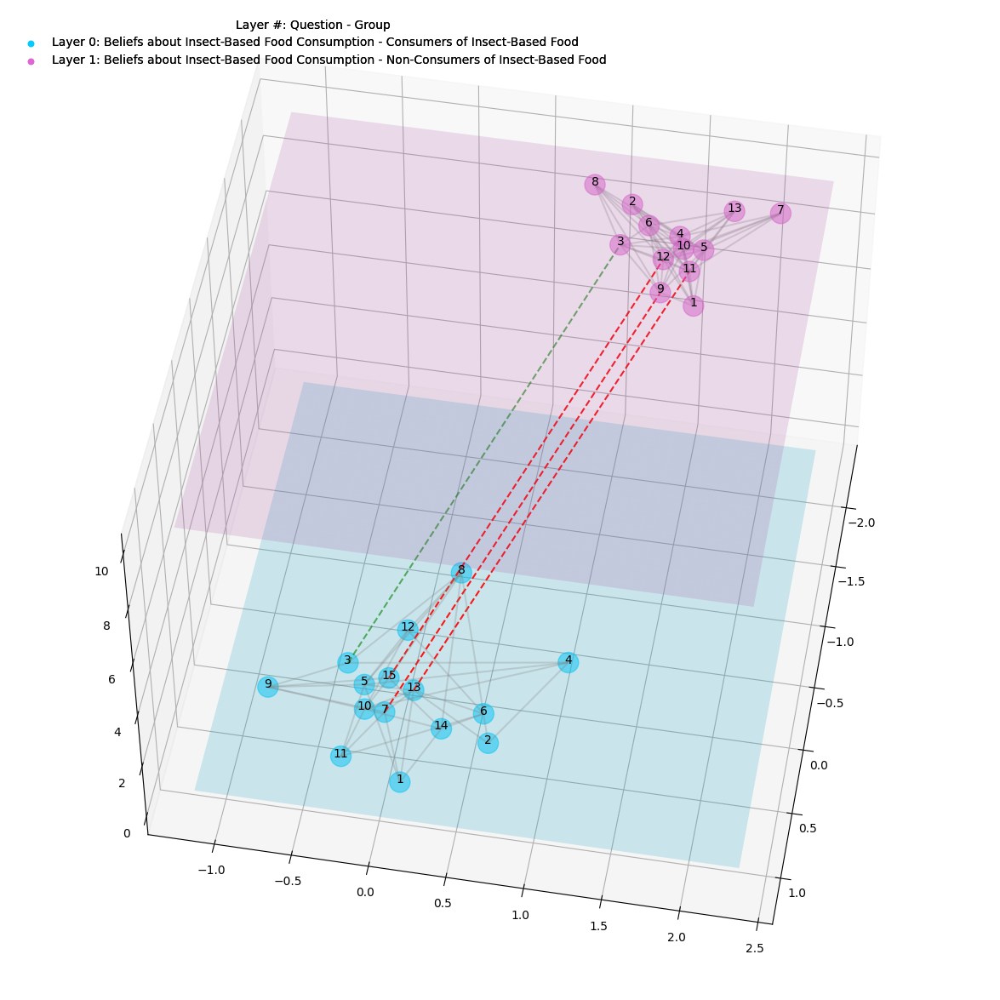

In [ ]:
class LayeredNetworkGraph(object):
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        self.graphs = graphs
        self.total_layers = len(graphs)
        self.node_labels = node_labels
        self.layout = layout
        if ax:
            self.ax = ax
        else:
            fig = plt.figure()
            self.ax = fig.add_subplot(111, projection='3d')
        self.eigenvector_centrality = {}
        self.get_nodes()
        self.get_edges_within_layers()
        self.calculate_eigenvector_centrality()  # Primero calcula la centralidad
        self.get_edges_between_layers_by_eigenvector_centrality()  # Luego obtén los bordes basados en la centralidad
        self.get_node_positions()
        self.draw()
    def get_nodes(self):
        self.nodes = []
        for z, g in enumerate(self.graphs):
            self.nodes.extend([(node, z) for node in g.nodes()])
    def get_edges_within_layers(self):
        self.edges_within_layers = []
        for z, g in enumerate(self.graphs):
            self.edges_within_layers.extend([((source, z), (target, z)) for source, target in g.edges()])
    def get_edges_between_layers_by_eigenvector_centrality(self):
        self.edges_between_layers_by_eigenvector_centrality = []
        for z1, g in enumerate(self.graphs[:-1]):
            z2 = z1 + 1
            h = self.graphs[z2]
            shared_nodes = set(g.nodes()) & set(h.nodes())
            sorted_nodes = sorted(shared_nodes, key=lambda n:self.eigenvector_centrality[(n, z1)], reverse=True)
            self.edges_between_layers_by_eigenvector_centrality.extend([((node, z1), (node, z2)) for node in sorted_nodes])
    def calculate_eigenvector_centrality(self):
        for z, g in enumerate(self.graphs):
            centrality = nx.eigenvector_centrality(g)
            self.eigenvector_centrality.update({(n, z): centrality[n] for n in g.nodes()})


    def get_node_positions(self, *args, **kwargs):
        composition = self.graphs[0]
        for h in self.graphs[1:]:
            composition = nx.compose(composition, h)
        pos = self.layout(composition, *args, **kwargs)
        self.node_positions = dict()

        for z, g in enumerate(self.graphs):
            layer_offset = z * 10  # Desplazamiento en z
            network_name = g.name
            # Obtén los desplazamientos de x e y para esta red específica
            x_layer_offset = network_offsets.get(network_name, {}).get('x_offset', 0) * z
            y_layer_offset = network_offsets.get(network_name, {}).get('y_offset', 0) * z

            # Actualiza las posiciones de los nodos con los desplazamientos personalizados
            self.node_positions.update({
                (node, z): (pos[node][0] + x_layer_offset, pos[node][1] + y_layer_offset, layer_offset)
                for node in g.nodes()
            })
    def draw_nodes(self, nodes, color,alpha =None, *args, **kwargs):
        x, y, z = zip(*[self.node_positions[node] for node in nodes])
        self.ax.scatter(x, y, z, color=color, alpha = 0.5, *args, **kwargs)
    def draw_edges(self, edges, *args, **kwargs):
        segments = [(self.node_positions[source], self.node_positions[target]) for source, target in edges]
        line_collection = Line3DCollection(segments, *args, **kwargs)
        self.ax.add_collection3d(line_collection)
    def get_extent(self, pad=0.1):
        xyz = np.array(list(self.node_positions.values()))
        xmin, ymin, _ = np.min(xyz, axis=0)
        xmax, ymax, _ = np.max(xyz, axis=0)
        dx = xmax - xmin
        dy = ymax - ymin
        return (xmin - pad * dx, xmax + pad * dx), \
            (ymin - pad * dy, ymax + pad * dy)
    def draw_plane(self, z, *args, **kwargs):
        network_name = self.graphs[z].name
        color = legend_info.get(network_name, '#CCCCCC')
        (xmin, xmax), (ymin, ymax) = self.get_extent(pad=0.1)
        u = np.linspace(xmin, xmax, 150)
        v = np.linspace(ymin, ymax, 150)
        U, V = np.meshgrid(u, v)
        layer_offset = z * 10
        W = layer_offset * np.ones_like(U)
        self.ax.plot_surface(U, V, W, color=color, *args, **kwargs)
    def synchronize_labels(self):
        # Asegura que cada nodo en node_positions tenga una etiqueta en node_labels.
        missing_labels = set(self.node_positions.keys()) - set(self.node_labels.keys())
        for node in missing_labels:
            self.node_labels[node] = f"Nodo {node[0]}"

        # Opcionalmente, también podría eliminar cualquier etiqueta que no tenga un nodo correspondiente.
        extra_labels = set(self.node_labels.keys()) - set(self.node_positions.keys())
        for node in extra_labels:
            del self.node_labels[node]
    def draw(self):
        self.draw_edges(self.edges_within_layers, color='black', alpha=0.3, linestyle='-', zorder=2)
        self.draw_edges(self.edges_between_layers, color='Red', alpha=0.8, linestyle='--', zorder=2)
        for z in range(self.total_layers):
            # Se llama a draw_plane con el color correcto
            self.draw_plane(z, alpha=0.2, zorder=1)
            color = legend_info.get(self.graphs[z].name, 'default_color')
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
        if self.node_labels:
            self.draw_node_labels(self.node_labels,
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  zorder=100)
    def draw_node_labels(self, labels, font_size=9, color='black', **kwargs):  # Tamaño de fuente reducido
        for node, (x, y, z) in self.node_positions.items():
            label = labels.get(node, f'{node[0]}')
            self.ax.text(x, y, z, label, fontsize=font_size, color=color, alpha=0.7, **kwargs)  # Añadida transparencia
node_labels = {}
for z, g in enumerate([net4, net4n]):
    for node in g.nodes():
        node_labels[(node, z)] = f'Nodo {node}'
class ModifiedLayeredNetworkGraph(LayeredNetworkGraph): #Se encarga únicamente de las comunidades de las redes.
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        super().__init__(graphs, node_labels=node_labels, layout=layout, ax=ax)
        """Determine edges between layers based on community detection."""
    def order_nodes_by_community(self):
        multiplex_network = nx.Graph()
        for z, g in enumerate(self.graphs):
            g = nx.relabel_nodes(g, {n: (n, z) for n in g.nodes()})
            multiplex_network = nx.compose(multiplex_network, g)
        partition = community_louvain.best_partition(multiplex_network)
        community_sizes = defaultdict(int)
        for node, community in partition.items():
            community_sizes[community] += 1
        ordered_nodes = {}
        for z, g in enumerate(self.graphs):
            nodes_in_layer = [(n, community_sizes[partition[(n, z)]]) for n in g.nodes()]
            nodes_in_layer.sort(key=lambda x: x[1], reverse=True)
            ordered_nodes[z] = [node for node, _ in nodes_in_layer]
        # Actualiza las etiquetas de los nodos
        for z, nodes in ordered_nodes.items():
            for i, node in enumerate(nodes):
                self.node_labels[(node, z)] = f'{i + 1}'
    def draw(self):
        top_centrality_edges = self.edges_between_layers_by_eigenvector_centrality[:3]
        other_edges = self.edges_between_layers_by_eigenvector_centrality[3:]
        self.draw_edges(top_centrality_edges, color='red', alpha=0.9, linestyle='--', zorder=2)
        self.draw_edges(other_edges, color='green', alpha=0.6, linestyle='--', zorder=2)
        self.draw_edges(self.edges_within_layers, color='grey', alpha=0.27, linestyle='-', zorder=1)
        # Dibuja planos para cada capa
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.18, zorder=1)
        # Dibuja TODOS los nodos de TODAS las capas con el color correspondiente
        for z in range(self.total_layers):
            color = legend_info[list(legend_info.keys())[z]]  # Obtiene el color de la leyenda
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
class NodeLabelPrinter:
    def __init__(self, ax, node_positions, node_labels, font_size=10, color='black'):
        self.ax = ax
        self.node_positions = node_positions
        self.node_labels = node_labels
        self.font_size = font_size
        self.color = color
    def print_labels(self):
        for node, position in self.node_positions.items():
            if node in self.node_labels:
                x, y, z = position
                label = self.node_labels[node]
                self.ax.text(x, y, z + 0.1, label, fontsize=self.font_size, color=self.color,
                             ha='center', va='center', zorder=11)

legend_info = {
    'net4':'#03CDFE',
    'net4n':'#DF67D2'
}
legend_infou = {
    'Layer 0: Beliefs about Insect-Based Food Consumption - Consumers of Insect-Based Food':'#03CDFE',
    'Layer 1: Beliefs about Insect-Based Food Consumption - Non-Consumers of Insect-Based Food':'#DF67D2'
}
network_offsets = {
    'net4': {'x_offset': -0.5, 'y_offset': -0.5}, #Azul
    'net4n': {'x_offset': -1.5, 'y_offset': 1.5}, #Purpura
}
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=50, azim=370) #Elevación y Eje Z
graph = ModifiedLayeredNetworkGraph([net4, net4n],
                                    node_labels=node_labels,
                                    layout=lambda G: nx.spring_layout(G, k=2.5, iterations=30),
                                    ax=ax)
graph.calculate_eigenvector_centrality()
graph.get_edges_between_layers_by_eigenvector_centrality()
graph.order_nodes_by_community()
label_printer = NodeLabelPrinter(ax, graph.node_positions, node_labels)
label_printer.print_labels()

# Código para la leyenda y para mostrar la gráfica
for label, color in legend_infou.items():
    ax.scatter([], [], c=color, label=label)
legend_color = ax.legend(title="Layer #: Question - Group", loc='upper left', frameon=False)
ax.add_artist(legend_color)
plt.draw()
plt.show()
fig.savefig('Multinetwork3.png', format='png')

In [ ]:
top_centrality_edges = {}
for edge in graph.edges_between_layers_by_eigenvector_centrality:
    top_centrality_edges[edge[0]] = edge[1]  # Mapear el nodo de la capa actual a su nodo conectado en la siguiente capa
data = []
for node in graph.nodes:
    centrality_marker = ''
    connected_node_label = ''
    if node in top_centrality_edges:
        centrality_marker = '*'
        connected_node = top_centrality_edges[node]
        connected_node_label = connected_node[0],connected_node[1]  # Modificado para mostrar solo el número y la capa
    eigenvector_centrality = round(graph.eigenvector_centrality.get(node, 0), 3)
    node_label_and_number = f"{node_labels.get(node, 'Nodo')} ({node[0]})"
    layer = node[1]
    degree = len([edge for edge in graph.edges_within_layers if node in edge])
    inter_layer_connections = len([target for edge in graph.edges_between_layers_by_eigenvector_centrality for target in edge if node in edge])
    inter_layer_centrality = degree + inter_layer_connections
    row = {
        'Node': node_label_and_number,
        'CN': connected_node_label,
        'L': layer,
        'EC': f"{eigenvector_centrality}{centrality_marker}",
        'IC': inter_layer_centrality
    }
    data.append(row)
df3 = pd.DataFrame(data, columns=['Node', 'CN', 'L', 'EC', 'IC'])
#df3 = df3.to_latex()
df3

,Node,CN,L,EC,IC
0,1 (benefit),,0,0.233,4
1,2 (bigbottomed),,0,0.164,3
2,3 (cricket),"(cricket, 1)",0,0.155*,5
3,4 (crosscultural),,0,0.21,4
4,5 (culturally),,0,0.362,7
5,6 (ecosystem),,0,0.214,4
6,7 (environmental),"(environmental, 1)",0,0.211*,6
7,8 (gastronomic),,0,0.291,6
8,9 (harmful),,0,0.268,5
9,10 (heritage),,0,0.359,7


#Knowlwdge

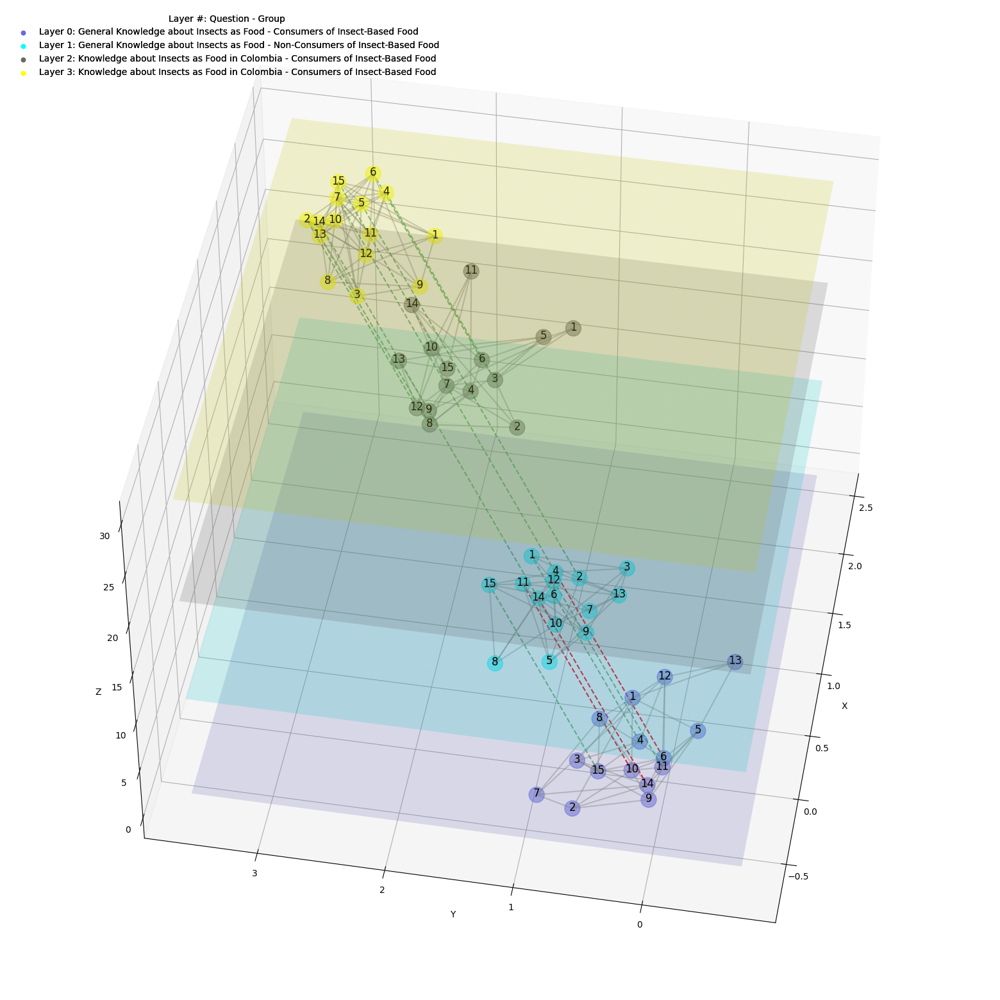

In [7]:
class LayeredNetworkGraph(object):
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        self.graphs = graphs
        self.total_layers = len(graphs)
        self.node_labels = node_labels
        self.layout = layout
        if ax:
            self.ax = ax
        else:
            fig = plt.figure()
            self.ax = fig.add_subplot(111, projection='3d')
        self.eigenvector_centrality = {}
        self.get_nodes()
        self.get_edges_within_layers()
        self.calculate_eigenvector_centrality()  # Primero calcula la centralidad
        self.get_edges_between_layers_by_eigenvector_centrality()  # Luego obtén los bordes basados en la centralidad
        self.get_node_positions()
        self.draw()
    def get_nodes(self):
        self.nodes = []
        for z, g in enumerate(self.graphs):
            self.nodes.extend([(node, z) for node in g.nodes()])
    def get_edges_within_layers(self):
        self.edges_within_layers = []
        for z, g in enumerate(self.graphs):
            self.edges_within_layers.extend([((source, z), (target, z)) for source, target in g.edges()])
    def get_edges_between_layers_by_eigenvector_centrality(self):
        self.edges_between_layers_by_eigenvector_centrality = []
        for z1, g in enumerate(self.graphs[:-1]):
            z2 = z1 + 1
            h = self.graphs[z2]
            shared_nodes = set(g.nodes()) & set(h.nodes())
            sorted_nodes = sorted(shared_nodes, key=lambda n:self.eigenvector_centrality[(n, z1)], reverse=True)
            self.edges_between_layers_by_eigenvector_centrality.extend([((node, z1), (node, z2)) for node in sorted_nodes])
    def calculate_eigenvector_centrality(self):
        for z, g in enumerate(self.graphs):
            centrality = nx.eigenvector_centrality(g)
            self.eigenvector_centrality.update({(n, z): centrality[n] for n in g.nodes()})


    def get_node_positions(self, *args, **kwargs):
        composition = self.graphs[0]
        for h in self.graphs[1:]:
            composition = nx.compose(composition, h)
        pos = self.layout(composition, *args, **kwargs)
        self.node_positions = dict()

        for z, g in enumerate(self.graphs):
            layer_offset = z * 10  # Desplazamiento en z
            network_name = g.name
            # Obtén los desplazamientos de x e y para esta red específica
            x_layer_offset = network_offsets.get(network_name, {}).get('x_offset', 0) * z
            y_layer_offset = network_offsets.get(network_name, {}).get('y_offset', 0) * z

            # Actualiza las posiciones de los nodos con los desplazamientos personalizados
            self.node_positions.update({
                (node, z): (pos[node][0] + x_layer_offset, pos[node][1] + y_layer_offset, layer_offset)
                for node in g.nodes()
            })
    def draw_nodes(self, nodes, color,alpha =None, *args, **kwargs):
        x, y, z = zip(*[self.node_positions[node] for node in nodes])
        self.ax.scatter(x, y, z, color=color, alpha = 0.5, *args, **kwargs)
    def draw_edges(self, edges, *args, **kwargs):
        segments = [(self.node_positions[source], self.node_positions[target]) for source, target in edges]
        line_collection = Line3DCollection(segments, *args, **kwargs)
        self.ax.add_collection3d(line_collection)
    def get_extent(self, pad=0.1):
        xyz = np.array(list(self.node_positions.values()))
        xmin, ymin, _ = np.min(xyz, axis=0)
        xmax, ymax, _ = np.max(xyz, axis=0)
        dx = xmax - xmin
        dy = ymax - ymin
        return (xmin - pad * dx, xmax + pad * dx), \
            (ymin - pad * dy, ymax + pad * dy)
    def draw_plane(self, z, *args, **kwargs):
        network_name = self.graphs[z].name
        color = legend_info.get(network_name, '#CCCCCC')
        (xmin, xmax), (ymin, ymax) = self.get_extent(pad=0.1)
        u = np.linspace(xmin, xmax, 150)
        v = np.linspace(ymin, ymax, 150)
        U, V = np.meshgrid(u, v)
        layer_offset = z * 10
        W = layer_offset * np.ones_like(U)
        self.ax.plot_surface(U, V, W, color=color, *args, **kwargs)
    def synchronize_labels(self):
        # Asegura que cada nodo en node_positions tenga una etiqueta en node_labels.
        missing_labels = set(self.node_positions.keys()) - set(self.node_labels.keys())
        for node in missing_labels:
            self.node_labels[node] = f"Nodo {node[0]}"

        # Opcionalmente, también podría eliminar cualquier etiqueta que no tenga un nodo correspondiente.
        extra_labels = set(self.node_labels.keys()) - set(self.node_positions.keys())
        for node in extra_labels:
            del self.node_labels[node]
    def draw(self):
        self.draw_edges(self.edges_within_layers, color='black', alpha=0.3, linestyle='-', zorder=2)
        self.draw_edges(self.edges_between_layers, color='Red', alpha=0.8, linestyle='--', zorder=2)
        for z in range(self.total_layers):
            # Se llama a draw_plane con el color correcto
            self.draw_plane(z, alpha=0.2, zorder=1)
            color = legend_info.get(self.graphs[z].name, 'default_color')
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
        if self.node_labels:
            self.draw_node_labels(self.node_labels,
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  zorder=100)
    def draw_node_labels(self, labels, font_size=9, color='black', **kwargs):  # Tamaño de fuente reducido
        for node, (x, y, z) in self.node_positions.items():
            label = labels.get(node, f'{node[0]}')
            self.ax.text(x, y, z, label, fontsize=font_size, color=color, alpha=0.7, **kwargs)  # Añadida transparencia
node_labels = {}
for z, g in enumerate([net5, net5n, net6, net6n]):
    for node in g.nodes():
        node_labels[(node, z)] = f'Nodo {node}'
class ModifiedLayeredNetworkGraph(LayeredNetworkGraph): #Se encarga únicamente de las comunidades de las redes.
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        super().__init__(graphs, node_labels=node_labels, layout=layout, ax=ax)
        """Determine edges between layers based on community detection."""
    def order_nodes_by_community(self):
        multiplex_network = nx.Graph()
        for z, g in enumerate(self.graphs):
            g = nx.relabel_nodes(g, {n: (n, z) for n in g.nodes()})
            multiplex_network = nx.compose(multiplex_network, g)
        partition = community_louvain.best_partition(multiplex_network)
        community_sizes = defaultdict(int)
        for node, community in partition.items():
            community_sizes[community] += 1
        ordered_nodes = {}
        for z, g in enumerate(self.graphs):
            nodes_in_layer = [(n, community_sizes[partition[(n, z)]]) for n in g.nodes()]
            nodes_in_layer.sort(key=lambda x: x[1], reverse=True)
            ordered_nodes[z] = [node for node, _ in nodes_in_layer]
        # Actualiza las etiquetas de los nodos
        for z, nodes in ordered_nodes.items():
            for i, node in enumerate(nodes):
                self.node_labels[(node, z)] = f'{i + 1}'
    def draw(self):
        top_centrality_edges = self.edges_between_layers_by_eigenvector_centrality[:3]
        other_edges = self.edges_between_layers_by_eigenvector_centrality[3:]
        self.draw_edges(top_centrality_edges, color='red', alpha=0.9, linestyle='--', zorder=2)
        self.draw_edges(other_edges, color='green', alpha=0.5, linestyle='--', zorder=2)
        self.draw_edges(self.edges_within_layers, color='grey', alpha=0.4, linestyle='-', zorder=1)
        # Dibuja planos para cada capa
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.18, zorder=1)
        # Dibuja TODOS los nodos de TODAS las capas con el color correspondiente
        for z in range(self.total_layers):
            color = legend_info[list(legend_info.keys())[z]]  # Obtiene el color de la leyenda
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
class NodeLabelPrinter:
    def __init__(self, ax, node_positions, node_labels, font_size=12, color='black'):
        self.ax = ax
        self.node_positions = node_positions
        self.node_labels = node_labels
        self.font_size = font_size
        self.color = color
    def print_labels(self):
        for node, position in self.node_positions.items():
            if node in self.node_labels:
                x, y, z = position
                label = self.node_labels[node]
                self.ax.text(x, y, z + 0.1, label, fontsize=self.font_size, color=self.color,
                             ha='center', va='center', zorder=11)
legend_info = {
    'net5':'#676BDF',
    'net5n':'#03FEFE',
    'net6':'#6B6968',
    'net6n':'#FEFE03'
}
legend_infou = {
'Layer 0: General Knowledge about Insects as Food - Consumers of Insect-Based Food': '#676BDF',
'Layer 1: General Knowledge about Insects as Food - Non-Consumers of Insect-Based Food': '#03FEFE',
'Layer 2: Knowledge about Insects as Food in Colombia - Consumers of Insect-Based Food': '#6B6968',
'Layer 3: Knowledge about Insects as Food in Colombia - Consumers of Insect-Based Food': '#FEFE03'
}
network_offsets = {
    'net5': {'x_offset': 0, 'y_offset':0}, #morado
    'net5n': {'x_offset':0.6, 'y_offset': 1}, #Aguamarina
    'net6': {'x_offset': 0.6, 'y_offset':1}, #negra
    'net6n': {'x_offset':0.6, 'y_offset': 1}, #Amarilla -> Toda la visualización depende de dónde está la primera y la últoma red.
}
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=45, azim=190) #Elevación y Eje Z
graph = ModifiedLayeredNetworkGraph([net5, net5n, net6, net6n],
                                    node_labels=node_labels,
                                    layout=lambda G: nx.spring_layout(G, k=2, iterations=30),
                                    ax=ax)
graph.calculate_eigenvector_centrality()
graph.get_edges_between_layers_by_eigenvector_centrality()
graph.order_nodes_by_community()
label_printer = NodeLabelPrinter(ax, graph.node_positions, node_labels)
label_printer.print_labels()
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# Código para la leyenda y para mostrar la gráfica
for label, color in legend_infou.items():
    ax.scatter([], [], c=color, label=label)
legend_color = ax.legend(title="Layer #: Question - Group", loc='upper left', frameon=False)
ax.add_artist(legend_color)
plt.draw()
plt.show()
fig.savefig('Multinetwork4.png', format='png')

In [8]:
top_centrality_edges = {}
for edge in graph.edges_between_layers_by_eigenvector_centrality:
    top_centrality_edges[edge[0]] = edge[1]  # Mapear el nodo de la capa actual a su nodo conectado en la siguiente capa
data = []
for node in graph.nodes:
    centrality_marker = ''
    connected_node_label = ''
    if node in top_centrality_edges:
        centrality_marker = '*'
        connected_node = top_centrality_edges[node]
        connected_node_label = connected_node[0],connected_node[1]  # Modificado para mostrar solo el número y la capa
    eigenvector_centrality = round(graph.eigenvector_centrality.get(node, 0), 3)
    node_label_and_number = f"{node_labels.get(node, 'Nodo')} ({node[0]})"
    layer = node[1]
    degree = len([edge for edge in graph.edges_within_layers if node in edge])
    inter_layer_connections = len([target for edge in graph.edges_between_layers_by_eigenvector_centrality for target in edge if node in edge])
    inter_layer_centrality = degree + inter_layer_connections
    row = {
        'Node': node_label_and_number,
        'CN': connected_node_label,
        'L': layer,
        'EC': f"{eigenvector_centrality}{centrality_marker}",
        'IC': inter_layer_centrality
    }
    data.append(row)
df4 = pd.DataFrame(data, columns=['Node', 'CN', 'L', 'EC', 'IC'])
#df4 = df4.to_latex()
df4

,Node,CN,L,EC,IC
0,1 (afric),,0,0.321,7
1,2 (aphrodisiac),,0,0.248,5
2,3 (bigbottomed),,0,0.223,5
3,4 (cockroach),"(cockroach, 1)",0,0.131*,5
4,5 (cultural),,0,0.299,6
5,6 (culture),"(culture, 1)",0,0.349*,9
6,7 (environmental),,0,0.192,4
7,8 (mineral),,0,0.253,5
8,9 (mojojoy),,0,0.246,5
9,10 (nutritional),"(nutritional, 1)",0,0.305*,8


#Childhood

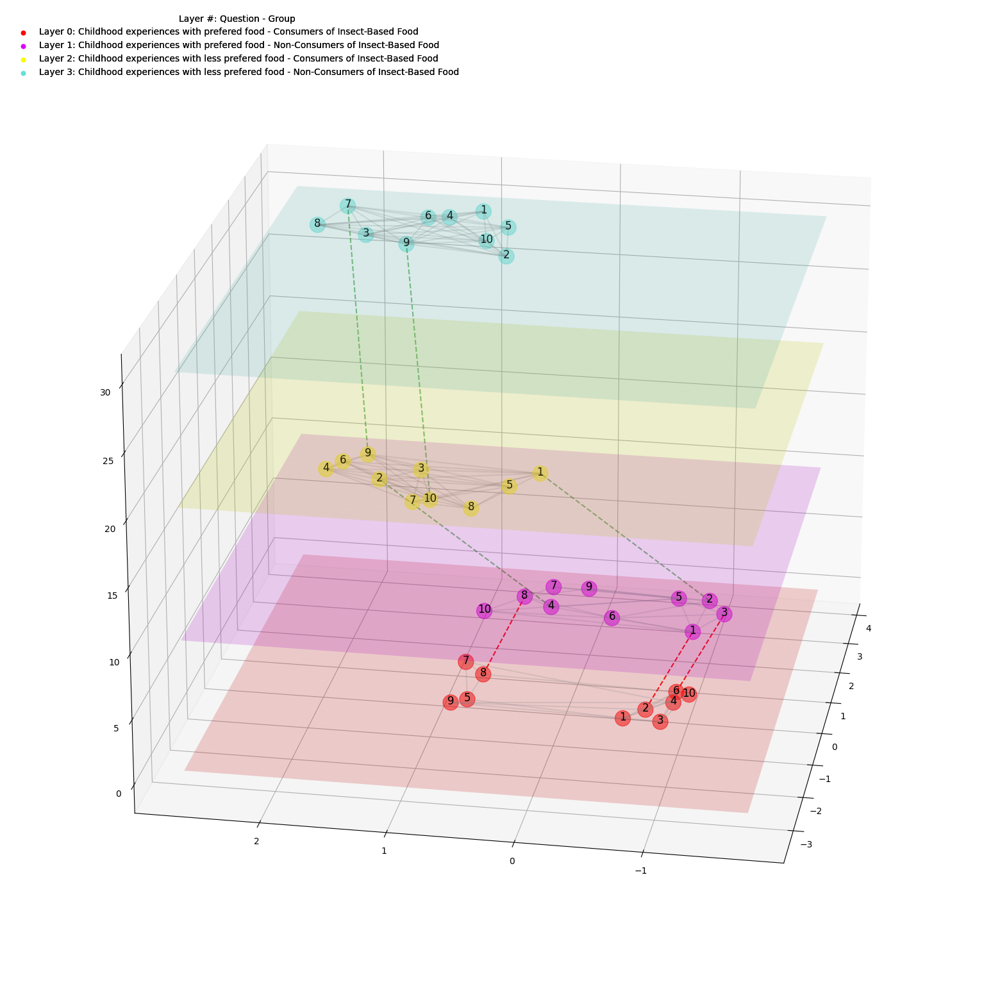

In [10]:
class LayeredNetworkGraph(object):
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        self.graphs = graphs
        self.total_layers = len(graphs)
        self.node_labels = node_labels
        self.layout = layout
        if ax:
            self.ax = ax
        else:
            fig = plt.figure()
            self.ax = fig.add_subplot(111, projection='3d')
        self.eigenvector_centrality = {}
        self.get_nodes()
        self.get_edges_within_layers()
        self.calculate_eigenvector_centrality()  # Primero calcula la centralidad
        self.get_edges_between_layers_by_eigenvector_centrality()  # Luego obtén los bordes basados en la centralidad
        self.get_node_positions()
        self.draw()
    def get_nodes(self):
        self.nodes = []
        for z, g in enumerate(self.graphs):
            self.nodes.extend([(node, z) for node in g.nodes()])
    def get_edges_within_layers(self):
        self.edges_within_layers = []
        for z, g in enumerate(self.graphs):
            self.edges_within_layers.extend([((source, z), (target, z)) for source, target in g.edges()])
    def get_edges_between_layers_by_eigenvector_centrality(self):
        self.edges_between_layers_by_eigenvector_centrality = []
        for z1, g in enumerate(self.graphs[:-1]):
            z2 = z1 + 1
            h = self.graphs[z2]
            shared_nodes = set(g.nodes()) & set(h.nodes())
            sorted_nodes = sorted(shared_nodes, key=lambda n:self.eigenvector_centrality[(n, z1)], reverse=True)
            self.edges_between_layers_by_eigenvector_centrality.extend([((node, z1), (node, z2)) for node in sorted_nodes])
    def calculate_eigenvector_centrality(self):
        for z, g in enumerate(self.graphs):
            centrality = nx.eigenvector_centrality(g)
            self.eigenvector_centrality.update({(n, z): centrality[n] for n in g.nodes()})


    def get_node_positions(self, *args, **kwargs):
        composition = self.graphs[0]
        for h in self.graphs[1:]:
            composition = nx.compose(composition, h)
        pos = self.layout(composition, *args, **kwargs)
        self.node_positions = dict()

        for z, g in enumerate(self.graphs):
            layer_offset = z * 10  # Desplazamiento en z
            network_name = g.name
            # Obtén los desplazamientos de x e y para esta red específica
            x_layer_offset = network_offsets.get(network_name, {}).get('x_offset', 0) * z
            y_layer_offset = network_offsets.get(network_name, {}).get('y_offset', 0) * z

            # Actualiza las posiciones de los nodos con los desplazamientos personalizados
            self.node_positions.update({
                (node, z): (pos[node][0] + x_layer_offset, pos[node][1] + y_layer_offset, layer_offset)
                for node in g.nodes()
            })
    def draw_nodes(self, nodes, color,alpha =None, *args, **kwargs):
        x, y, z = zip(*[self.node_positions[node] for node in nodes])
        self.ax.scatter(x, y, z, color=color, alpha = 0.5, *args, **kwargs)
    def draw_edges(self, edges, *args, **kwargs):
        segments = [(self.node_positions[source], self.node_positions[target]) for source, target in edges]
        line_collection = Line3DCollection(segments, *args, **kwargs)
        self.ax.add_collection3d(line_collection)
    def get_extent(self, pad=0.1):
        xyz = np.array(list(self.node_positions.values()))
        xmin, ymin, _ = np.min(xyz, axis=0)
        xmax, ymax, _ = np.max(xyz, axis=0)
        dx = xmax - xmin
        dy = ymax - ymin
        return (xmin - pad * dx, xmax + pad * dx), \
            (ymin - pad * dy, ymax + pad * dy)
    def draw_plane(self, z, *args, **kwargs):
        network_name = self.graphs[z].name
        color = legend_info.get(network_name, '#CCCCCC')
        (xmin, xmax), (ymin, ymax) = self.get_extent(pad=0.1)
        u = np.linspace(xmin, xmax, 150)
        v = np.linspace(ymin, ymax, 150)
        U, V = np.meshgrid(u, v)
        layer_offset = z * 10
        W = layer_offset * np.ones_like(U)
        self.ax.plot_surface(U, V, W, color=color, *args, **kwargs)
    def synchronize_labels(self):
        # Asegura que cada nodo en node_positions tenga una etiqueta en node_labels.
        missing_labels = set(self.node_positions.keys()) - set(self.node_labels.keys())
        for node in missing_labels:
            self.node_labels[node] = f"Nodo {node[0]}"

        # Opcionalmente, también podría eliminar cualquier etiqueta que no tenga un nodo correspondiente.
        extra_labels = set(self.node_labels.keys()) - set(self.node_positions.keys())
        for node in extra_labels:
            del self.node_labels[node]
    def draw(self):
        self.draw_edges(self.edges_within_layers, color='black', alpha=0.3, linestyle='-', zorder=2)
        self.draw_edges(self.edges_between_layers, color='Red', alpha=0.8, linestyle='--', zorder=2)
        for z in range(self.total_layers):
            # Se llama a draw_plane con el color correcto
            self.draw_plane(z, alpha=0.2, zorder=1)
            color = legend_info.get(self.graphs[z].name, 'default_color')
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
        if self.node_labels:
            self.draw_node_labels(self.node_labels,
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  zorder=100)
    def draw_node_labels(self, labels, font_size=9, color='black', **kwargs):  # Tamaño de fuente reducido
        for node, (x, y, z) in self.node_positions.items():
            label = labels.get(node, f'{node[0]}')
            self.ax.text(x, y, z, label, fontsize=font_size, color=color, alpha=0.7, **kwargs)  # Añadida transparencia
node_labels = {}
for z, g in enumerate([net7, net7n, net8, net8n]):
    for node in g.nodes():
        node_labels[(node, z)] = f'Nodo {node}'
class ModifiedLayeredNetworkGraph(LayeredNetworkGraph): #Se encarga únicamente de las comunidades de las redes.
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        super().__init__(graphs, node_labels=node_labels, layout=layout, ax=ax)
        """Determine edges between layers based on community detection."""
    def order_nodes_by_community(self):
        multiplex_network = nx.Graph()
        for z, g in enumerate(self.graphs):
            g = nx.relabel_nodes(g, {n: (n, z) for n in g.nodes()})
            multiplex_network = nx.compose(multiplex_network, g)
        partition = community_louvain.best_partition(multiplex_network)
        community_sizes = defaultdict(int)
        for node, community in partition.items():
            community_sizes[community] += 1
        ordered_nodes = {}
        for z, g in enumerate(self.graphs):
            nodes_in_layer = [(n, community_sizes[partition[(n, z)]]) for n in g.nodes()]
            nodes_in_layer.sort(key=lambda x: x[1], reverse=True)
            ordered_nodes[z] = [node for node, _ in nodes_in_layer]
        # Actualiza las etiquetas de los nodos
        for z, nodes in ordered_nodes.items():
            for i, node in enumerate(nodes):
                self.node_labels[(node, z)] = f'{i + 1}'
    def draw(self):
        top_centrality_edges = self.edges_between_layers_by_eigenvector_centrality[:3]
        other_edges = self.edges_between_layers_by_eigenvector_centrality[3:]
        self.draw_edges(top_centrality_edges, color='red', alpha=0.9, linestyle='--', zorder=2)
        self.draw_edges(other_edges, color='green', alpha=0.5, linestyle='--', zorder=2)
        self.draw_edges(self.edges_within_layers, color='grey', alpha=0.2, linestyle='-', zorder=1)
        # Dibuja planos para cada capa
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.18, zorder=1)
        # Dibuja TODOS los nodos de TODAS las capas con el color correspondiente
        for z in range(self.total_layers):
            color = legend_info[list(legend_info.keys())[z]]  # Obtiene el color de la leyenda
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
class NodeLabelPrinter:
    def __init__(self, ax, node_positions, node_labels, font_size=12, color='black'):
        self.ax = ax
        self.node_positions = node_positions
        self.node_labels = node_labels
        self.font_size = font_size
        self.color = color
    def print_labels(self):
        for node, position in self.node_positions.items():
            if node in self.node_labels:
                x, y, z = position
                label = self.node_labels[node]
                self.ax.text(x, y, z + 0.1, label, fontsize=self.font_size, color=self.color,
                             ha='center', va='center', zorder=11)
legend_info = {
    'net7':'#FE0303',
    'net7n':'#DC03FE', #Morado
    'net8':'#F6FE03', #Amarillo
    'net8n':'#67DFD8',

}
legend_infou = {
    'Layer 0: Childhood experiences with prefered food - Consumers of Insect-Based Food':'#FE0303',
    'Layer 1: Childhood experiences with prefered food - Non-Consumers of Insect-Based Food':'#DC03FE',
    'Layer 2: Childhood experiences with less prefered food - Consumers of Insect-Based Food':'#F6FE03',
    'Layer 3: Childhood experiences with less prefered food - Non-Consumers of Insect-Based Food':'#67DFD8'
}
network_offsets = {
    'net7': {'x_offset': -1, 'y_offset': 0.5},
    'net7n': {'x_offset': -1.5, 'y_offset': -0.5}, #Morado
    'net8': {'x_offset': -1.0, 'y_offset': 0.4}, #Amarillo
    'net8n': {'x_offset': 0.8, 'y_offset': 0.5},
}
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=22, azim=190) #Elevación y Eje Z
graph = ModifiedLayeredNetworkGraph([net7, net7n, net8, net8n],
                                    node_labels=node_labels,
                                    layout=lambda G: nx.spring_layout(G, k=3, iterations=3),
                                    ax=ax)
graph.calculate_eigenvector_centrality()
graph.get_edges_between_layers_by_eigenvector_centrality()
graph.order_nodes_by_community()
label_printer = NodeLabelPrinter(ax, graph.node_positions, node_labels)
label_printer.print_labels()

# Código para la leyenda y para mostrar la gráfica
for label, color in legend_infou.items():
    ax.scatter([], [], c=color, label=label)
legend_color = ax.legend(title="Layer #: Question - Group", loc='upper left', frameon=False)
ax.add_artist(legend_color)
plt.draw()
plt.show()
fig.savefig('Multinetwork5.png', format='png')

In [ ]:
top_centrality_edges = {}
for edge in graph.edges_between_layers_by_eigenvector_centrality:
    top_centrality_edges[edge[0]] = edge[1]  # Mapear el nodo de la capa actual a su nodo conectado en la siguiente capa
data = []
for node in graph.nodes:
    centrality_marker = ''
    connected_node_label = ''
    if node in top_centrality_edges:
        centrality_marker = '*'
        connected_node = top_centrality_edges[node]
        connected_node_label = connected_node[0],connected_node[1]  # Modificado para mostrar solo el número y la capa
    eigenvector_centrality = round(graph.eigenvector_centrality.get(node, 0), 3)
    node_label_and_number = f"{node_labels.get(node, 'Nodo')} ({node[0]})"
    layer = node[1]
    degree = len([edge for edge in graph.edges_within_layers if node in edge])
    inter_layer_connections = len([target for edge in graph.edges_between_layers_by_eigenvector_centrality for target in edge if node in edge])
    inter_layer_centrality = degree + inter_layer_connections
    row = {
        'Node': node_label_and_number,
        'CN': connected_node_label,
        'L': layer,
        'EC': f"{eigenvector_centrality}{centrality_marker}",
        'IC': inter_layer_centrality
    }
    data.append(row)
df5 = pd.DataFrame(data, columns=['Node', 'CN', 'L', 'EC', 'IC'])
df5 = df5.to_latex()
df5

<ipython-input-115-b2aeb4018538>:27: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  df5 = df5.to_latex()


'\\begin{tabular}{lllrlr}\n\\toprule\n{} &              Node &              CN &  L &      EC &  IC \\\\\n\\midrule\n0  &      1 (barbecue) &                 &  0 &   0.412 &   5 \\\\\n1  &      2 (birthday) &   (birthday, 1) &  0 &  0.343* &   6 \\\\\n2  &         3 (child) &                 &  0 &   0.421 &   5 \\\\\n3  &    4 (connection) &                 &  0 &   0.316 &   4 \\\\\n4  &   5 (countryside) &                 &  0 &   0.193 &   3 \\\\\n5  &      6 (cultural) &   (cultural, 1) &  0 &  0.417* &   7 \\\\\n6  &       7 (emotion) &                 &  0 &   0.174 &   3 \\\\\n7  &          8 (love) &       (love, 1) &  0 &  0.194* &   5 \\\\\n8  &       9 (special) &                 &  0 &   0.267 &   3 \\\\\n9  &        10 (sweet) &                 &  0 &   0.291 &   3 \\\\\n10 &      1 (birthday) &                 &  1 &   0.442 &   8 \\\\\n11 &     2 (childhood) &  (childhood, 2) &  1 &  0.352* &   7 \\\\\n12 &      3 (cultural) &                 &  1 &   0.343 &   6 \\\\\

#Recent

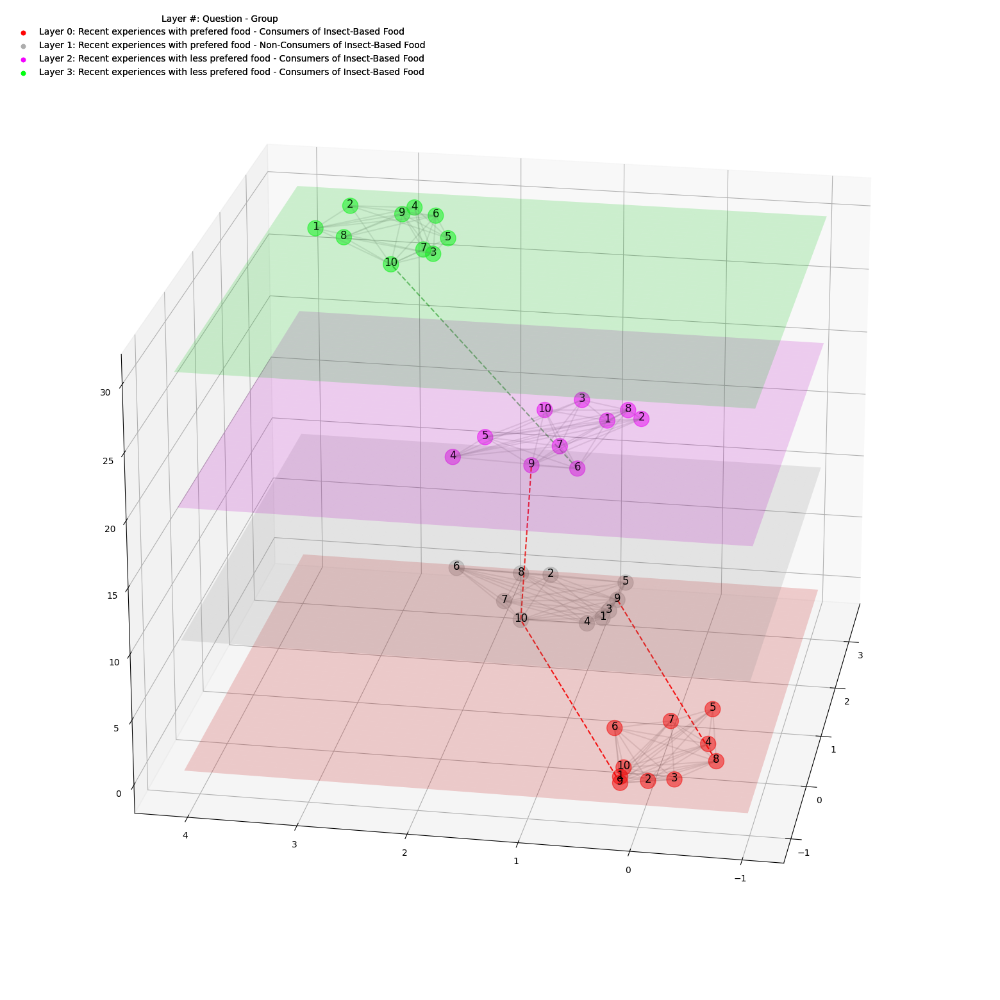

In [ ]:
class LayeredNetworkGraph(object):
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        self.graphs = graphs
        self.total_layers = len(graphs)
        self.node_labels = node_labels
        self.layout = layout
        if ax:
            self.ax = ax
        else:
            fig = plt.figure()
            self.ax = fig.add_subplot(111, projection='3d')
        self.eigenvector_centrality = {}
        self.get_nodes()
        self.get_edges_within_layers()
        self.calculate_eigenvector_centrality()  # Primero calcula la centralidad
        self.get_edges_between_layers_by_eigenvector_centrality()  # Luego obtén los bordes basados en la centralidad
        self.get_node_positions()
        self.draw()
    def get_nodes(self):
        self.nodes = []
        for z, g in enumerate(self.graphs):
            self.nodes.extend([(node, z) for node in g.nodes()])
    def get_edges_within_layers(self):
        self.edges_within_layers = []
        for z, g in enumerate(self.graphs):
            self.edges_within_layers.extend([((source, z), (target, z)) for source, target in g.edges()])
    def get_edges_between_layers_by_eigenvector_centrality(self):
        self.edges_between_layers_by_eigenvector_centrality = []
        for z1, g in enumerate(self.graphs[:-1]):
            z2 = z1 + 1
            h = self.graphs[z2]
            shared_nodes = set(g.nodes()) & set(h.nodes())
            sorted_nodes = sorted(shared_nodes, key=lambda n:self.eigenvector_centrality[(n, z1)], reverse=True)
            self.edges_between_layers_by_eigenvector_centrality.extend([((node, z1), (node, z2)) for node in sorted_nodes])
    def calculate_eigenvector_centrality(self):
        for z, g in enumerate(self.graphs):
            centrality = nx.eigenvector_centrality(g)
            self.eigenvector_centrality.update({(n, z): centrality[n] for n in g.nodes()})


    def get_node_positions(self, *args, **kwargs):
        composition = self.graphs[0]
        for h in self.graphs[1:]:
            composition = nx.compose(composition, h)
        pos = self.layout(composition, *args, **kwargs)
        self.node_positions = dict()

        for z, g in enumerate(self.graphs):
            layer_offset = z * 10  # Desplazamiento en z
            network_name = g.name
            # Obtén los desplazamientos de x e y para esta red específica
            x_layer_offset = network_offsets.get(network_name, {}).get('x_offset', 0) * z
            y_layer_offset = network_offsets.get(network_name, {}).get('y_offset', 0) * z

            # Actualiza las posiciones de los nodos con los desplazamientos personalizados
            self.node_positions.update({
                (node, z): (pos[node][0] + x_layer_offset, pos[node][1] + y_layer_offset, layer_offset)
                for node in g.nodes()
            })
    def draw_nodes(self, nodes, color,alpha =None, *args, **kwargs):
        x, y, z = zip(*[self.node_positions[node] for node in nodes])
        self.ax.scatter(x, y, z, color=color, alpha = 0.5, *args, **kwargs)
    def draw_edges(self, edges, *args, **kwargs):
        segments = [(self.node_positions[source], self.node_positions[target]) for source, target in edges]
        line_collection = Line3DCollection(segments, *args, **kwargs)
        self.ax.add_collection3d(line_collection)
    def get_extent(self, pad=0.1):
        xyz = np.array(list(self.node_positions.values()))
        xmin, ymin, _ = np.min(xyz, axis=0)
        xmax, ymax, _ = np.max(xyz, axis=0)
        dx = xmax - xmin
        dy = ymax - ymin
        return (xmin - pad * dx, xmax + pad * dx), \
            (ymin - pad * dy, ymax + pad * dy)
    def draw_plane(self, z, *args, **kwargs):
        network_name = self.graphs[z].name
        color = legend_info.get(network_name, '#CCCCCC')
        (xmin, xmax), (ymin, ymax) = self.get_extent(pad=0.1)
        u = np.linspace(xmin, xmax, 150)
        v = np.linspace(ymin, ymax, 150)
        U, V = np.meshgrid(u, v)
        layer_offset = z * 10
        W = layer_offset * np.ones_like(U)
        self.ax.plot_surface(U, V, W, color=color, *args, **kwargs)
    def synchronize_labels(self):
        # Asegura que cada nodo en node_positions tenga una etiqueta en node_labels.
        missing_labels = set(self.node_positions.keys()) - set(self.node_labels.keys())
        for node in missing_labels:
            self.node_labels[node] = f"Nodo {node[0]}"

        # Opcionalmente, también podría eliminar cualquier etiqueta que no tenga un nodo correspondiente.
        extra_labels = set(self.node_labels.keys()) - set(self.node_positions.keys())
        for node in extra_labels:
            del self.node_labels[node]
    def draw(self):
        self.draw_edges(self.edges_within_layers, color='black', alpha=0.3, linestyle='-', zorder=2)
        self.draw_edges(self.edges_between_layers, color='Red', alpha=0.8, linestyle='--', zorder=2)
        for z in range(self.total_layers):
            # Se llama a draw_plane con el color correcto
            self.draw_plane(z, alpha=0.2, zorder=1)
            color = legend_info.get(self.graphs[z].name, 'default_color')
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
        if self.node_labels:
            self.draw_node_labels(self.node_labels,
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  zorder=100)
    def draw_node_labels(self, labels, font_size=9, color='black', **kwargs):  # Tamaño de fuente reducido
        for node, (x, y, z) in self.node_positions.items():
            label = labels.get(node, f'{node[0]}')
            self.ax.text(x, y, z, label, fontsize=font_size, color=color, alpha=0.7, **kwargs)  # Añadida transparencia
node_labels = {}
for z, g in enumerate([net9, net9n, net10, net10n]):
    for node in g.nodes():
        node_labels[(node, z)] = f'Nodo {node}'
class ModifiedLayeredNetworkGraph(LayeredNetworkGraph): #Se encarga únicamente de las comunidades de las redes.
    def __init__(self, graphs, node_labels=None, layout=nx.spring_layout, ax=None):
        super().__init__(graphs, node_labels=node_labels, layout=layout, ax=ax)
        """Determine edges between layers based on community detection."""
    def order_nodes_by_community(self):
        multiplex_network = nx.Graph()
        for z, g in enumerate(self.graphs):
            g = nx.relabel_nodes(g, {n: (n, z) for n in g.nodes()})
            multiplex_network = nx.compose(multiplex_network, g)
        partition = community_louvain.best_partition(multiplex_network)
        community_sizes = defaultdict(int)
        for node, community in partition.items():
            community_sizes[community] += 1
        ordered_nodes = {}
        for z, g in enumerate(self.graphs):
            nodes_in_layer = [(n, community_sizes[partition[(n, z)]]) for n in g.nodes()]
            nodes_in_layer.sort(key=lambda x: x[1], reverse=True)
            ordered_nodes[z] = [node for node, _ in nodes_in_layer]
        # Actualiza las etiquetas de los nodos
        for z, nodes in ordered_nodes.items():
            for i, node in enumerate(nodes):
                self.node_labels[(node, z)] = f'{i + 1}'
    def draw(self):
        top_centrality_edges = self.edges_between_layers_by_eigenvector_centrality[:3]
        other_edges = self.edges_between_layers_by_eigenvector_centrality[3:]
        self.draw_edges(top_centrality_edges, color='red', alpha=0.9, linestyle='--', zorder=2)
        self.draw_edges(other_edges, color='green', alpha=0.5, linestyle='--', zorder=2)
        self.draw_edges(self.edges_within_layers, color='grey', alpha=0.2, linestyle='-', zorder=1)
        # Dibuja planos para cada capa
        for z in range(self.total_layers):
            self.draw_plane(z, alpha=0.18, zorder=1)
        # Dibuja TODOS los nodos de TODAS las capas con el color correspondiente
        for z in range(self.total_layers):
            color = legend_info[list(legend_info.keys())[z]]  # Obtiene el color de la leyenda
            self.draw_nodes([node for node in self.nodes if node[1] == z], color=color, s=300, zorder=5)
class NodeLabelPrinter:
    def __init__(self, ax, node_positions, node_labels, font_size=12, color='black'):
        self.ax = ax
        self.node_positions = node_positions
        self.node_labels = node_labels
        self.font_size = font_size
        self.color = color
    def print_labels(self):
        for node, position in self.node_positions.items():
            if node in self.node_labels:
                x, y, z = position
                label = self.node_labels[node]
                self.ax.text(x, y, z + 0.1, label, fontsize=self.font_size, color=self.color,
                             ha='center', va='center', zorder=11)
legend_info = {
    'net9':'#FE0303',
    'net9n':'#ADADAD',
    'net10':'#F303FE',
    'net10n':'#03FE12'
}
legend_infou = {
    'Layer 0: Recent experiences with prefered food - Consumers of Insect-Based Food':'#FE0303', #Rojo
    'Layer 1: Recent experiences with prefered food - Non-Consumers of Insect-Based Food':'#ADADAD',
    'Layer 2: Recent experiences with less prefered food - Consumers of Insect-Based Food':'#F303FE', #Lila/Morado
    'Layer 3: Recent experiences with less prefered food - Consumers of Insect-Based Food':'#03FE12' #verde
}
network_offsets = {
    'net9': {'x_offset': 3.5, 'y_offset': 0.3}, #Rojo
    'net9n': {'x_offset': 0.5, 'y_offset': 1}, #
    'net10': {'x_offset': 0.5, 'y_offset': 0.5}, #Morado
    'net10n': {'x_offset': 0.8, 'y_offset': 1}, #Verde
}
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=22, azim=190) #Elevación y Eje Z
graph = ModifiedLayeredNetworkGraph([net9, net9n, net10, net10n],
                                    node_labels=node_labels,
                                    layout=lambda G: nx.spring_layout(G, k=7, iterations=3),
                                    ax=ax)
graph.order_nodes_by_community()
label_printer = NodeLabelPrinter(ax, graph.node_positions, node_labels)
label_printer.print_labels()

# Código para la leyenda y para mostrar la gráfica
for label, color in legend_infou.items():
    ax.scatter([], [], c=color, label=label)
legend_color = ax.legend(title="Layer #: Question - Group", loc='upper left', frameon=False)
ax.add_artist(legend_color)
plt.draw()
plt.show()
fig.savefig('Multinetwork6.png', format='png')

In [ ]:
top_centrality_edges = {}
for edge in graph.edges_between_layers_by_eigenvector_centrality:
    top_centrality_edges[edge[0]] = edge[1]  # Mapear el nodo de la capa actual a su nodo conectado en la siguiente capa
data = []
for node in graph.nodes:
    centrality_marker = ''
    connected_node_label = ''
    if node in top_centrality_edges:
        centrality_marker = '*'
        connected_node = top_centrality_edges[node]
        connected_node_label = connected_node[0],connected_node[1]  # Modificado para mostrar solo el número y la capa
    eigenvector_centrality = round(graph.eigenvector_centrality.get(node, 0), 3)
    node_label_and_number = f"{node_labels.get(node, 'Nodo')} ({node[0]})"
    layer = node[1]
    degree = len([edge for edge in graph.edges_within_layers if node in edge])
    inter_layer_connections = len([target for edge in graph.edges_between_layers_by_eigenvector_centrality for target in edge if node in edge])
    inter_layer_centrality = degree + inter_layer_connections
    row = {
        'Node': node_label_and_number,
        'CN': connected_node_label,
        'L': layer,
        'EC': f"{eigenvector_centrality}{centrality_marker}",
        'IC': inter_layer_centrality
    }
    data.append(row)
df6 = pd.DataFrame(data, columns=['Node', 'CN', 'L', 'EC', 'IC'])
df6 = df6.to_latex()
df6

<ipython-input-117-0493efe196ed>:27: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  df6 = df6.to_latex()


'\\begin{tabular}{lllrlr}\n\\toprule\n{} &             Node &          CN &  L &      EC &  IC \\\\\n\\midrule\n0  &  1 (cauliflower) &             &  0 &   0.341 &   9 \\\\\n1  &      2 (culture) &             &  0 &   0.307 &   8 \\\\\n2  &    3 (different) &             &  0 &   0.277 &   7 \\\\\n3  &       4 (friend) &             &  0 &   0.311 &   8 \\\\\n4  &    5 (hamburger) &             &  0 &   0.277 &   7 \\\\\n5  &     6 (recently) &             &  0 &   0.311 &   8 \\\\\n6  &        7 (salad) &             &  0 &   0.307 &   8 \\\\\n7  &        8 (sushi) &  (sushi, 1) &  0 &  0.341* &  11 \\\\\n8  &        9 (tried) &  (tried, 1) &  0 &  0.341* &  11 \\\\\n9  &   10 (vegetable) &             &  0 &   0.341 &   9 \\\\\n10 &    1 (adventure) &             &  1 &   0.334 &   9 \\\\\n11 &        2 (enjoy) &             &  1 &   0.269 &   7 \\\\\n12 &   3 (experience) &             &  1 &   0.306 &   8 \\\\\n13 &         4 (fish) &             &  1 &   0.306 &   8 \\\\\n14 &  

In [ ]:
Pagerank_centrality = nx.pagerank(community_combined_network)
betweenness_centrality = nx.betweenness_centrality(community_combined_network)
degree_centrality = nx.degree_centrality(community_combined_network)
proximity_centrality = nx.closeness_centrality(community_combined_network)
eigenvector_centrality = nx.eigenvector_centrality(community_combined_network)
data = []
for node in community_combined_network.nodes():
    term = node  # Obtén el término del nodo
    data.append({
        "Node Number": node_numbers[node],
        "Term": term,  # Agrega el término aquí
        "Degree Centrality": round(degree_centrality[node], 3),
        "Betweenness Centrality": round(betweenness_centrality[node], 3),
        "PageRank Centrality": round(Pagerank_centrality[node], 3),
        "Eigenvector Centrality": round(eigenvector_centrality[node], 3)
    })

df = pd.DataFrame(data).sort_values(by="Node Number")
df


NameError: ignored

#P2 Red conjunta

In [ ]:
def create_combined_community_network(graph1, graph2, excluded_terms=None):
    if excluded_terms is None:
        excluded_terms = set()
    # Create copies of the networks excluding the selected terms
    filtered_graph1 = graph1.copy()
    filtered_graph2 = graph2.copy()
    for term in excluded_terms:
        filtered_graph1.remove_nodes_from([n for n in filtered_graph1 if n in excluded_terms])
        filtered_graph2.remove_nodes_from([n for n in filtered_graph2 if n in excluded_terms])
    # Combine the two networks into a single network
    combined_graph = nx.compose(filtered_graph1, filtered_graph2)
    # Run the Louvain algorithm to detect communities in the combined network
    partition = community_louvain.best_partition(combined_graph)
    # Create a community graph in the combined network
    community_graph = nx.Graph()
    for node, community_id in partition.items():
        community_graph.add_node(node, community=community_id)
    for node1, node2 in combined_graph.edges():
        if community_graph.nodes[node1]['community'] == community_graph.nodes[node2]['community']:
            community_graph.add_edge(node1, node2)
    return community_graph
# Crear una red de comunidades consolidada para ambas redes (red1 y red2)
community_combined_network = create_combined_community_network(red3, red4,excluded_terms=['creation', 'time', 'turn', 'amount', 'block', 'category', 'complemented', 'complexity', 'component', 'cook', 'decision', 'drop', 'effect', 'emerge', 'entail', 'hand', 'illness', 'inclination', 'individual', 'key', 'kind', 'leaf', 'illness', 'mom', 'occasion', 'offering', 'omega', 'outcome', 'outlet', 'portion', 'position', 'render', 'repast', 'routine', 'source', 'stand', 'symphony', 'tug', 'pleasure', 'egg', 'make', 'moment', 'though', 'antioxidant', 'beneficial', 'body', 'counterpart', 'disease', 'disorder', 'element', 'habit', 'implication', 'issue', 'option', 'organ', 'passion', 'plate', 'probiotic', 'system', 'life', 'meat', 'preference', 'reason', 'sauce', 'soup', 'way', 'shape', 'benefit', 'bone', 'calorie', 'day', 'function', 'level', 'nutrient', 'one', 'play', 'size', 'dish', 'food', 'protein', 'salad', 'vegetable', 'carbohydrate', 'option', 'diet', 'grain', 'mineral', 'vitamin', 'additional', 'all', 'begin', 'limited', 'limit', 'build', 'cause', 'change', 'chef', 'cling', 'coated', 'complement', 'crackle', 'cradle', 'curry', 'border', 'end', 'essence', 'expectation', 'experiencing', 'farmer', 'go', 'good', 'hedonist', 'innovation', 'innovative', 'intense', 'intertwines', 'intriguing', 'introduces', 'invite', 'itself', 'know', 'landscape', 'leaving', 'market', 'matter', 'merge', 'modern', 'moroccan', 'morsel', 'mouthful', 'must', 'myriad', 'need', 'next', 'north', 'novel', 'oasis', 'obtained', 'open', 'ordinary', 'part', 'prepare', 'retain', 'revelation', 'roll', 'sealed', 'seeing', 'sensorial', 'slip', 'slowly', 'snap', 'sometimes', 'southeast', 'spark', 'spread', 'flexible', 'surprise', 'territory', 'testament', 'transport', 'trigger', 'truck', 'varies', 'variety', 'vendor', 'wall', 'weekend', 'welfare', 'well-crafted', 'well-seasoned', 'adventure', 'beer', 'blend', 'capture', 'cease', 'cocktail', 'combining', 'contrast', 'creative', 'creativity', 'dressing', 'enthusiast', 'exotic', 'experimentation', 'exploration', 'feel', 'freshness', 'fuel', 'give', 'inviting', 'junk', 'marinated', 'melt', 'melting', 'middle', 'mind', 'moist', 'molecular', 'molten', 'multisensory', 'noodle', 'nut', 'orchestra', 'pair', 'plantain', 'platter', 'preparation', 'profile', 'quickly', 'release', 'result', 'seed', 'seeking', 'showcase', 'silkiness', 'silky', 'slight', 'surrounded', 'tangy', 'technique', 'term', 'treasure', 'watermelon', 'wonder', 'work', 'zesty', 'appeal', 'baked', 'baking', 'combined', 'come', 'contrasting', 'crispiness', 'crispness', 'crouton', 'culture', 'dense', 'dessert', 'gelatinous', 'italian', 'keep', 'layer', 'lie', 'meet', 'mushroom', 'nutty', 'opportunity', 'pairing', 'parmesan', 'potato', 'releasing', 'skin', 'take', 'thing', 'trying', 'yield', 'add', 'bud', 'hamburger', 'milk', 'never', 'offer', 'possibility', 'sensation'])
plt.figure(figsize=(15, 10))
pos_combined = nx.fruchterman_reingold_layout(community_combined_network, scale=2.5, k = 2.38)
# Calcula la centralidad de grado
degree_centrality = nx.degree_centrality(community_combined_network)
# Calcula los tamaños de nodos basados en la centralidad de grado
node_sizes = [degree_centrality[node] ** 3 * 4000 for node in community_combined_network.nodes()]
# Ordena los nodos según su centralidad de grado
sorted_nodes = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)
# Crea un diccionario para asignar números a los nodos
node_numbers = {node: i + 1 for i, (node, _) in enumerate(sorted_nodes)}
# Crea un diccionario de colores para los nodos en la red consolidada
node_colors = ['lightgreen' if node in red3.nodes() else 'skyblue' if node in red4.nodes() else 'grey' for node in community_combined_network.nodes()]
# Crea listas para la comunidad de nodos y opacidades
node_communities = {node: community_id for node, community_id in community_combined_network.nodes(data='community')}
opacities = {node: 1.0 if node in red3.nodes() and node in red4.nodes() else 0.2 for node in community_combined_network.nodes()}
# Dibuja las aristas con diferentes opacidades
line_width = 0.5  # Grosor predeterminado
for node1, node2 in community_combined_network.edges():
    opacity = min(opacities[node1], opacities[node2])  # Usa la opacidad menor de los dos nodos
    nx.draw_networkx_edges(community_combined_network, pos_combined, edgelist=[(node1, node2)], width=line_width, edge_color='black', alpha=opacity)
# Dibuja los nodos
nx.draw_networkx_nodes(community_combined_network, pos=pos_combined, node_size=node_sizes, node_color=node_colors)
# Dibuja las etiquetas de los nodos
nx.draw_networkx_labels(community_combined_network, pos_combined, labels=node_numbers, font_size=10, font_family='serif', font_color='black')
plt.show()

In [ ]:
def create_combined_community_network(graph1, graph2, excluded_terms=None):
    if excluded_terms is None:
        excluded_terms = set()
    # Create copies of the networks excluding the selected terms
    filtered_graph1 = graph1.copy()
    filtered_graph2 = graph2.copy()
    for term in excluded_terms:
        filtered_graph1.remove_nodes_from([n for n in filtered_graph1 if n in excluded_terms])
        filtered_graph2.remove_nodes_from([n for n in filtered_graph2 if n in excluded_terms])

    # Combine the two networks into a single network
    combined_graph = nx.compose(filtered_graph1, filtered_graph2)

    # Run the Louvain algorithm to detect communities in the combined network
    partition = community_louvain.best_partition(combined_graph)

    # Create a community graph in the combined network
    community_graph = nx.Graph()
    for node, community_id in partition.items():
        community_graph.add_node(node, community=community_id)

    for node1, node2 in combined_graph.edges():
        if community_graph.nodes[node1]['community'] == community_graph.nodes[node2]['community']:
            community_graph.add_edge(node1, node2)

    return community_graph
community_combined_network = create_combined_community_network(red3, red4, excluded_terms=['creation', 'time', 'turn', 'amount', 'block', 'category', 'complemented', 'complexity', 'component', 'cook', 'decision', 'drop', 'effect', 'emerge', 'entail', 'hand', 'illness', 'inclination', 'individual', 'key', 'kind', 'leaf', 'illness', 'mom', 'occasion', 'offering', 'omega', 'outcome', 'outlet', 'portion', 'position', 'render', 'repast', 'routine', 'source', 'stand', 'symphony', 'tug', 'pleasure', 'egg', 'make', 'moment', 'though', 'antioxidant', 'beneficial', 'body', 'counterpart', 'disease', 'disorder', 'element', 'habit', 'implication', 'issue', 'option', 'organ', 'passion', 'plate', 'probiotic', 'system', 'life', 'meat', 'preference', 'reason', 'sauce', 'soup', 'way', 'shape', 'benefit', 'bone', 'calorie', 'day', 'function', 'level', 'nutrient', 'one', 'play', 'size', 'dish', 'food', 'protein', 'salad', 'vegetable', 'carbohydrate', 'option', 'diet', 'grain', 'mineral', 'vitamin', 'additional', 'all', 'begin', 'limited', 'limit', 'build', 'cause', 'change', 'chef', 'cling', 'coated', 'complement', 'crackle', 'cradle', 'curry', 'border', 'end', 'essence', 'expectation', 'experiencing', 'farmer', 'go', 'good', 'hedonist', 'innovation', 'innovative', 'intense', 'intertwines', 'intriguing', 'introduces', 'invite', 'itself', 'know', 'landscape', 'leaving', 'market', 'matter', 'merge', 'modern', 'moroccan', 'morsel', 'mouthful', 'must', 'myriad', 'need', 'next', 'north', 'novel', 'oasis', 'obtained', 'open', 'ordinary', 'part', 'prepare', 'retain', 'revelation', 'roll', 'sealed', 'seeing', 'sensorial', 'slip', 'slowly', 'snap', 'sometimes', 'southeast', 'spark', 'spread', 'flexible', 'surprise', 'territory', 'testament', 'transport', 'trigger', 'truck', 'varies', 'variety', 'vendor', 'wall', 'weekend', 'welfare', 'well-crafted', 'well-seasoned', 'adventure', 'beer', 'blend', 'capture', 'cease', 'cocktail', 'combining', 'contrast', 'creative', 'creativity', 'dressing', 'enthusiast', 'exotic', 'experimentation', 'exploration', 'feel', 'freshness', 'fuel', 'give', 'inviting', 'junk', 'marinated', 'melt', 'melting', 'middle', 'mind', 'moist', 'molecular', 'molten', 'multisensory', 'noodle', 'nut', 'orchestra', 'pair', 'plantain', 'platter', 'preparation', 'profile', 'quickly', 'release', 'result', 'seed', 'seeking', 'showcase', 'silkiness', 'silky', 'slight', 'surrounded', 'tangy', 'technique', 'term', 'treasure', 'watermelon', 'wonder', 'work', 'zesty', 'appeal', 'baked', 'baking', 'combined', 'come', 'contrasting', 'crispiness', 'crispness', 'crouton', 'culture', 'dense', 'dessert', 'gelatinous', 'italian', 'keep', 'layer', 'lie', 'meet', 'mushroom', 'nutty', 'opportunity', 'pairing', 'parmesan', 'potato', 'releasing', 'skin', 'take', 'thing', 'trying', 'yield', 'add', 'bud', 'hamburger', 'milk', 'never', 'offer', 'possibility', 'sensation'])
plt.figure(figsize=(15, 20))
# Calcula la centralidad de grado
degree_centrality = nx.degree_centrality(community_combined_network)
# Normaliza los tamaños de nodos basados en la centralidad de grado
min_size = min(degree_centrality.values())
max_size = max(degree_centrality.values())
normalized_sizes = [(degree_centrality[node] - min_size) / (max_size - min_size) for node in community_combined_network.nodes()]
node_sizes = [size ** 3 * 2000 for size in normalized_sizes]
# Ordena los nodos según su centralidad de grado
sorted_nodes = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)
# Crea un diccionario para asignar números a los nodos
node_numbers = {node: i + 1 for i, (node, _) in enumerate(sorted_nodes)}
# Crea un diccionario de colores para los nodos en la red consolidada
node_colors = ['lightgreen' if node in red3.nodes() else 'skyblue' for node in community_combined_network.nodes()]
# Crea listas para la comunidad de nodos y opacidades
node_communities = {node: community_id for node, community_id in community_combined_network.nodes(data='community')}
opacities = {node: 1.0 if node in red3.nodes() and node in red4.nodes() else 0.2 for node in community_combined_network.nodes()}
# Organiza los nodos desde el lado izquierdo hasta el lado derecho, con extremos de nodos más populares y menos populares
max_popularity = max(degree_centrality.values())
# Ajusta la escala de separación entre nodos
scale = 100
y_min = 0
y_max = 1000
step = (y_max - y_min) / (len(community_combined_network.nodes()) - 1)

custom_y_coordinates = {
    node: y_min + i * step
    for i, node in enumerate(community_combined_network.nodes())
}

# Generate positions with custom y-coordinates
pos_combined = {
    node: (
        degree_centrality[node] * scale * k,
        custom_y_coordinates[node]
    )
    for node in community_combined_network.nodes()
}
# Dibuja las aristas con diferentes opacidades
line_width = 0.5  # Grosor predeterminado
for node1, node2 in community_combined_network.edges():
    opacity = min(opacities[node1], opacities[node2])  # Usa la opacidad menor de los dos nodos
    nx.draw_networkx_edges(community_combined_network, pos_combined, edgelist=[(node1, node2)], width=line_width, edge_color='black', alpha=opacity)
# Dibuja los nodos
nx.draw_networkx_nodes(community_combined_network, pos=pos_combined, node_size=node_sizes, node_color=node_colors)
# Dibuja las etiquetas de los nodos
nx.draw_networkx_labels(community_combined_network, pos_combined, labels=node_numbers, font_size=13, font_family='serif', font_color='black')
plt.show()

In [ ]:
Pagerank_centrality = nx.pagerank(community_combined_network)
betweenness_centrality = nx.betweenness_centrality(community_combined_network)
degree_centrality = nx.degree_centrality(community_combined_network)
proximity_centrality = nx.closeness_centrality(community_combined_network)
eigenvector_centrality = nx.eigenvector_centrality(community_combined_network)
data = []
for node in community_combined_network.nodes():
    term = node  # Obtén el término del nodo
    data.append({
        "Node Number": node_numbers[node],
        "Término": term,  # Agrega el término aquí
        "Degree Centrality": round(degree_centrality[node], 5),
        "Betweenness Centrality": round(betweenness_centrality[node], 5),
        "PageRank Centrality": round(Pagerank_centrality[node], 5),
        "Eigenvector Centrality": round(eigenvector_centrality[node], 5)
    })

df = pd.DataFrame(data).sort_values(by="Node Number")
df

In [ ]:
# Texto proporcionado
texto = """
334	beverage	0.03526	0.0	0.00106	0.0
41	335	colorful	0.03526	0.0	0.00106	0.0
54	336	creation	0.03526	0.0	0.00106	0.0
61	337	crunchiness	0.03526	0.0	0.00106	0.0
80	338	experience	0.03526	0.0	0.00106	0.0
92	339	find	0.03526	0.0	0.00106	0.0
97	340	form	0.03526	0.0	0.00106	0.0
133	341	le	0.03526	0.0	0.00106	0.0
247	342	snack	0.03526	0.0	0.00106	0.0
275	343	time	0.03526	0.0	0.00106	0.0
284	344	turn	0.03526	0.0	0.00106	0.0
300	345	abundant	0.03526	0.0	0.00106	0.0
301	346	accentuated	0.03526	0.0	0.00106	0.0
302	347	acid	0.03526	0.0	0.00106	0.0
303	348	advantage	0.03526	0.0	0.00106	0.0
304	349	amount	0.03526	0.0	0.00106	0.0
310	350	block	0.03526	0.0	0.00106	0.0
315	351	category	0.03526	0.0	0.00106	0.0
319	352	complemented	0.03526	0.0	0.00106	0.0
320	353	complexity	0.03526	0.0	0.00106	0.0
321	354	component	0.03526	0.0	0.00106	0.0
322	355	concoction	0.03526	0.0	0.00106	0.0
323	356	confection	0.03526	0.0	0.00106	0.0
324	357	constituent	0.03526	0.0	0.00106	0.0
325	358	cook	0.03526	0.0	0.00106	0.0
327	359	craving	0.03526	0.0	0.00106	0.0
329	360	decision	0.03526	0.0	0.00106	0.0
333	361	distinctive	0.03526	0.0	0.00106	0.0
334	362	dividend	0.03526	0.0	0.00106	0.0
335	363	drop	0.03526	0.0	0.00106	0.0
336	364	echo	0.03526	0.0	0.00106	0.0
337	365	effect	0.03526	0.0	0.00106	0.0
339	366	emerge	0.03526	0.0	0.00106	0.0
340	367	entail	0.03526	0.0	0.00106	0.0
341	368	escapade	0.03526	0.0	0.00106	0.0
347	369	hand	0.03526	0.0	0.00106	0.0
348	370	hue	0.03526	0.0	0.00106	0.0
349	371	illness	0.03526	0.0	0.00106	0.0
351	372	inclination	0.03526	0.0	0.00106	0.0
352	373	individual	0.03526	0.0	0.00106	0.0
354	374	key	0.03526	0.0	0.00106	0.0
355	375	kind	0.03526	0.0	0.00106	0.0
356	376	leaf	0.03526	0.0	0.00106	0.0
359	377	malady	0.03526	0.0	0.00106	0.0
362	378	melon	0.03526	0.0	0.00106	0.0
364	379	mom	0.03526	0.0	0.00106	0.0
367	380	occasion	0.03526	0.0	0.00106	0.0
368	381	offering	0.03526	0.0	0.00106	0.0
369	382	omega	0.03526	0.0	0.00106	0.0
373	383	outcome	0.03526	0.0	0.00106	0.0
374	384	outlet	0.03526	0.0	0.00106	0.0
379	385	pleasure	0.03526	0.0	0.00106	0.0
380	386	portion	0.03526	0.0	0.00106	0.0
381	387	position	0.03526	0.0	0.00106	0.0
383	388	pwith	0.03526	0.0	0.00106	0.0
384	389	render	0.03526	0.0	0.00106	0.0
385	390	repast	0.03526	0.0	0.00106	0.0
386	391	routine	0.03526	0.0	0.00106	0.0
387	392	salsa	0.03526	0.0	0.00106	0.0
389	393	sou	0.03526	0.0	0.00106	0.0
390	394	source	0.03526	0.0	0.00106	0.0
391	395	stand	0.03526	0.0	0.00106	0.0
393	396	symphony	0.03526	0.0	0.00106	0.0
395	397	treat	0.03526	0.0	0.00106	0.0
396	398	tug	0.03526	0.0	0.00106	0.0
27	156	carrot	0.10076	0.0	0.00219	0.0
40	157	color	0.10076	0.0	0.00219	0.0
65	158	delight	0.10076	0.0	0.00219	0.0
74	159	egg	0.10076	0.0	0.00219	0.0
90	160	favorite	0.10076	0.0	0.00219	0.0
100	161	fry	0.10076	0.0	0.00219	0.0
138	162	make	0.10076	0.0	0.00219	0.0
164	163	moment	0.10076	0.0	0.00219	0.0
257	164	strawberry	0.10076	0.0	0.00219	0.0
262	165	sweet	0.10076	0.0	0.00219	0.0
274	166	though	0.10076	0.0	0.00219	0.0
277	167	tomato	0.10076	0.0	0.00219	0.0
305	168	antioxidant	0.10076	0.0	0.00219	0.0
307	169	avocado	0.10076	0.0	0.00219	0.0
308	170	beneficial	0.10076	0.0	0.00219	0.0
311	171	body	0.10076	0.0	0.00219	0.0
316	172	chickpea	0.10076	0.0	0.00219	0.0
326	173	counterpart	0.10076	0.0	0.00219	0.0
331	174	disease	0.10076	0.0	0.00219	0.0
332	175	disorder	0.10076	0.0	0.00219	0.0
338	176	element	0.10076	0.0	0.00219	0.0
346	177	habit	0.10076	0.0	0.00219	0.0
350	178	implication	0.10076	0.0	0.00219	0.0
353	179	issue	0.10076	0.0	0.00219	0.0
361	180	mango	0.10076	0.0	0.00219	0.0
366	181	oat	0.10076	0.0	0.00219	0.0
371	182	option	0.10076	0.0	0.00219	0.0
372	183	organ	0.10076	0.0	0.00219	0.0
375	184	passion	0.10076	0.0	0.00219	0.0
377	185	plate	0.10076	0.0	0.00219	0.0
382	186	probiotic	0.10076	0.0	0.00219	0.0
392	187	sugar	0.10076	0.0	0.00219	0.0
394	188	system	0.10076	0.0	0.00219	0.0
12	73	bean	0.18136	0.00017	0.00368	0.0
135	74	legume	0.18136	0.00017	0.00368	0.0
life	0.18136	0.00017	0.00368	0.0
145	76	meat	0.18136	0.00017	0.00368	0.0
180	77	nut	0.18136	0.00017	0.00368	0.0
204	78	preference	0.18136	0.00017	0.00368	0.0
212	79	reason	0.18136	0.00017	0.00368	0.0
223	80	sauce	0.18136	0.00017	0.00368	0.0
251	81	soup	0.18136	0.00017	0.00368	0.0
291	82	way	0.18136	0.00017	0.00368	0.0
306	83	apple	0.18136	0.00017	0.00368	0.0
309	84	benefit	0.18136	0.00017	0.00368	0.0
312	85	bone	0.18136	0.00017	0.00368	0.0
313	86	calorie	0.18136	0.00017	0.00368	0.0
317	87	chocolate	0.18136	0.00017	0.00368	0.0
328	88	day	0.18136	0.00017	0.00368	0.0
343	89	fatty	0.18136	0.00017	0.00368	0.0
344	90	function	0.18136	0.00017	0.00368	0.0
357	91	lentil	0.18136	0.00017	0.00368	0.0
358	92	level	0.18136	0.00017	0.00368	0.0
360	93	mandarin	0.18136	0.00017	0.00368	0.0
365	94	nutrient	0.18136	0.00017	0.00368	0.0
370	95	one	0.18136	0.00017	0.00368	0.0
376	96	pea	0.18136	0.00017	0.00368	0.0
378	97	play	0.18136	0.00017	0.00368	0.0
388	98	size	0.18136	0.00017	0.00368	0.0
69	25	dish	0.34509	0.00554	0.00786	1e-05
96	26	food	0.34509	0.00554	0.00786	1e-05
99	27	fruit	0.34509	0.00554	0.00786	1e-05
144	28	meal	0.34509	0.00554	0.00786	1e-05
210	29	protein	0.34509	0.00554	0.00786	1e-05
219	30	salad	0.34509	0.00554	0.00786	1e-05
287	31	vegetable	0.34509	0.00554	0.00786	1e-05
314	32	carbohydrate	0.34509	0.00554	0.00786	1e-05
318	33	choice	0.34509	0.00554	0.00786	1e-05
330	34	dietary	0.34509	0.00554	0.00786	1e-05
342	35	fat	0.34509	0.00554	0.00786	1e-05
345	36	grain	0.34509	0.00554	0.00786	1e-05
363	37	mineral	0.34509	0.00554	0.00786	1e-05
397	38	vitamin	0.34509	0.00554	0.00786	1e-05
0	189	acidic	0.06045	0.0	0.00114	0.02965
3	190	additional	0.06045	0.0	0.00114	0.02965
5	191	all	0.06045	0.0	0.00114	0.02965
7	192	aroma	0.06045	0.0	0.00114	0.02965
10	193	banana	0.06045	0.0	0.00114	0.02965
11	194	bar	0.06045	0.0	0.00114	0.02965
14	195	begin	0.06045	0.0	0.00114	0.02965
17	196	blueberry	0.06045	0.0	0.00114	0.02965
18	197	bound	0.06045	0.0	0.00114	0.02965
19	198	boundary	0.06045	0.0	0.00114	0.02965
20	199	brewery	0.06045	0.0	0.00114	0.02965
22	200	build	0.06045	0.0	0.00114	0.02965
23	201	burst	0.06045	0.0	0.00114	0.02965
24	202	butter	0.06045	0.0	0.00114	0.02965
25	203	cake	0.06045	0.0	0.00114	0.02965
26	204	caress	0.06045	0.0	0.00114	0.02965
29	205	cause	0.06045	0.0	0.00114	0.02965
31	206	change	0.06045	0.0	0.00114	0.02965
32	207	cheese	0.06045	0.0	0.00114	0.02965
33	208	chef	0.06045	0.0	0.00114	0.02965
34	209	chewiness	0.06045	0.0	0.00114	0.02965
35	210	chewy	0.06045	0.0	0.00114	0.02965
36	211	cling	0.06045	0.0	0.00114	0.02965
37	212	coated	0.06045	0.0	0.00114	0.02965
38	213	coating	0.06045	0.0	0.00114	0.02965
46	214	complement	0.06045	0.0	0.00114	0.02965
47	215	condiment	0.06045	0.0	0.00114	0.02965
50	216	crackle	0.06045	0.0	0.00114	0.02965
51	217	cradle	0.06045	0.0	0.00114	0.02965
64	218	curry	0.06045	0.0	0.00114	0.02965
70	219	dissolve	0.06045	0.0	0.00114	0.02965
71	220	dog	0.06045	0.0	0.00114	0.02965
73	221	edge	0.06045	0.0	0.00114	0.02965
75	222	end	0.06045	0.0	0.00114	0.02965
77	223	essence	0.06045	0.0	0.00114	0.02965
79	224	expectation	0.06045	0.0	0.00114	0.02965
81	225	experiencing	0.06045	0.0	0.00114	0.02965
82	226	experiment	0.06045	0.0	0.00114	0.02965
85	227	explored	0.06045	0.0	0.00114	0.02965
86	228	explorer	0.06045	0.0	0.00114	0.02965
88	229	expression	0.06045	0.0	0.00114	0.02965
89	230	farmer	0.06045	0.0	0.00114	0.02965
94	231	flood	0.06045	0.0	0.00114	0.02965
95	232	foam	0.06045	0.0	0.00114	0.02965
105	233	glide	0.06045	0.0	0.00114	0.02965
106	234	go	0.06045	0.0	0.00114	0.02965
107	235	good	0.06045	0.0	0.00114	0.02965
108	236	grape	0.06045	0.0	0.00114	0.02965
109	237	green	0.06045	0.0	0.00114	0.02965
111	238	hedonistic	0.06045	0.0	0.00114	0.02965
113	239	innovation	0.06045	0.0	0.00114	0.02965
114	240	innovative	0.06045	0.0	0.00114	0.02965
115	241	intense	0.06045	0.0	0.00114	0.02965
116	242	international	0.06045	0.0	0.00114	0.02965
117	243	intertwines	0.06045	0.0	0.00114	0.02965
118	244	intrigue	0.06045	0.0	0.00114	0.02965
119	245	intriguingly	0.06045	0.0	0.00114	0.02965
120	246	introduces	0.06045	0.0	0.00114	0.02965
121	247	invite	0.06045	0.0	0.00114	0.02965
124	248	itself	0.06045	0.0	0.00114	0.02965
125	249	jam	0.06045	0.0	0.00114	0.02965
126	250	joy
know	0.06045	0.0	0.00114	0.02965
130	252	kore	0.06045	0.0	0.00114	0.02965
131	253	landscape	0.06045	0.0	0.00114	0.02965
134	254	leaving	0.06045	0.0	0.00114	0.02965
139	255	malaysi	0.06045	0.0	0.00114	0.02965
140	256	marbling	0.06045	0.0	0.00114	0.02965
142	257	market	0.06045	0.0	0.00114	0.02965
143	258	matter	0.06045	0.0	0.00114	0.02965
146	259	meaty	0.06045	0.0	0.00114	0.02965
150	260	melted	0.06045	0.0	0.00114	0.02965
152	261	merge	0.06045	0.0	0.00114	0.02965
153	262	meringue	0.06045	0.0	0.00114	0.02965
157	263	miso	0.06045	0.0	0.00114	0.02965
159	264	mixology	0.06045	0.0	0.00114	0.02965
160	265	modern	0.06045	0.0	0.00114	0.02965
165	266	mondongo	0.06045	0.0	0.00114	0.02965
166	267	moroccaninspired	0.06045	0.0	0.00114	0.02965
167	268	morsel	0.06045	0.0	0.00114	0.02965
168	269	mouthful	0.06045	0.0	0.00114	0.02965
171	270	must	0.06045	0.0	0.00114	0.02965
172	271	myriad	0.06045	0.0	0.00114	0.02965
173	272	need	0.06045	0.0	0.00114	0.02965
175	273	next	0.06045	0.0	0.00114	0.02965
177	274	north	0.06045	0.0	0.00114	0.02965
178	275	novel	0.06045	0.0	0.00114	0.02965
179	276	nuance	0.06045	0.0	0.00114	0.02965
183	277	oasis	0.06045	0.0	0.00114	0.02965
184	278	obtained	0.06045	0.0	0.00114	0.02965
186	279	olive	0.06045	0.0	0.00114	0.02965
187	280	open	0.06045	0.0	0.00114	0.02965
190	281	ordinary	0.06045	0.0	0.00114	0.02965
191	282	oregano	0.06045	0.0	0.00114	0.02965
192	283	paella	0.06045	0.0	0.00114	0.02965
195	284	palatability	0.06045	0.0	0.00114	0.02965
196	285	palate	0.06045	0.0	0.00114	0.02965
198	286	part	0.06045	0.0	0.00114	0.02965
199	287	patty	0.06045	0.0	0.00114	0.02965
206	288	prepare	0.06045	0.0	0.00114	0.02965
207	289	presented	0.06045	0.0	0.00114	0.02965
208	290	product	0.06045	0.0	0.00114	0.02965
216	291	retaining	0.06045	0.0	0.00114	0.02965
217	292	revelation	0.06045	0.0	0.00114	0.02965
218	293	roll	0.06045	0.0	0.00114	0.02965
220	294	salt	0.06045	0.0	0.00114	0.02965
221	295	salty	0.06045	0.0	0.00114	0.02965
222	296	samosa	0.06045	0.0	0.00114	0.02965
224	297	seared	0.06045	0.0	0.00114	0.02965
226	298	seeing	0.06045	0.0	0.00114	0.02965
230	299	sensorial	0.06045	0.0	0.00114	0.02965
232	300	shred	0.06045	0.0	0.00114	0.02965
233	301	shredded	0.06045	0.0	0.00114	0.02965
234	302	shrimp	0.06045	0.0	0.00114	0.02965
237	303	simple	0.06045	0.0	0.00114	0.02965
241	304	slip	0.06045	0.0	0.00114	0.02965
242	305	slowly	0.06045	0.0	0.00114	0.02965
243	306	smell	0.06045	0.0	0.00114	0.02965
244	307	smoky	0.06045	0.0	0.00114	0.02965
248	308	snap	0.06045	0.0	0.00114	0.02965
250	309	sometimes	0.06045	0.0	0.00114	0.02965
252	310	southeast	0.06045	0.0	0.00114	0.02965
253	311	spark	0.06045	0.0	0.00114	0.02965
255	312	spread	0.06045	0.0	0.00114	0.02965
256	313	strand	0.06045	0.0	0.00114	0.02965
258	314	sunsoaked	0.06045	0.0	0.00114	0.02965
259	315	supple	0.06045	0.0	0.00114	0.02965
260	316	surprise	0.06045	0.0	0.00114	0.02965
263	317	taco	0.06045	0.0	0.00114	0.02965
269	318	territory	0.06045	0.0	0.00114	0.02965
270	319	testament	0.06045	0.0	0.00114	0.02965
272	320	thai	0.06045	0.0	0.00114	0.02965
276	321	titillate	0.06045	0.0	0.00114	0.02965
278	322	transport	0.06045	0.0	0.00114	0.02965
280	323	trigger	0.06045	0.0	0.00114	0.02965
281	324	truck	0.06045	0.0	0.00114	0.02965
282	325	truffle	0.06045	0.0	0.00114	0.02965
285	326	varies	0.06045	0.0	0.00114	0.02965
286	327	variety	0.06045	0.0	0.00114	0.02965
288	328	vendor	0.06045	0.0	0.00114	0.02965
289	329	wall	0.06045	0.0	0.00114	0.02965
292	330	weekend	0.06045	0.0	0.00114	0.02965
293	331	welfare	0.06045	0.0	0.00114	0.02965
294	332	wellcrafted	0.06045	0.0	0.00114	0.02965
295	333	wellseasoned	0.06045	0.0	0.00114	0.02965
1	99	acidity	0.1461	0.0	0.00213	0.05856
4	100	adventure	0.1461	0.0	0.00213	0.05856
13	101	beer	0.1461	0.0	0.00213	0.05856
16	102	blend	0.1461	0.0	0.00213	0.05856
28	103	catch	0.1461	0.0	0.00213	0.05856
30	104	cease	0.1461	0.0	0.00213	0.05856
39	105	cocktail	0.1461	0.0	0.00213	0.05856
44	106	combining	0.1461	0.0	0.00213	0.05856
48	107	contrast	0.1461	0.0	0.00213	0.05856
55	108	creative	0.1461	0.0	0.00213	0.05856
56	109	creativity	0.1461	0.0	0.00213	0.05856
72	110	dressing	0.1461	0.0	0.00213	0.05856
76	111	enthusiast	0.1461	0.0	0.00213	0.05856
78	112	exotic	0.1461	0.0	0.00213	0.05856
83	113	experimentation	0.1461	0.0	0.00213	0.05856
84	114	exploration	0.1461	0.0	0.00213	0.05856
91	115	feel
freshness	0.1461	0.0	0.00213	0.05856
101	117	fuel	0.1461	0.0	0.00213	0.05856
104	118	give	0.1461	0.0	0.00213	0.05856
122	119	inviting	0.1461	0.0	0.00213	0.05856
127	120	junk	0.1461	0.0	0.00213	0.05856
141	121	marinated	0.1461	0.0	0.00213	0.05856
149	122	melt	0.1461	0.0	0.00213	0.05856
151	123	melting	0.1461	0.0	0.00213	0.05856
154	124	middle	0.1461	0.0	0.00213	0.05856
156	125	mind	0.1461	0.0	0.00213	0.05856
161	126	moist	0.1461	0.0	0.00213	0.05856
162	127	molecular	0.1461	0.0	0.00213	0.05856
163	128	molten	0.1461	0.0	0.00213	0.05856
169	129	multisensory	0.1461	0.0	0.00213	0.05856
176	130	noodle	0.1461	0.0	0.00213	0.05856
181	131	nuttiness	0.1461	0.0	0.00213	0.05856
189	132	orchestra	0.1461	0.0	0.00213	0.05856
193	133	pair	0.1461	0.0	0.00213	0.05856
200	134	plantain	0.1461	0.0	0.00213	0.05856
201	135	platter	0.1461	0.0	0.00213	0.05856
205	136	preparation	0.1461	0.0	0.00213	0.05856
209	137	profile	0.1461	0.0	0.00213	0.05856
211	138	quickly	0.1461	0.0	0.00213	0.05856
213	139	release	0.1461	0.0	0.00213	0.05856
215	140	result	0.1461	0.0	0.00213	0.05856
225	141	seed	0.1461	0.0	0.00213	0.05856
227	142	seeking	0.1461	0.0	0.00213	0.05856
231	143	showcase	0.1461	0.0	0.00213	0.05856
235	144	silkiness	0.1461	0.0	0.00213	0.05856
236	145	silky	0.1461	0.0	0.00213	0.05856
239	146	slight	0.1461	0.0	0.00213	0.05856
261	147	surrounded	0.1461	0.0	0.00213	0.05856
265	148	tangy	0.1461	0.0	0.00213	0.05856
267	149	technique	0.1461	0.0	0.00213	0.05856
268	150	term	0.1461	0.0	0.00213	0.05856
279	151	treasure	0.1461	0.0	0.00213	0.05856
290	152	watermelon	0.1461	0.0	0.00213	0.05856
296	153	wonder	0.1461	0.0	0.00213	0.05856
297	154	work	0.1461	0.0	0.00213	0.05856
299	155	zesty	0.1461	0.0	0.00213	0.05856
6	39	appeal	0.28715	0.00035	0.00388	0.08944
8	40	baked	0.28715	0.00035	0.00388	0.08944
9	41	baking	0.28715	0.00035	0.00388	0.08944
43	42	combined	0.28715	0.00035	0.00388	0.08944
45	43	come	0.28715	0.00035	0.00388	0.08944
49	44	contrasting	0.28715	0.00035	0.00388	0.08944
57	45	crispiness	0.28715	0.00035	0.00388	0.08944
58	46	crispness	0.28715	0.00035	0.00388	0.08944
60	47	crouton	0.28715	0.00035	0.00388	0.08944
63	48	culture	0.28715	0.00035	0.00388	0.08944
66	49	dense	0.28715	0.00035	0.00388	0.08944
67	50	dessert	0.28715	0.00035	0.00388	0.08944
103	51	gelatinous	0.28715	0.00035	0.00388	0.08944
123	52	itali	0.28715	0.00035	0.00388	0.08944
128	53	keep	0.28715	0.00035	0.00388	0.08944
132	54	layer	0.28715	0.00035	0.00388	0.08944
136	55	lie	0.28715	0.00035	0.00388	0.08944
147	56	mediterrane	0.28715	0.00035	0.00388	0.08944
148	57	meet	0.28715	0.00035	0.00388	0.08944
158	58	mixing	0.28715	0.00035	0.00388	0.08944
170	59	mushroom	0.28715	0.00035	0.00388	0.08944
182	60	nutty	0.28715	0.00035	0.00388	0.08944
188	61	opportunity	0.28715	0.00035	0.00388	0.08944
194	62	pairing	0.28715	0.00035	0.00388	0.08944
197	63	parmes	0.28715	0.00035	0.00388	0.08944
203	64	potato	0.28715	0.00035	0.00388	0.08944
214	65	releasing	0.28715	0.00035	0.00388	0.08944
238	66	skin	0.28715	0.00035	0.00388	0.08944
240	67	slightly	0.28715	0.00035	0.00388	0.08944
254	68	spice	0.28715	0.00035	0.00388	0.08944
264	69	take	0.28715	0.00035	0.00388	0.08944
273	70	thing	0.28715	0.00035	0.00388	0.08944
283	71	trying	0.28715	0.00035	0.00388	0.08944
298	72	yield	0.28715	0.00035	0.00388	0.08944
2	1	add	0.65239	0.01288	0.00976	0.12992
21	2	bud	0.65239	0.01288	0.00976	0.12992
42	3	combination	0.65239	0.01288	0.00976	0.12992
52	4	creaminess	0.65239	0.01288	0.00976	0.12992
53	5	creamy	0.65239	0.01288	0.00976	0.12992
59	6	crispy	0.65239	0.01288	0.00976	0.12992
62	7	crunchy	0.65239	0.01288	0.00976	0.12992
68	8	different	0.65239	0.01288	0.00976	0.12992
87	9	exploring	0.65239	0.01288	0.00976	0.12992
93	10	flavor	0.65239	0.01288	0.00976	0.12992
102	11	fusion	0.65239	0.01288	0.00976	0.12992
110	12	hamburger	0.65239	0.01288	0.00976	0.12992
112	13	ingredient	0.65239	0.01288	0.00976	0.12992
155	14	milk	0.65239	0.01288	0.00976	0.12992
174	15	never	0.65239	0.01288	0.00976	0.12992
185	16	offer	0.65239	0.01288	0.00976	0.12992
202	17	possibility	0.65239	0.01288	0.00976	0.12992
228	18	sens	0.65239	0.01288	0.00976	0.12992
229	19	sensation	0.65239	0.01288	0.00976	0.12992
245	20	smooth	0.65239	0.01288	0.00976	0.12992
246	21	smoothness	0.65239	0.01288	0.00976	0.12992
249	22	softness	0.65239	0.01288	0.00976	0.12992
266	23	taste	0.65239	0.01288	0.00976	0.12992
271	24	texture	0.65239

"""

# Dividir el texto en líneas y procesar cada línea
lineas = texto.split('\n')
palabras = []

# Recorrer las líneas para extraer las palabras sin números y agregarlas a la lista
for linea in lineas:
    # Dividir la línea en palabras
    palabras_linea = linea.split()

    # Filtrar palabras sin números
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]

    # Agregar las palabras a la lista
    palabras.extend(palabras_sin_numeros)

# Crear una cadena con las palabras entre comillas y separadas por comas
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)

# Imprimir la cadena resultante
print(cadena_palabras)


In [ ]:

# DataFrame connections:
node_communities = {}
for node, community_id in community_combined_network.nodes(data='community'):
    if node not in node_communities:
        node_communities[node] = set()
    node_communities[node].add(community_id)

# Crear un DataFrame a partir de las listas
nodes = []
communities = []
connections = []
opacities = []

for node in community_combined_network.nodes():
    if node in red1.nodes() and node in red2.nodes():
        # El nodo conecta red1 con red2
        connection_type = 'Connects red1 and red2'
        opacity = 1.0  # Establece opacidad alta
    else:
        # El nodo no conecta red1 con red2
        connection_type = 'Does not connect red1 and red2'
        opacity = 0.2  # Establece opacidad baja

    nodes.append(node)
    communities.append(node_communities[node])
    connections.append(connection_type)
    opacities.append(opacity)
connections_df


La centralidad de autovector es una medida que evalúa la importancia de un nodo en una red en función de la importancia de sus vecinos. En otras palabras, un nodo tiene una alta centralidad de autovector si está conectado con otros nodos que también son importantes.

Cuando observas la tabla con la centralidad de autovector agregada, cada fila representa un nodo en tu red. Aquí hay algunas pautas generales para interpretar la centralidad de autovector:

Mayor Valor Significa Mayor Importancia: Los nodos con valores más altos de centralidad de autovector son considerados más importantes en la red.

Influencia Indirecta: Si un nodo tiene una alta centralidad de autovector, significa que está conectado a otros nodos que también son importantes. Esto refleja la capacidad del nodo para influir indirectamente en la red a través de sus conexiones.

No es Solo Cantidad de Conexiones: A diferencia de la centralidad de grado, la centralidad de autovector no se basa únicamente en la cantidad de conexiones directas de un nodo, sino en la importancia de esos nodos conectados.

En resumen, al analizar la centralidad de autovector, puedes identificar nodos que tienen un impacto indirecto significativo en la red al estar conectados con otros nodos importantes. Esto puede ser útil para comprender la estructura de la red y la influencia potencial de ciertos nodos en la difusión de información o la propagación de comportamientos.

In [ ]:
# Texto proporcionado
texto = """
34	bread	0.3871	0.0119	0.02798	0.3871
17	35	dinner	0.3871	0.0119	0.02798	0.3871
18	36	fish	0.3871	0.0119	0.02798	0.3871
27	37	often	0.3871	0.0119	0.02798	0.3871
34	38	plantain	0.3871	0.0119	0.02798	0.3871
41	39	vegetable	0.3871	0.0119	0.02798	0.3871
43	40	ajiaco	0.3871	0.0	0.01189	0.44161
50	41	chocorramo	0.3871	0.0	0.01189	0.44161
51	42	granadilla	0.3871	0.0	0.01189	0.44161
53	43	hamburger	0.3871	0.0	0.01189	0.44161
62	44	zucchini	0.3871	0.0	0.01189	0.44161
2	45	avocado	0.22581	0.0	0.01619	0.27324
3	46	banana	0.22581	0.0	0.01619	0.27324
11	47	chorizo	0.22581	0.0	0.01619	0.27324
13	48	cookie	0.22581	0.0	0.01619	0.27324
32	49	pineapple	0.22581	0.0	0.01619	0.27324
33	50	pizza	0.22581	0.0	0.01619	0.27324
35	51	soda	0.22581	0.0	0.01619	0.27324
37	52	strawberry	0.22581	0.0	0.01619	0.27324
40	53	tuna	0.22581	0.0	0.01619	0.27324
5	54	blackberry	0.09677	0.0	0.00833	0.2212
6	55	blueberry	0.09677	0.0	0.00833	0.2212
8	56	burger	0.09677	0.0	0.00833	0.2212
12	57	cola	0.09677	0.0	0.00833	0.2212
16	58	cupcake	0.09677	0.0	0.00833	0.2212
19	59	grape	0.09677	0.0	0.00833	0.2212
20	60	guava	0.09677	0.0	0.00833	0.2212
22	61	kiwi	0.09677	0.0	0.00833	0.2212
28	62	omelet	0.09677	0.0	0.00833	0.2212
42	63	watermelon	0.09677	0.0	0.00833	0.2212

"""

# Dividir el texto en líneas y procesar cada línea
lineas = texto.split('\n')
palabras = []

# Recorrer las líneas para extraer las palabras sin números y agregarlas a la lista
for linea in lineas:
    # Dividir la línea en palabras
    palabras_linea = linea.split()

    # Filtrar palabras sin números
    palabras_sin_numeros = [palabra for palabra in palabras_linea if not any(c.isdigit() for c in palabra)]

    # Agregar las palabras a la lista
    palabras.extend(palabras_sin_numeros)

# Crear una cadena con las palabras entre comillas y separadas por comas
cadena_palabras = ','.join(f"'{palabra}'" for palabra in palabras)

# Imprimir la cadena resultante
print(cadena_palabras)


In [ ]:

# DataFrame connections:
node_communities = {}
for node, community_id in community_combined_network.nodes(data='community'):
    if node not in node_communities:
        node_communities[node] = set()
    node_communities[node].add(community_id)

# Crear un DataFrame a partir de las listas
nodes = []
communities = []
connections = []
opacities = []

for node in community_combined_network.nodes():
    if node in red1.nodes() and node in red2.nodes():
        # El nodo conecta red1 con red2
        connection_type = 'Connects red1 and red2'
        opacity = 1.0  # Establece opacidad alta
    else:
        # El nodo no conecta red1 con red2
        connection_type = 'Does not connect red1 and red2'
        opacity = 0.2  # Establece opacidad baja

    nodes.append(node)
    communities.append(node_communities[node])
    connections.append(connection_type)
    opacities.append(opacity)
connections_df


#Pagerank NetworkX

#ÍNdice de DICE: para ámbos grupos cons y noncons

#Teoria de redes.

François Chollet and J.J. Allaire. "Deep Learning with Python." Capítulo 6: Deep learning for text and sequences. Manning Publications, 2018.

Sebastian Raschka and Vahid Mirjalili. "Python Machine Learning, 3rd Edition." Capítulo 7: Text Mining. Packt Publishing, 2019. ---> se llama (3) Sebastian Raschka en el google drive


Jurafsky, D., & Martin, J. H. (2008). Speech and language processing (2nd ed.). Prentice Hall. ---> está guardado como ed3book.pdf en el drive ---> Muy buen documento para justificar y estructurar la metodología del documento.


Natural language processing (NLP) is a subfield of artificial intelligence that deals with the understanding and generation of human language. One of the most important tasks in NLP is text mining, which is the process of extracting valuable information from unstructured text data. (Jurafsky & Martin, 2008)

Vectorization is a technique that is used to represent text data in a way that can be easily processed by a computer. This is done by converting the text into a vector of numbers, where each number represents the frequency of a particular word or phrase in the text.

There are a number of different ways to vectorize text data, but one of the most common is to use ngrams. An ngram is a sequence of n consecutive words or phrases. For example, the trigram "the quick brown fox" is a sequence of three consecutive words.

Ngrams can be used to capture the meaning of text data by representing the relationships between words and phrases. This makes them a powerful tool for text mining tasks such as sentiment analysis, topic modeling, and information retrieval.

The use of ngrams for text vectorization is well-supported by the literature. In their book "Speech and Language Processing," Jurafsky and Martin (2008) discuss the use of ngrams for language modeling and information retrieval. They note that ngrams can be used to capture the statistical dependencies between words and phrases, which can be helpful for improving the performance of NLP tasks.

In their book "Deep Learning with Python," Chollet and Allaire (2018) also discuss the use of ngrams for text vectorization. They note that ngrams can be used to create a more expressive representation of text data, which can be helpful for improving the performance of deep learning models.

Finally, in their book "Python Machine Learning, 3rd Edition," Raschka and Mirjalili (2019) discuss the use of ngrams for text vectorization. They note that ngrams can be used to improve the performance of NLP tasks such as sentiment analysis and topic modeling.

In conclusion, the use of ngrams for text vectorization is well-supported by the literature. Ngrams can be used to capture the meaning of text data by representing the relationships between words and phrases. This makes them a powerful tool for text mining tasks such as sentiment analysis, topic modeling, and information retrieval.

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from mayavi import mlab

import random

def draw_graph3d(graph, graph_colormap='winter', bgcolor = (1, 1, 1),
                 node_size=0.03,
                 edge_color=(0.8, 0.8, 0.8), edge_size=0.002,
                 text_size=0.008, text_color=(0, 0, 0)):

    H=nx.Graph()

    # add edges
    for node, edges in graph.items():
        for edge, val in edges.items():
            if val == 1:
                H.add_edge(node, edge)

    G=nx.convert_node_labels_to_integers(H)

    graph_pos=nx.spring_layout(G, dim=3)

    # numpy array of x,y,z positions in sorted node order
    xyz=np.array([graph_pos[v] for v in sorted(G)])

    # scalar colors
    scalars=np.array(G.nodes())+5
    mlab.figure(1, bgcolor=bgcolor)
    mlab.clf()

    #----------------------------------------------------------------------------
    # the x,y, and z co-ordinates are here
    # manipulate them to obtain the desired projection perspective
    pts = mlab.points3d(xyz[:,0], xyz[:,1], xyz[:,2],
                        scalars,
                        scale_factor=node_size,
                        scale_mode='none',
                        colormap=graph_colormap,
                        resolution=20)
    #----------------------------------------------------------------------------

    for i, (x, y, z) in enumerate(xyz):
        label = mlab.text(x, y, str(i), z=z,
                          width=text_size, name=str(i), color=text_color)
        label.property.shadow = True

    pts.mlab_source.dataset.lines = np.array(G.edges())
    tube = mlab.pipeline.tube(pts, tube_radius=edge_size)
    mlab.pipeline.surface(tube, color=edge_color)

    mlab.show() # interactive window

# create tangled hypercube
def make_graph(nodes):

    def make_link(graph, i1, i2):
        graph[i1][i2] = 1
        graph[i2][i1] = 1

    n = len(nodes)

    if n == 1: return {nodes[0]:{}}

    nodes1 = nodes[0:n/2]
    nodes2 = nodes[n/2:]
    G1 = make_graph(nodes1)
    G2 = make_graph(nodes2)

    # merge G1 and G2 into a single graph
    G = dict(G1.items() + G2.items())

    # link G1 and G2
    random.shuffle(nodes1)
    random.shuffle(nodes2)
    for i in range(len(nodes1)):
        make_link(G, nodes1[i], nodes2[i])

    return G

# graph example
nodes = range(10)
graph = make_graph(nodes)
draw_graph3d(graph)